I've started this notebook after the "Targetting Microbiota 2024" where I met Charlotte and Doreen. The starting point was that Doreen mentioned that FlowSoFine could spot a significant difference, but 16S did not!!

In the beginning, I "just" got feature tables. Later, Doreen also provided fastq sequencing files.

**Study design**:
  - two body sites: feces, cecum
  - male and female mice
  - TCDD vs oil (=control), n=9 mice per group
  - 12 weeks time course experiment

**Issues**:
  - demultiplexing for feces seems to be odd, as only 71 of the 384 fastq files hold more than 600 reads. I figure nobody cared for a proper demux-sheet and instead just used a default. That would also explain the non-descriptive sample names
  - cecum samples where sequences either with two flow cells: `@M05620:118:000000000-DLGPR` and `@M05620:119:000000000-DLGNK` and reads were "merged"??!
    - feces samples do properly rarefy, i.e. reach a saturation plateau, while cecal samples do not - at least if split by flowcell
    - rarefy feces at **15000**
    - I do not see any supremacy of diversity values when cecal samples are merged. Flowcell DLGPR seems to have very few reads. I therefore decide to avoid introducing biases to only use data of DLGNK for cecal samples
      - although we loose a lot of diversity, I decide to rarefy cecal at **2500** reads per sample

## Meeting 2025-01-31
  - Doreen sagt das zum Zeitpunkt d0 die Mäuse gleichzeitig gefüttert und beprobt wurden; also während sie in der Hand gehalten wurden
  - die Mäuse wurden bestellt und VOR experiment 3 Wochen lang akklimatisiert
  - es ist bekannt, dass es große Unterschiede zwischen Ceacum und Feces gibt. Bei Mäusen ist Ceacum besonders groß. Dort werden Pflanzen verdaut -> sehr viele Bakterien
  - es sollte keinen Unterschied bei Control zu d0 geben! Könnte es sein, dass Weibchen beider Gruppen ihre Zyklen synchronisiert haben, aber in unterschiedlichen Phasen sind?
  - Doreen hat ein Tier irgendwie anders behandelt. Welches will sie mir noch mitteilen


In [19]:
# toggle between "notebook" and "inline", if graphs are not directly displayes
%matplotlib  inline

In [2]:
%load_ext autoreload
%autoreload 2

from ggmap.workflow import *
from ggmap.analyses import *

from statannot import add_stat_annotation
from statannotations.Annotator import Annotator
from sklearn.manifold import MDS

# use the following two information to create according github repo and project directory on lummerland
PROJECT_PI = 'Esser'
PROJECT_NAME = 'TCDD_2'

def lighten_color(color, amount=0.5):
    """
    Lightens the given color by multiplying (1-luminosity) by the given amount.
    Input can be matplotlib color string, hex string, or RGB tuple.

    Examples:
    >> lighten_color('g', 0.3)
    >> lighten_color('#F034A3', 0.6)
    >> lighten_color((.3,.55,.1), 0.5)
    """
    import matplotlib.colors as mc
    import colorsys
    try:
        c = mc.cnames[color]
    except:
        c = color
    c = colorsys.rgb_to_hls(*mc.to_rgb(c))
    return colorsys.hls_to_rgb(c[0], 1 - amount * (1 - c[1]), c[2])
    
COLORS = {'f': '#eeccff',
          'm': '#ccdcff',
          'control': '#d7f4db',
          'TCDD': '#f4d7d7',
          'feces': '#f8ebd3',
          'cecal': '#dfbaab',
          '0w': '#f1f1f1',
          '12w': '#d3d3d3'
         }
COLORS_DARK = {k: lighten_color(v, 4) for k, v in COLORS.items()}

ggmap is custome code from Stefan Janssen, download at https://github.com/sjanssen2/ggmap, using commit 'd1e626bdcf7ead4f1319b5f34d0ac548130a8d5f'
Reading settings file '/homes/sjanssen/.ggmaprc'


In [3]:
# this object will hold many of the preprocessing data
# be careful to re-set it as you will have to re-do multiple steps to recreate these infos
prj_data = dict()

prj_data = init_project(pi=PROJECT_PI, name=PROJECT_NAME, prj_data=prj_data, force=True)

  /vol/jlab/MicrobiomeAnalyses/Projects/Esser_TCDD_2/tmp_workdir_sjanssen/no_backup


# Extract data

In [4]:
# extract data

if False:
    cmd = '7za -o"%s" x Incoming/Aggregate_Summary-ds.23b8754159864171bf65b70f491e18b0.7z' % prj_data['paths']['tmp_workdir']
    !$cmd

    cmd = 'unzip -d "%s" "%s"' % (prj_data['paths']['tmp_workdir'], 'Incoming/wetransfer_results-16s-ngs_2024-11-08_0831.zip')
    !$cmd

    cmd = 'mkdir -p "%s/Cecal/"; 7za -o"%s/Cecal/" x "%s/results 16S cecal DNA/Fastq-files.7z" ' % (prj_data['paths']['tmp_workdir'], prj_data['paths']['tmp_workdir'], prj_data['paths']['tmp_workdir'])
    !$cmd

    cmd = 'mkdir -p "%s/Fecal/"; 7za -o"%s/Fecal/" x "%s/results 16S fecal DNA/Fastq 16s fecal dna.7z" ' % (prj_data['paths']['tmp_workdir'], prj_data['paths']['tmp_workdir'], prj_data['paths']['tmp_workdir'])
    !$cmd


## get number of reads in various fastq files

In [5]:
read_properties = []

for fp in tqdm(sorted(glob('tmp_workdir/no_backup/Fecal/Fastq_16s_fecal_dna/*.fastq.gz'))):
    # note, some gz files are empty as there are 0 reads!
    res = !zcat "$fp" | grep "^@M" | cut -d ":" -f 1-3 | sort | uniq -c
    read_properties.append({
        'sample_name': os.path.basename(fp).replace('.fastq.gz', ''),
        'body_site': 'feces',
        'flowcells': [line.strip().split()[-1] for line in res],
        'reads': [int(line.strip().split()[0]) for line in res],
        'fp': fp})

for fp in tqdm(sorted(glob('tmp_workdir/no_backup/Cecal/Fastq-files/Gear 57 and Gear 58/*.fastq'))):
    res = !cat "$fp" | grep "^@M" | cut -d ":" -f 1-3 | sort | uniq -c
    read_properties.append({
        'sample_name': os.path.basename(fp).replace('.fastq', ''),
        'body_site': 'cecal',
        'flowcells': [line.strip().split()[-1] for line in res],
        'reads': [int(line.strip().split()[0]) for line in res],
        'fp': fp})

for fp in tqdm(sorted(glob('tmp_workdir/no_backup/Cecal/Fastq-files/Gear 57 and Gear 58/concat/*.fastq'))):
    res = !cat "$fp" | grep "^@M" | cut -d ":" -f 1-3 | sort | uniq -c
    read_properties.append({
        'sample_name': os.path.basename(fp).replace('.fastq', ''),
        'body_site': 'cecal_concat',
        'flowcells': [line.strip().split()[-1] for line in res],
        'reads': [int(line.strip().split()[0]) for line in res],
        'fp': fp})

read_properties = pd.DataFrame(read_properties)

read_properties['fp_hash'] = [hashlib.md5(val.encode('UTF-8')).hexdigest() for val in read_properties['fp'].values]
read_properties = read_properties.set_index('fp_hash')

# as fecal and cecal sample "number" do NOT overlap
read_properties['sample_id'] = read_properties['sample_name'].apply(lambda x: x.split('_')[0].split('.')[0])

assert read_properties[read_properties['body_site'] == 'feces'].apply(lambda x: len(x['flowcells']), axis=1).max() == 1, "at least one feces samples was sequenced with != 1 flowcell"

# omit fecal samples with too few reads
read_properties = read_properties[(read_properties['reads'].apply(sum) >= 1000) | (read_properties['body_site'] != 'feces')]

# omit cecal samples that are identical to cecal_concat
read_properties = read_properties.loc[[s for s in read_properties.index if s not in read_properties[(read_properties['body_site'] == 'cecal') & (read_properties['sample_name'].apply(len) == 3)].index], :]

assert all(read_properties[read_properties['body_site'] == 'cecal'].groupby('sample_id')['reads'].apply(lambda x: sum([sum(y) for y in x])) == read_properties[read_properties['body_site'] == 'cecal_concat'].set_index('sample_id')['reads'].apply(sum)), "at least two individual samples are not equal (in terms of # reads) the concat file"
# omit cecal_concat as they are identical to the two individual runs
read_properties = read_properties[read_properties['body_site'] != 'cecal_concat']

# assert each sample contains only reads from one flow cell
fields = ['flowcells', 'reads']
all([all(read_properties[field].apply(len) == 1) for field in fields])

for field in fields:
    read_properties[field] = read_properties[field].apply(lambda x: x[0])

read_properties

100%|██████████| 49/49 [00:05<00:00,  8.38it/s]


,sample_name,body_site,flowcells,reads,fp,sample_id
fp_hash,,,,,,
72590b30acff882b043f448233c4c17b,10_S10_L001_R1_001,feces,@M05620:90:000000000-G72KH,40659,tmp_workdir/no_backup/Fecal/Fastq_16s_fecal_dn...,10
fc574a67db8d98af5a7b26bb500c308b,11_S11_L001_R1_001,feces,@M05620:90:000000000-G72KH,34360,tmp_workdir/no_backup/Fecal/Fastq_16s_fecal_dn...,11
cf9b02f7d3595160b8eaa2aa1e5f0b62,12_S12_L001_R1_001,feces,@M05620:90:000000000-G72KH,44841,tmp_workdir/no_backup/Fecal/Fastq_16s_fecal_dn...,12
64a457809a33e1e8f94b0d6af8ff2eba,13_S13_L001_R1_001,feces,@M05620:90:000000000-G72KH,52204,tmp_workdir/no_backup/Fecal/Fastq_16s_fecal_dn...,13
6e16f827e3ec8a2d43aefee2634e2972,14_S14_L001_R1_001,feces,@M05620:90:000000000-G72KH,58884,tmp_workdir/no_backup/Fecal/Fastq_16s_fecal_dn...,14
...,...,...,...,...,...,...
80c8a4a854527080b605c55ae92474c0,335_S335_L001_R1_001,cecal,@M05620:118:000000000-DLGPR,1172,tmp_workdir/no_backup/Cecal/Fastq-files/Gear 5...,335
bbd3aba92495bf8c8cbed833b34f63f3,336.1_S336.1_L001_R1_001,cecal,@M05620:119:000000000-DLGNK,479,tmp_workdir/no_backup/Cecal/Fastq-files/Gear 5...,336
fd099396888e2b39567aef3eb2bdf534,336_S336_L001_R1_001,cecal,@M05620:118:000000000-DLGPR,790,tmp_workdir/no_backup/Cecal/Fastq-files/Gear 5...,336


In [6]:
read_properties.groupby(['body_site', 'flowcells']).size().to_frame()

0
body_site flowcells                      
cecal     @M05620:118:000000000-DLGPR  49
          @M05620:119:000000000-DLGNK  49
feces     @M05620:90:000000000-G72KH   71

## collect metadata

In [7]:
meta_fecal = pd.read_csv('Incoming/metadata.csv', sep=";", dtype=str)
assert meta_fecal.groupby('animal ID')['sex'].unique().apply(len).unique() == [1]
assert meta_fecal.groupby('animal ID')['condition'].unique().apply(len).unique() == [1]
assert set(meta_fecal.groupby('animal ID')['timepoint'].unique().apply(len).unique()) == set([1,2])

meta_cecal_A = pd.read_excel('tmp_workdir/no_backup/Cecal/Fastq-files/Number of reads for 16s.xlsx', sheet_name='Tabelle1', dtype=str, nrows=37).rename(columns={'ID label': 'sample_id'})
meta_cecal_A['sample type'] = meta_cecal_A['sample type'].apply(lambda x: x.replace('fecal DNA', 'cecal DNA'))

x = meta_cecal_A.groupby(['animal ID', 'sex', 'condition']).size().reset_index().iloc[:, :3].set_index('animal ID')
assert all(x == meta_fecal.groupby(['animal ID', 'sex', 'condition']).size().reset_index().iloc[:,:3].set_index('animal ID').loc[x.index, :]), "animal information is different in different metadata sources"
if 'sample_id' in meta_cecal_A:
    del meta_cecal_A['sample_id']

meta_cecal_B = pd.read_excel('tmp_workdir/no_backup/Cecal/Fastq-files/Number of reads for 16s.xlsx', sheet_name='Sheet1', dtype=str, usecols=[0,1,2]).rename(columns={'ID label': 'sample_id'})
meta_cecal = meta_cecal_B.merge(meta_cecal_A, left_on='animal ID', right_on='animal ID', how='left')

# don't use sample names for animal IDs
meta_cecal.loc[meta_cecal[pd.isnull(meta_cecal['sex'])].index, 'animal ID'] = np.nan

mf = read_properties.reset_index().merge(meta_fecal, left_on='sample_id', right_on='sample', how='left').set_index('fp_hash')
if 'sample' in mf.columns:
    del mf['sample']
mf.loc[:, ['GEAR 57', 'sample type', 'solvent', 'c [ng/µl]', 'A260/280']] = np.nan

mc = read_properties.reset_index().merge(meta_cecal, left_on=['sample_id'], right_on=['sample_id'], how='left')

prj_data['metadata'] = pd.concat([mf[mf['body_site'] == 'feces'].reset_index(), 
                                  mc[mc['body_site'] == 'cecal']]).set_index('fp_hash')

assert prj_data['metadata']['sample_name'].value_counts().max() == 1
prj_data['metadata'] = prj_data['metadata'].reset_index().set_index('sample_name')

prj_data['metadata'].loc['Undetermined_S0_L001_R1_001', 'body_site'] = np.nan


meta_addition = pd.read_csv('Incoming/metadata fecal DNA NGS.csv', sep=";", dtype=str).rename(columns={'fecal sample': 'collection_date'})

# check that new information do not contradict existing ones
x = prj_data['metadata'].merge(meta_addition, left_on='sample_id', right_on='sample')
cols_same = ['animal ID', 'sex', 'condition', 'timepoint']
assert x.groupby(['%s_x' % x for x in cols_same] + ['%s_y' % x for x in cols_same]).size().shape[0] == prj_data['metadata'][prj_data['metadata']['body_site'] == 'feces'].shape[0]

# convert to float
for f in ['c [ng/µl]', 'A260/280', 'feces [mg]', 'DNA / mg feces']:
    meta_addition[f] = meta_addition[f].apply(lambda x: float(x.replace(',', '.')))

for f in ['collection_date']:
    meta_addition[f] = meta_addition[f].apply(lambda x: pd.to_datetime(x, format='%d.%m.%Y'))

# test that birth is actually in Sept 2021
assert all(meta_addition.apply(lambda row: pd.to_datetime('09/01/2021') < (row['collection_date'] - pd.to_timedelta(int(row['age [weeks]'])*7, unit='d')) < pd.to_datetime('10/01/2021'), axis=1))

# add missing samples
for sid in  set(meta_addition['sample'].values) - set(prj_data['metadata']['sample_id'].values):
    for f in ['sample_id', 'animal ID', 'sex', 'condition', 'timepoint']:
        prj_data['metadata'].loc['missing_%s' % sid, f] = meta_addition[meta_addition['sample'] == sid].iloc[0, :][f.replace('sample_id', 'sample')].replace('female', 'f').replace('male', 'm')
    prj_data['metadata'].loc['missing_%s' % sid, 'body_site'] = 'feces'
    #display(prj_data['metadata'].loc['missing_%s' % sid, :])

# carry over sample data
for f in ['solvent', 'c [ng/µl]', 'A260/280', 'feces [mg]', 'DNA / mg feces']:
    new_data = meta_addition.set_index('sample')[f]
    idx = prj_data['metadata'][prj_data['metadata']['body_site'] == 'feces'].reset_index().set_index('sample_id').loc[new_data.index, 'sample_name'].values
    prj_data['metadata'].loc[idx, f] = new_data.values

# carry over animal data
fields = ['cage', 'strain', 'genotype']
for animal_id, row in meta_addition.sort_values(by='collection_date')[['animal ID', 'collection_date', 'age [weeks]'] + fields].groupby('animal ID').head(1).set_index('animal ID').iterrows():
    idx = prj_data['metadata'][prj_data['metadata']['animal ID'] == animal_id].index
    for f in fields:
        prj_data['metadata'].loc[idx, f] = row[f]
    prj_data['metadata'].loc[idx, 'birth_date'] = row['collection_date'] - pd.to_timedelta(int(row['age [weeks]'])*7, unit='d')

# from file tmp_workdir/no_backup/Cecal/Fastq-files/Number of reads for 16s.xlsx
prj_data['metadata'].loc[prj_data['metadata'][prj_data['metadata']['sample_id'].isin(['332', '333'])].index, 'sample type'] = 'negative control'

# similar to given cecal DNA
prj_data['metadata'].loc[prj_data['metadata'][prj_data['metadata']['body_site'] == 'feces'].index, 'sample type'] = 'fecal DNA'

if 'age [weeks]' not in prj_data['metadata'].columns:
    prj_data['metadata'] = prj_data['metadata'].reset_index().merge(meta_addition.groupby(['animal ID', 'timepoint'])['age [weeks]'].sum().reset_index(), left_on=['animal ID', 'timepoint'], right_on=['animal ID', 'timepoint'], how='left').set_index("sample_name")

# dates are from file "metadata fecal DNA NGS.csv" and I infer but don't know for sure that fecal and cecal samples were taken at the same time
# I figure mouse had to be sacrificed
if 'collection_date' not in prj_data['metadata'].columns:
    prj_data['metadata'] = prj_data['metadata'].reset_index().merge(meta_addition.groupby(['animal ID', 'timepoint'])['collection_date'].min().reset_index(), left_on=['animal ID', 'timepoint'], right_on=['animal ID', 'timepoint'], how='left').set_index("sample_name")

for f in ['reads', 'c [ng/µl]']:
    prj_data['metadata'][f] = prj_data['metadata'][f].astype(float)

# add in one missing fake sample for animal 55222, first timepoint. Otherwise, gantt cannot be aligned
for aid, tp in [('55222', 'd0'), ('55228', 'w12')]:
    idx_fake = 'fake_%s_%s' % (aid, tp)
    for _, row in prj_data['metadata'][(prj_data['metadata']['animal ID'] == aid) & (prj_data['metadata']['body_site'] == 'feces')].iterrows():
        for f in ['body_site', 'animal ID', 'sex', 'condition', 'sample type', 'solvent', 'cage', 'strain', 'genotype', 'birth_date']:
            prj_data['metadata'].loc[idx_fake, f] = row[f]
        break
    prj_data['metadata'].loc[idx_fake, "age [weeks]"] = 10 if tp == 'd0' else 22
    prj_data['metadata'].loc[idx_fake, "timepoint"] = "d0" if tp == 'd0' else '12w'
    prj_data['metadata'].loc[idx_fake, "sample_id"] = idx_fake
    prj_data['metadata'].loc[idx_fake, "collection_date"] = prj_data['metadata'].loc[idx_fake, "birth_date"] + pd.to_timedelta(prj_data['metadata'].loc[idx_fake, "age [weeks]"] * 7, unit='d')

# use same unit for timepoint -> sort properly
prj_data['metadata']['timepoint'] = prj_data['metadata']['timepoint'].replace('d0', '0w')

prj_data['metadata']

,fp_hash,body_site,flowcells,reads,fp,sample_id,animal ID,sex,condition,timepoint,...,c [ng/µl],A260/280,feces [mg],DNA / mg feces,cage,strain,genotype,birth_date,age [weeks],collection_date
sample_name,,,,,,,,,,,,,,,,,,,,,
10_S10_L001_R1_001,72590b30acff882b043f448233c4c17b,feces,@M05620:90:000000000-G72KH,40659.0,tmp_workdir/no_backup/Fecal/Fastq_16s_fecal_dn...,10,55196,m,TCDD,0w,...,676.1,2.01,40.4,16.7,4,C57BL/6J,wt,2021-09-14,10,2021-11-23
11_S11_L001_R1_001,fc574a67db8d98af5a7b26bb500c308b,feces,@M05620:90:000000000-G72KH,34360.0,tmp_workdir/no_backup/Fecal/Fastq_16s_fecal_dn...,11,55197,m,TCDD,0w,...,606.3,2.01,46.5,13.0,4,C57BL/6J,wt,2021-09-14,10,2021-11-23
12_S12_L001_R1_001,cf9b02f7d3595160b8eaa2aa1e5f0b62,feces,@M05620:90:000000000-G72KH,44841.0,tmp_workdir/no_backup/Fecal/Fastq_16s_fecal_dn...,12,55198,m,TCDD,0w,...,288.7,2.0,32.1,9.0,4,C57BL/6J,wt,2021-09-14,10,2021-11-23
13_S13_L001_R1_001,64a457809a33e1e8f94b0d6af8ff2eba,feces,@M05620:90:000000000-G72KH,52204.0,tmp_workdir/no_backup/Fecal/Fastq_16s_fecal_dn...,13,55199,m,TCDD,0w,...,294.2,1.99,28.7,10.3,5,C57BL/6J,wt,2021-09-14,10,2021-11-23
14_S14_L001_R1_001,6e16f827e3ec8a2d43aefee2634e2972,feces,@M05620:90:000000000-G72KH,58884.0,tmp_workdir/no_backup/Fecal/Fastq_16s_fecal_dn...,14,55200,m,TCDD,0w,...,389.1,1.99,40.4,9.6,5,C57BL/6J,wt,2021-09-14,10,2021-11-23
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
337_S337_L001_R1_001,77dfb4285055edd723f4a7d71a45bf8a,cecal,@M05620:118:000000000-DLGPR,1084.0,tmp_workdir/no_backup/Cecal/Fastq-files/Gear 5...,337,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaT,NaN,NaT
missing_48,NaN,feces,NaN,NaN,NaN,48,55198,m,TCDD,12w,...,565.0,2.0,35.2,16.1,4,C57BL/6J,wt,2021-09-14,22,2022-02-14
missing_72,NaN,feces,NaN,NaN,NaN,72,55227,f,TCDD,12w,...,478.6,1.99,33.4,14.3,12,C57BL/6J,wt,2021-09-16,22,2022-02-16


In [8]:
prj_data['metadata'].to_excel('help.xlsx')

## prepare raw read data pre-processing

In [9]:
# prepare files for pre-processing
prj_data['paths']['demux'] = os.path.join(prj_data['paths']['tmp_workdir'], 'demux')
os.makedirs(prj_data['paths']['demux'], exist_ok=True)

for _, fp in prj_data['metadata']['fp'].items():
    if pd.isnull(fp):
        continue
    fp_target = os.path.join(prj_data['paths']['demux'], os.path.basename(fp))
    if fp.endswith('.fastq'):
        fp_target += '.gz'
        !test ! -f "$fp_target" && cat "$fp" | gzip > "$fp_target"
    elif fp.endswith('.fastq.gz'):
        !test ! -f "$fp_target" && cp "$fp" "$fp_target"
    else:
        print(fp)

# raw read data processing
## Trim primers

In [10]:
# Jeremy used the ASV biom table to guess V regions via VXdetector
# result was V4-V5, but I am totally guessing here for the primer sequences :-/
prj_data = project_trimprimers(
    "GTGYCAGCMGCCGCGGTAA", 
    "CCGYCAATTYMTTTRAGTTT", prj_data, no_rev_seqs=True)

cutadapt                  4.2             py310h1425a21_0    bioconda


Using existing results from '.anacache/449e8f94f029b8517cb04990a46c576d.trim'. 


,read,written,ratio
forward,6092105.125,5.688831e+06,0.94231


## Deblur

In [11]:
prj_data = project_deblur(prj_data)

using version: deblur, version 1.1.1


deblur already computed


## SEPP

In [12]:
prj_data = project_sepp(prj_data, use_grid=True)

Using existing results from '.anacache/7369446242320e3ea5151214be138ff7.sepp'. 
loading tree. Be patient. Can take up around 8 minutes.


SEPP version number: 2024.10.0, 4.5.5


## Rarefaction + Diversity + Emperor

You have to run the below function at least twice: 
 - First, to get rarefaction curves, which you will use to determine a rarefaction depth for samples to compute diversity values
 - Second, alpha- beta- and emperor computation need ONE specific `rarefaction_depth` value, which you have determined in step 1

In [16]:
idx_control_samples = set(prj_data['metadata'][pd.isnull(prj_data['metadata']['animal ID'])].index) # set(prj_data['metadata'][prj_data['metadata']['sample_type'] == 'control'].index)
res_all = process_study(
    metadata=prj_data['metadata'],
    control_samples=idx_control_samples,
    fp_deblur_biom=prj_data['paths']['deblur_table'],
    fp_insertiontree=prj_data['paths']['insertion_tree'],
    rarefaction_depth=None,
    fp_taxonomy_trained_classifier_gg138_chloroMitoRemoval='/vol/jlab/MicrobiomeAnalyses/References/Q2-Naive_Bayes_classifiers/gg-13-8-99-nb-classifier_2022.11.qza',
    fp_taxonomy_trained_classifier='/homes/sjanssen/MicrobiomeAnalyses/References/Q2-Naive_Bayes_classifiers/2024.09.backbone.full-length.nb.sklearn-1.4.2.qza',
    tree_insert=prj_data['insertion_tree'],
    is_v4_region=False,
    emperor_fp=prj_data['paths']['Generated/Emperor'],
    emperor_infix='_deblur_',
    dry=False,
    use_grid=True,
    fix_zero_len_branches=False, # since this has already been corrected via the project_sepp call
    ignore_noplantmito=True,
    rarefaction_max_depth=30000
)

Reduced to 159 samples (feature-table had 159, metadata had 173 samples)
Information: no features had less than 10 reads.
Using existing results from '.anacache/2c5338edd1b729f8001d3a04a6d32beb.taxRDP'. 
found matching working dir "/homes/sjanssen/TMP/ana_taxRDP_zztlgdp0"
 Was removed.
In total, 0 reads (0.000000%) have been filtered for chloroplast/mitochondia removal.
Using existing results from '.anacache/d02d98cfc627eef88c0f5d01217d007a.rare'. 


### stratify rarefaction curves by metadata

In [15]:
_ = rarefaction_curves(
    res_all['counts_plantsremoved'], 
    reference_tree=prj_data['paths']['insertion_tree'], 
    control_sample_names=idx_control_samples, 
    fix_zero_len_branches=False, # since this has already been corrected via the project_sepp call
    sample_grouping=prj_data['metadata']["body_site"], 
    max_depth=30000,
    dry=False)

Using existing results from '.anacache/d02d98cfc627eef88c0f5d01217d007a.rare'. 


In [16]:
_ = rarefaction_curves(
    res_all['counts_plantsremoved'], 
    reference_tree=prj_data['paths']['insertion_tree'], 
    control_sample_names=idx_control_samples, 
    fix_zero_len_branches=False, # since this has already been corrected via the project_sepp call
    sample_grouping=prj_data['metadata']["flowcells"], 
    max_depth=30000,
    dry=False)

Using existing results from '.anacache/d02d98cfc627eef88c0f5d01217d007a.rare'. 


Using existing results from '.anacache/176855a283843ab27a1ab87aa1a7d0a5.rare'. 


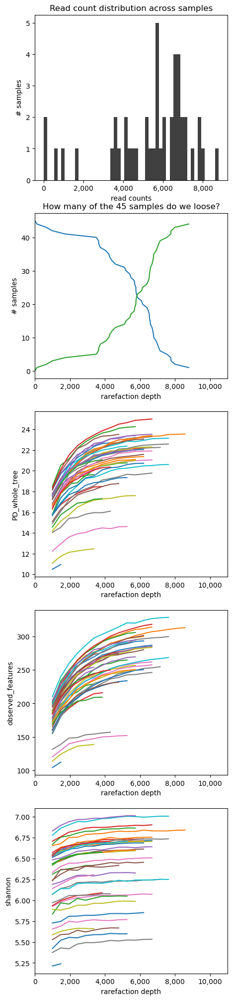

In [20]:
counts_cecal = res_all['counts_plantsremoved'].loc[:, list(set(prj_data['metadata'][prj_data['metadata']["body_site"] == 'cecal'].index) & set(res_all['counts_plantsremoved'].columns))]
x = counts_cecal.T
x['sample'] = list(map(lambda x: x.split('_')[0].split('.')[0], counts_cecal.T.index))
counts_cecal_merged = x.groupby('sample').sum().T
assert counts_cecal_merged.sum().sum() == counts_cecal.sum().sum()

meta_cecal_merged = prj_data['metadata'][prj_data['metadata']["body_site"] == 'cecal']
meta_cecal_merged = meta_cecal_merged.groupby('sample_id').head(1).set_index('sample_id')

_ = rarefaction_curves(
    counts_cecal_merged, 
    reference_tree=prj_data['paths']['insertion_tree'], 
    control_sample_names=idx_control_samples, 
    fix_zero_len_branches=False, # since this has already been corrected via the project_sepp call
    #sample_grouping=meta_cecal_merged["body_site"], 
    max_depth=10000,
    dry=False)

Reduced to 70 samples (feature-table had 159, metadata had 74 samples)
Information: 34 of 753 features have been removed from your Deblur table, since they have less than 10 read counts in all samples combined.
Using existing results from '.anacache/84f57d20bcafc2ad09561775c214b0e3.taxRDP'. 
Using existing results from '.anacache/1e9035e2a74189739ed05e8d3a8e654a.taxRDP'. 
In total, 0 reads (0.000000%) have been filtered for chloroplast/mitochondia removal.
Using existing results from '.anacache/d35334eb951c3330459b8e36a73be96b.rare'. 
Using existing results from '.anacache/8bdf0461e180812498401f87c85f0b5f.rarefy'. 
Using existing results from '.anacache/14a14d40868808333802b9bddbc41df6.adiv'. 
Using existing results from '.anacache/004728d28105275ce46ce3124a96810c.bdiv'. 
Using existing results from '.anacache/394cf03435d1628d4d95d878cf203379.emperor'. 
Your final feature table is composed of 70 samples and 719 features.


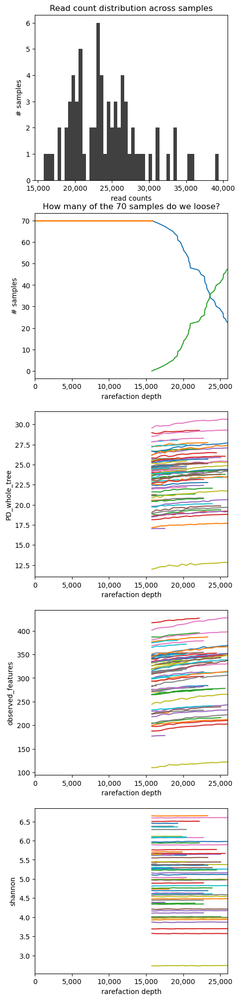

In [21]:
idx_control_samples = set(prj_data['metadata'][pd.isnull(prj_data['metadata']['animal ID'])].index) # set(prj_data['metadata'][prj_data['metadata']['sample_type'] == 'control'].index)
res_feces = process_study(
    metadata=prj_data['metadata'][prj_data['metadata']['body_site'] == 'feces'],
    control_samples=idx_control_samples,
    fp_deblur_biom=prj_data['paths']['deblur_table'],
    fp_insertiontree=prj_data['paths']['insertion_tree'],
    rarefaction_depth=15000,
    fp_taxonomy_trained_classifier_gg138_chloroMitoRemoval='/vol/jlab/MicrobiomeAnalyses/References/Q2-Naive_Bayes_classifiers/gg-13-8-99-nb-classifier_2022.11.qza',
    fp_taxonomy_trained_classifier='/homes/sjanssen/MicrobiomeAnalyses/References/Q2-Naive_Bayes_classifiers/2024.09.backbone.full-length.nb.sklearn-1.4.2.qza',
    tree_insert=prj_data['insertion_tree'],
    is_v4_region=False,
    emperor_fp=prj_data['paths']['Generated/Emperor'],
    emperor_infix='_deblur_feces_',
    dry=False,
    use_grid=True,
    fix_zero_len_branches=False, # since this has already been corrected via the project_sepp call
    ignore_noplantmito=True,
)

Reduced to 44 samples (feature-table had 159, metadata had 49 samples)
Information: 194 of 753 features have been removed from your Deblur table, since they have less than 10 read counts in all samples combined.
Using existing results from '.anacache/ad163a0e575778c7e7a2bfabb0840bd3.taxRDP'. 
Using existing results from '.anacache/eb7e269b2683e492a21faf0d83263019.taxRDP'. 
In total, 0 reads (0.000000%) have been filtered for chloroplast/mitochondia removal.
Using existing results from '.anacache/3629b76525e6f060a363682963e9b158.rare'. 
Using existing results from '.anacache/694b522687753fb5f623c411feed2caf.rarefy'. 
Using existing results from '.anacache/776e4f0b0ca07c2a1033ec601b13adfe.adiv'. 
Using existing results from '.anacache/2afd158e45d5933f29f66e53a0e0237a.bdiv'. 
Using existing results from '.anacache/f89c0c8ba6b4a7e4caa69316d99e544e.emperor'. 
Your final feature table is composed of 40 samples and 558 features.


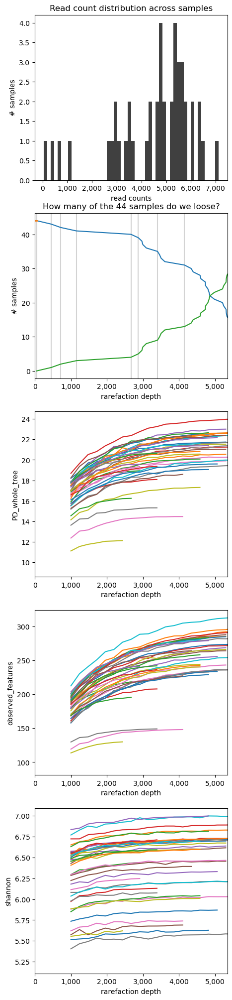

In [22]:
idx_control_samples = set(prj_data['metadata'][pd.isnull(prj_data['metadata']['animal ID'])].index) # set(prj_data['metadata'][prj_data['metadata']['sample_type'] == 'control'].index)
res_cecal = process_study(
    metadata=prj_data['metadata'][prj_data['metadata']['flowcells'] == '@M05620:119:000000000-DLGNK'],
    control_samples=idx_control_samples,
    fp_deblur_biom=prj_data['paths']['deblur_table'],
    fp_insertiontree=prj_data['paths']['insertion_tree'],
    rarefaction_depth=2500,
    fp_taxonomy_trained_classifier_gg138_chloroMitoRemoval='/vol/jlab/MicrobiomeAnalyses/References/Q2-Naive_Bayes_classifiers/gg-13-8-99-nb-classifier_2022.11.qza',
    fp_taxonomy_trained_classifier='/homes/sjanssen/MicrobiomeAnalyses/References/Q2-Naive_Bayes_classifiers/2024.09.backbone.full-length.nb.sklearn-1.4.2.qza',
    tree_insert=prj_data['insertion_tree'],
    is_v4_region=False,
    emperor_fp=prj_data['paths']['Generated/Emperor'],
    emperor_infix='_deblur_cecal_',
    dry=False,
    use_grid=True,
    fix_zero_len_branches=False, # since this has already been corrected via the project_sepp call
    ignore_noplantmito=True,
)

# Analysing raw seq data, split by body-site

In [23]:
# drop the first run of cecal samples!
prj_data['metadata'] = prj_data['metadata'][prj_data['metadata']['flowcells'] != '@M05620:118:000000000-DLGPR']

## Correlation: within metadata
Without knowing too much about the metadata, let is check if the different columns correlate with each other. If so, we have redundant information and it might be worth ignoring one of the columns in downstream analysis.

We need to classify metadata columns into four categories to optimally harvest statistical power:
  - dates, e.g. `collection_timestamp`: `2021-12-06 00:00:00`
  - interval data, e.g. `host_height` in cm: `186`
  - ordinal data, e.g. `shower_frequency`: `once per week` < `every day` < `multiple times per day`
  - categorial data, e.g. `genotype`: `balb`, `black6`

In [24]:
cols_ignore = set([
    'age [weeks]', # as age is inferred from timepoint
    "GEAR 57", # only given for cecal samples and seems to be another ID for the animals
    'birth_date', # has been computed as collection_date - age [weeks]
    'body_site', # as a duplicat of "sample type", but "sample type" also hold negative tags
    'flowcells', # as fecal and cecal have been sequenced on different flowcells
    "feces [mg]", "DNA / mg feces", # as their product is 'c [ng/µl]'
    'reads', 'c [ng/µl]', 'A260/280', # exclude these per sample technical information
])
for c in prj_data['metadata'].columns:
    if prj_data['metadata'][c].dropna().unique().shape[0] == 1:
        # ignore column, since it contains only ONE value for all samples
        cols_ignore.add(c)
    if prj_data['metadata'][c].dropna().unique().shape[0] == prj_data['metadata'][c].dropna().shape[0]:
        # ignore column, since every sample comes with another value
        cols_ignore.add(c)

cols_date = { # a dictionary where key = column name and value = format string to correctly parse date information
    'collection_date': '%Y-%m-%d',
}
cols_interval = set([
    # host_height, 
])
cols_ordinal = { # note this is a dictionary with keys = column names and values = lists of potential strings in the metadata ORDERED in the list
    # 'shower_frequency': ['once per week', 'every day', 'multiple times per day'],
}
cols_categorial = set([
    'animal ID', 'sex', 'condition', 'timepoint',
    'sample type', 'cage', 
])

In [25]:
# use this output to decide how to classify remaining metadata columns
# when done, this function should not output anything
for c in prj_data['metadata'].columns:
    if c in cols_ordinal.keys() or c in cols_ignore or c in cols_categorial or c in cols_date.keys() or c in cols_interval:
        continue
    display(prj_data['metadata'][c].value_counts(dropna=False).to_frame())

,animal ID,cage,collection_date,condition,sample type,sex,timepoint
animal ID,1.000000,0.863075,0.000134,0.822147,0.000000,0.822147,0.000000
cage,0.863075,1.000000,0.000619,0.952579,0.000000,0.952579,0.000000
collection_date,0.000134,0.000619,1.000000,0.002635,0.009174,0.007511,0.009259
condition,0.822147,0.952579,0.002635,1.000000,0.000000,0.000000,0.000000
sample type,0.000000,0.000000,0.009174,0.000000,1.000000,0.000000,0.468479
sex,0.822147,0.952579,0.007511,0.000000,0.000000,1.000000,0.000000
timepoint,0.000000,0.000000,0.009259,0.000000,0.468479,0.000000,1.000000


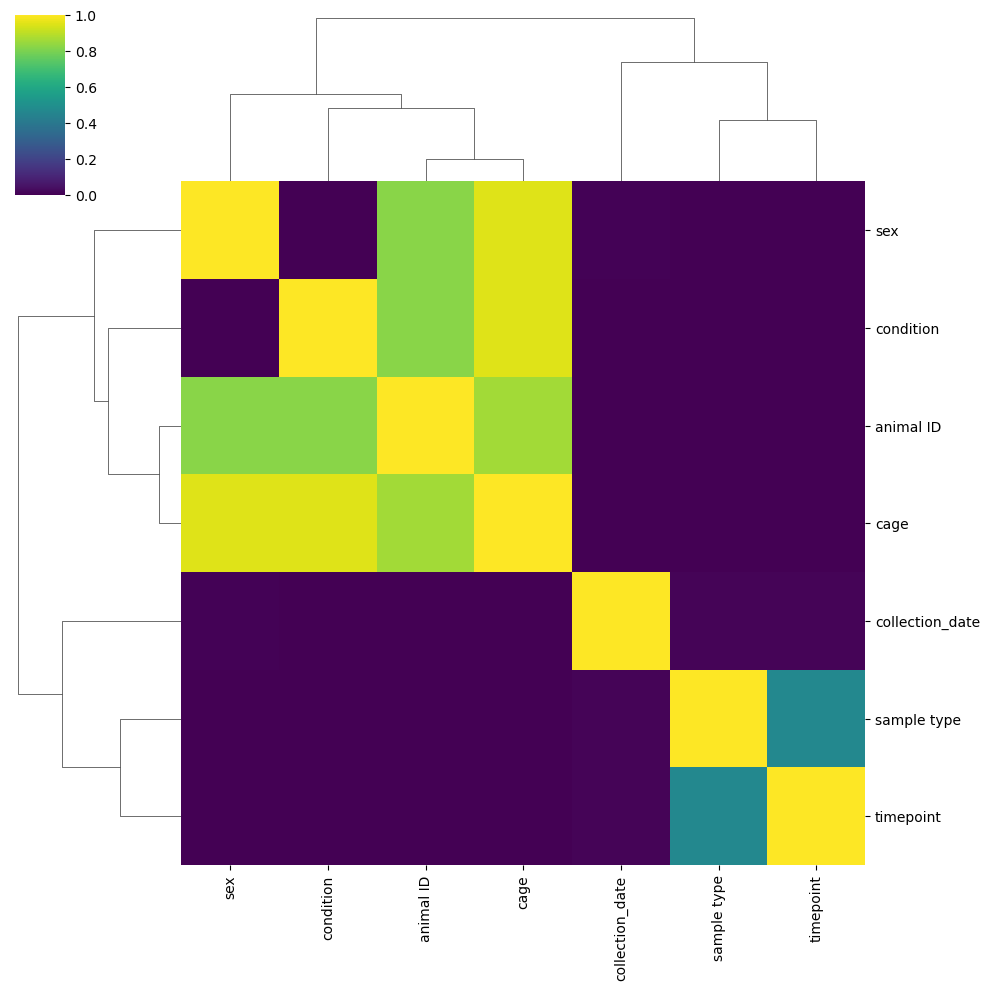

In [26]:
res_corrmeta = correlate_metadata(prj_data['metadata'][list(set(prj_data['metadata'].columns) - set(cols_ignore))], 
                                  categorials=list(cols_categorial), ordinals=cols_ordinal, dates=cols_date, intervals=list(cols_interval))
display(res_corrmeta[1])

## Correlation: metadata with microbiome
We are throwing a whole arsenal of statistical tests on multiple metrics to the data to find something that looks significant. Go through the resulting table of p-values and look for significant ones that you can further investigate

In [534]:
corr_diversity_feces = correlation_diversity_metacolumns(
    prj_data['metadata'][sorted(list(set(cols_categorial) | set(cols_date.keys()) | set(cols_ordinal.keys()) | set(cols_interval)))].fillna('NaN'),
    list(sorted(set(cols_categorial) | set(cols_ordinal.keys()))),
    res_feces['alpha_diversity']['results'], 
    res_feces['beta_diversity']['results'],
    dry=False, wait=False, use_grid=True, dirty=True)

Reducing analysis to 70 samples.
Using existing results from '.anacache/ec599f401cf2dcf590d725a94d819072.corr-divmeta'. 


In [537]:
corr_diversity_cecal = correlation_diversity_metacolumns(
    prj_data['metadata'][sorted(list(set(cols_categorial) | set(cols_date.keys()) | set(cols_ordinal.keys()) | set(cols_interval)))].fillna('NaN'),
    list(sorted(set(cols_categorial) | set(cols_ordinal.keys()))),
    res_cecal['alpha_diversity']['results'], 
    res_cecal['beta_diversity']['results'],
    dry=False, wait=False, use_grid=True, dirty=True, nocache=True)

Reducing analysis to 40 samples.
found matching working dir "/homes/sjanssen/TMP/ana_corr-divmeta_bojrwkuy"


In [540]:
corr_diversity = {'results': pd.concat([corr_diversity_feces['results'], corr_diversity_cecal['results']])}
pd.pivot_table(data=corr_diversity['results'], columns='column', index=['div','type','metric','test'], values='p-value', aggfunc=np.min).fillna("")

column                                                                  __fake_qiime2_numcol  \
div   type               metric             test                                               
alpha correlation        PD_whole_tree      pearson                                   0.0001   
                         observed_features  pearson                                   0.0002   
                         shannon            pearson                                   0.0016   
      group-significance PD_whole_tree      Kruskal-Wallis (all groups)                        
                         observed_features  Kruskal-Wallis (all groups)                        
                         shannon            Kruskal-Wallis (all groups)                        
beta  group-significance bray_curtis        anosim                                             
                                            permanova                                          
                         unweighted_unifrac anosim                                             
                                            permanova                                          
                         weighted_unifrac   anosim                                             
                                            permanova                                          

column                                                                  animal%20ID  \
div   type               metric             test                                      
alpha correlation        PD_whole_tree      pearson                                   
                         observed_features  pearson                                   
                         shannon            pearson                                   
      group-significance PD_whole_tree      Kruskal-Wallis (all groups)    0.337885   
                         observed_features  Kruskal-Wallis (all groups)    0.337886   
                         shannon            Kruskal-Wallis (all groups)    0.421159   
beta  group-significance bray_curtis        anosim                                    
                                            permanova                                 
                         unweighted_unifrac anosim                                    
                                            permanova                                 
                         weighted_unifrac   anosim                                    
                                            permanova                                 

column                                                                       cage  \
div   type               metric             test                                    
alpha correlation        PD_whole_tree      pearson                                 
                         observed_features  pearson                                 
                         shannon            pearson                                 
      group-significance PD_whole_tree      Kruskal-Wallis (all groups)  0.014286   
                         observed_features  Kruskal-Wallis (all groups)  0.009566   
                         shannon            Kruskal-Wallis (all groups)  0.104006   
beta  group-significance bray_curtis        anosim                          0.001   
                                            permanova                       0.001   
                         unweighted_unifrac anosim                          0.001   
                                            permanova                       0.001   
                         weighted_unifrac   anosim                          0.001   
                                            permanova                       0.001   

column                                                                  collection_date  \
div   type               metric             test                                          
alpha correlation        PD_whole_tree      pearson            

collapse above table to smallest p-value per column.

In [541]:
sig_cols = {k for k,v in corr_diversity['results'].groupby('column')['p-value'].min().iteritems() 
            if v < 0.05 
            if k != '__fake_qiime2_numcol'}
display(corr_diversity['results'][corr_diversity['results']['column'].isin(sig_cols)].groupby('column')['p-value'].min())

/tmp/ipykernel_1120929/2665748023.py:1: FutureWarning: iteritems is deprecated and will be removed in a future version. Use .items instead.
  sig_cols = {k for k,v in corr_diversity['results'].groupby('column')['p-value'].min().iteritems()


column
cage               1.000000e-03
collection_date    3.040616e-06
condition          1.000000e-03
sample%20type      1.168468e-03
sex                2.994821e-05
timepoint          1.814571e-07
Name: p-value, dtype: float64

In [553]:
# subset columns to those that significantly correlate with microbiome data
# you should manually reduce the number of columns you want to investigate, 
# since every addition of a column costs a lot of statistical power and a too complex model might find nothing at all!
model_cols_date = {k: v for k,v in cols_date.items() if k in sig_cols}
model_cols_interval = {c for c in cols_interval if c in sig_cols}
model_cols_ordinal = {k: v for k,v in cols_ordinal.items() if k in sig_cols}
model_cols_categorial = set(['cage', 'sex']) #{c for c in cols_categorial if c in sig_cols}#set(['sex', 'timepoint'])# {c for c in cols_categorial if c in sig_cols}

Using existing results from '.anacache/bf312bfab25957b988ce15fbb3382fe7.fRDAalpha'. 
No significant findings.
Using existing results from '.anacache/207406bd87cf0a2c282d5a98b0f56264.fRDAalpha'. 
No significant findings.
Using existing results from '.anacache/c211b33dcb04f262f516a810dff1ddb9.fRDAalpha'. 
No significant findings.
Using existing results from '.anacache/aa29e874a75d94d2c9a2bd72a3dd218d.fRDAbeta'. 
Using existing results from '.anacache/beff054e73ace55fb1eb045f4d6b455c.fRDAbeta'. 
Using existing results from '.anacache/8eaeea87b8e908105b8015c1741de976.fRDAbeta'. 
Using existing results from '.anacache/d9b8ca71761d3917d210c9525258446a.fRDAalpha'. 
Using existing results from '.anacache/e9e6bd2a250c7a72a9a1746808036d26.fRDAalpha'. 
Using existing results from '.anacache/c7b7684e0fa22a1af5c6d0acb08dc15a.fRDAalpha'. 
No significant findings.
Using existing results from '.anacache/d1f4df0b2a5363b3360d71425bdf3be2.fRDAbeta'. 
Using existing results from '.anacache/0ce5077992a3fc7

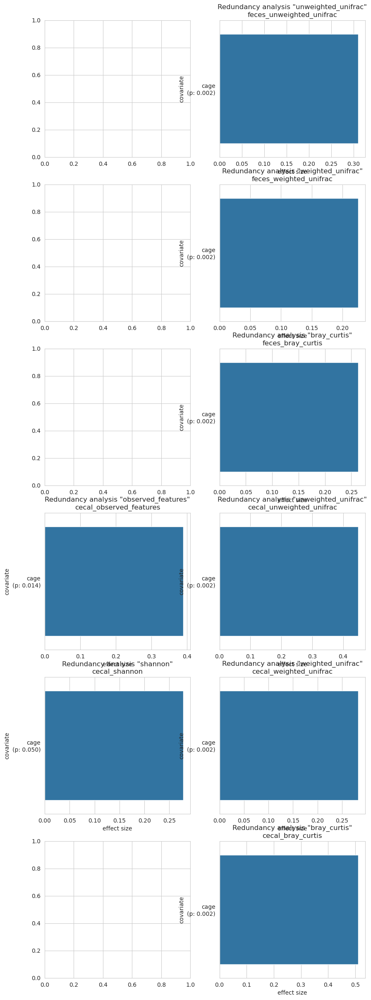

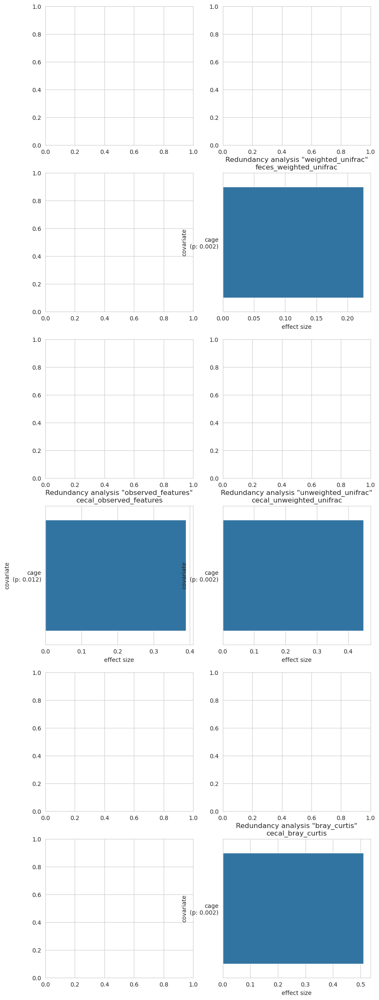

In [578]:
def check_convolution(fields, meta, list_res, labels, usegrid=True):
    sns.set_style("whitegrid")
    
    num_rows = 0
    for res in list_res:
        num_rows += max(len(res['alpha_diversity']['results'].keys()), len(res['beta_diversity']['results'].keys()))
    fig, axes = plt.subplots(num_rows, 2, figsize=(5*2, 5*num_rows))

    row = 0
    for j in range(len(list_res)):
        for i, metric in enumerate(list_res[j]['alpha_diversity']['results'].keys()):
            redundancy_analysis_alpha(meta[fields],
                                      list_res[j]['alpha_diversity']['results'][metric],
                                      categorials=fields,
                                      ax=axes[row+i][0], title='%s_%s' % (labels[j], metric),
                                      dry=False, wait=False, use_grid=usegrid)
        for i, metric in enumerate(list_res[j]['beta_diversity']['results'].keys()):
            redundancy_analysis_beta(meta[fields],
                                     list_res[j]['beta_diversity']['results'][metric], metric,
                                     categorials=fields,
                                     ax=axes[row+i][1], title='%s_%s' % (labels[j], metric),
                                     dry=False, wait=False, use_grid=usegrid)
        row += max(len(list_res[j]['alpha_diversity']['results'].keys()), len(list_res[j]['beta_diversity']['results'].keys()))

check_convolution(['sex', 'cage'], prj_data['metadata'], [res_feces, res_cecal], labels=['feces', 'cecal'])
check_convolution(['condition', 'cage'], prj_data['metadata'], [res_feces, res_cecal], labels=['feces', 'cecal'])

found matching working dir "/homes/sjanssen/TMP/ana_fRDAalpha_ul880nzk"
 Was removed.
No significant findings.
found matching working dir "/homes/sjanssen/TMP/ana_fRDAalpha_s9nic5dh"
 Was removed.
found matching working dir "/homes/sjanssen/TMP/ana_fRDAalpha_6lyq4dh0"
 Was removed.
No significant findings.
found matching working dir "/homes/sjanssen/TMP/ana_fRDAbeta_jknzse3n"
 Was removed.
found matching working dir "/homes/sjanssen/TMP/ana_fRDAbeta_6nv2s8rx"
 Was removed.
found matching working dir "/homes/sjanssen/TMP/ana_fRDAbeta_l48igl69"
 Was removed.


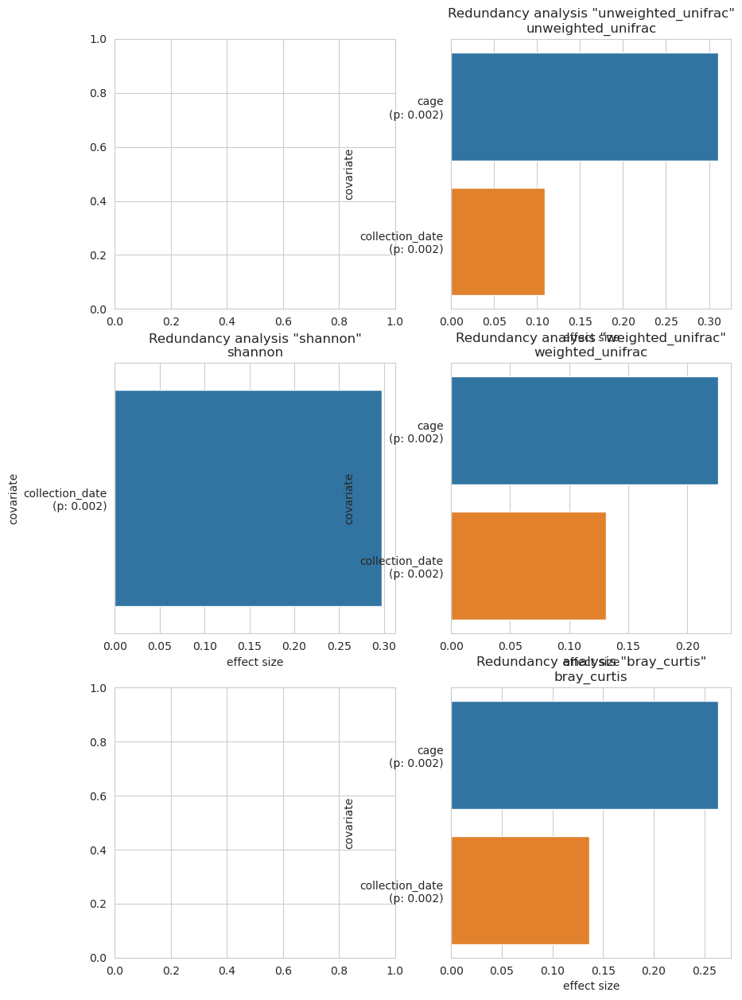

In [561]:
sns.set_style("whitegrid")
usegrid = True

max_rows = max(len(res_feces['alpha_diversity']['results'].keys()), len(res_feces['beta_diversity']['results'].keys()))
fig, axes = plt.subplots(max_rows, 2, figsize=(5*2, 5*max_rows))
for i, metric in enumerate(res_feces['alpha_diversity']['results'].keys()):
    redundancy_analysis_alpha(prj_data['metadata'][sorted(list(set(model_cols_categorial) | set(model_cols_date.keys()) | set(model_cols_ordinal.keys()) | set(model_cols_interval)))],
                              res_feces['alpha_diversity']['results'][metric],
                              categorials=list(model_cols_categorial), intervals=list(model_cols_interval), dates=model_cols_date, ordinals=model_cols_ordinal,
                              ax=axes[i][0], title='%s' % metric,
                              dry=False, wait=False, use_grid=usegrid)
for i, metric in enumerate(res_feces['beta_diversity']['results'].keys()):
    redundancy_analysis_beta(prj_data['metadata'][sorted(list(set(model_cols_categorial) | set(model_cols_date.keys()) | set(model_cols_ordinal.keys()) | set(model_cols_interval)))],
                             res_feces['beta_diversity']['results'][metric], metric,
                             categorials=list(model_cols_categorial), intervals=list(model_cols_interval), dates=model_cols_date, ordinals=model_cols_ordinal,
                             ax=axes[i][1], title='%s' % metric,
                             dry=False, wait=False, use_grid=usegrid)

In [ ]:
sns.set_style("whitegrid")
usegrid = True

max_rows = max(len(res_all['alpha_diversity']['results'].keys()), len(res_all['beta_diversity']['results'].keys()))
fig, axes = plt.subplots(max_rows, 2, figsize=(5*2, 5*max_rows))
for i, metric in enumerate(res_all['alpha_diversity']['results'].keys()):
    redundancy_analysis_alpha(prj_data['metadata'][sorted(list(set(model_cols_categorial) | set(model_cols_date.keys()) | set(model_cols_ordinal.keys()) | set(model_cols_interval)))],
                              res_all['alpha_diversity']['results'][metric],
                              categorials=list(model_cols_categorial), intervals=list(model_cols_interval), dates=model_cols_date, ordinals=model_cols_ordinal,
                              ax=axes[i][0], title='%s' % metric,
                              dry=False, wait=False, use_grid=usegrid)
for i, metric in enumerate(res_all['beta_diversity']['results'].keys()):
    redundancy_analysis_beta(prj_data['metadata'][sorted(list(set(model_cols_categorial) | set(model_cols_date.keys()) | set(model_cols_ordinal.keys()) | set(model_cols_interval)))],
                             res_all['beta_diversity']['results'][metric], metric,
                             categorials=list(model_cols_categorial), intervals=list(model_cols_interval), dates=model_cols_date, ordinals=model_cols_ordinal,
                             ax=axes[i][1], title='%s' % metric,
                             dry=False, wait=False, use_grid=usegrid)

In [331]:
dms = dict()
for (bodysite, beta) in [('feces', res_feces['beta_diversity']['results']),
                         ('cecal', res_cecal['beta_diversity']['results'])]:
    for metric in beta.keys():
        dms[(bodysite, metric)] = beta[metric].to_data_frame()

In [332]:
data = []

# strict within cage comparisons
for (bs, tp, cage), g in prj_data['metadata'].groupby(['body_site', 'timepoint', 'cage']):
    for (bs_beta, metric) in dms.keys():
        if bs == bs_beta:
            avail_idx = set(g.index) & set(dms[(bs_beta, metric)].index)
            for a, b in combinations(list(avail_idx), 2):
                data.append([bs, tp, cage, 'const_bs_tp_sex__intra_cage', a, b, dms[(bs_beta, metric)].loc[a, b], metric, 
                             g.loc[[a,b], 'sex'].unique()[0],
                             g.loc[[a,b], 'condition'].unique()[0]
                            ])

# across cages, but within same bodysite, sex, timepoint and condition
for (bs, sex, tp, cond), g in prj_data['metadata'].groupby(['body_site', 'sex', 'timepoint', 'condition']):
    for (bs_beta, metric) in dms.keys():
        if bs == bs_beta:
            avail_idx = set(g.index) & set(dms[(bs_beta, metric)].index)
            for a, b in combinations(list(avail_idx), 2):
                data.append([bs, tp, cage, 'const_bs_tp_sex_cond__acrossCages', a, b, dms[(bs_beta, metric)].loc[a, b], metric, sex, cond])

# beta change over time per animal
for (bs, cage, sex, condition, animalID), g in prj_data['metadata'].groupby(['body_site', 'cage', 'sex', 'condition', 'animal ID']):
    for (bs_beta, metric) in dms.keys():
            if bs == bs_beta:
                avail_idx = set(g.index) & set(dms[(bs_beta, metric)].index)
                for a, b in combinations(list(avail_idx), 2):
                    data.append([bs, '0w to 12w', cage, 'deriv_animalID_time', a, b, dms[(bs_beta, metric)].loc[a, b], metric, sex, condition])

if False:
    for (bs, tp, cage), g in prj_data['metadata'].groupby(['body_site', 'timepoint', 'sex']):
        for (bs_beta, metric) in dms.keys():
            if bs == bs_beta:
                avail_idx = set(g.index) & set(dms[(bs_beta, metric)].index)
                for a, b in combinations(list(avail_idx), 2):
                    if g.loc[[a, b], 'cage'].unique().shape[0] < 2:
                        continue
                    data.append([bs, tp, cage, 'const_bs_tp_sex__inter_cage', a, b, dms[(bs_beta, metric)].loc[a, b], metric, 
                                 g.loc[[a, b], 'sex'].unique()[0],
                                 g.loc[[a, b], 'condition'].unique()[0]
                                ])

data = pd.DataFrame(data, columns=['body_site', 'timepoint', 'cage', 'cmp', 'idx_a', 'idx_b', 'distance', 'metric', 'sex', 'condition'])
#data = data[data['metric'] == 'unweighted_unifrac']

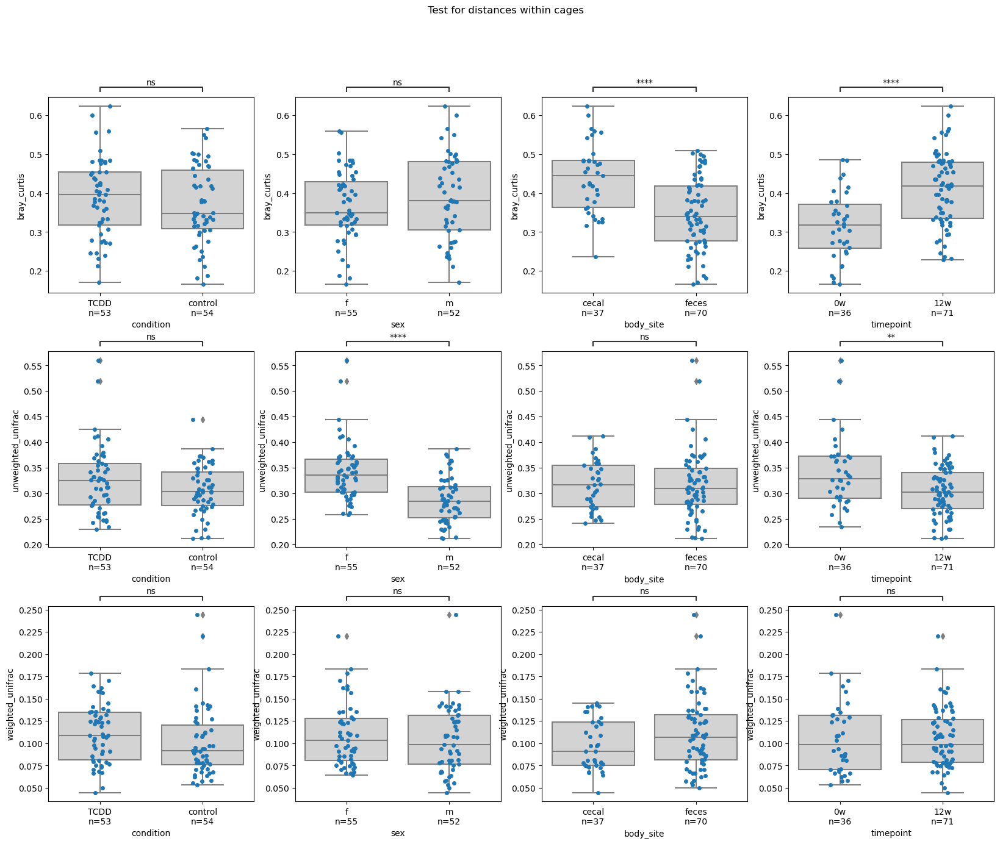

In [333]:
plotdata = data[data['cmp'] == 'const_bs_tp_sex__intra_cage']

fields = ['condition', 'sex', 'body_site', 'timepoint']
fig, axes = plt.subplots(data['metric'].unique().shape[0], len(fields), figsize=(5*len(fields), 5*data['metric'].unique().shape[0]))
fig.subplots_adjust(hspace=0.3)
y = 'distance'

for (ax_row, (metric, metric_data)) in zip(axes, plotdata.groupby('metric')):
    for ax, field in zip(ax_row, fields):
        order = sorted(metric_data[field].unique())
        sns.boxplot(data=metric_data, y=y, x=field, ax=ax, order=order, color='lightgray')
        sns.stripplot(data=metric_data, y=y, x=field, ax=ax, order=order)
        ax.set_ylabel(metric)
    
        annotator = Annotator(ax, [tuple(order)], data=metric_data, y=y, x=field, order=order)
        annotator.configure(test='Mann-Whitney', text_format='star', loc='outside', comparisons_correction="fdr_bh", correction_format="default", verbose=False)
        annotator.apply_and_annotate()

        num_data = metric_data.groupby(field).size()
        ax.set_xticks(ax.get_xticks(), ['%s\nn=%i' % (t.get_text(), num_data.loc[t.get_text()]) for t in ax.get_xticklabels()])
    
_ = fig.suptitle('Test for distances within cages')

In [513]:
COLORS_SEX = {'f': ['#f9ecf9ff', '#f3d8f3ff'],
              'm': ['#ebebf9ff', '#d8d8f3ff']}
def plot_level2(field, subfields, data, cross_sub='no', addlabel="", return_figure=False):
    fields = [f for f in subfields if f != field]
    fig, axes = plt.subplots(data['metric'].unique().shape[0], len(fields), figsize=(5*len(fields), 5*data['metric'].unique().shape[0]))
    fig.subplots_adjust(hspace=0.3)
    y = 'distance'

    if data['metric'].unique().shape[0] <= 1:
        axes = [axes]
    for (ax_row, (metric, metric_data)) in zip(axes, data.groupby('metric')):
        if len(fields) <= 1:
            ax_row = [ax_row]
        for ax, subfield in zip(ax_row, fields):
            hue_order = sorted(metric_data[subfield].unique())
            order = sorted(metric_data[field].unique())
            
            color, palette = 'lightgray', None
            if (subfield != 'sex') & (field != 'sex') & (metric_data['sex'].unique().shape[0] < 2):
                color, palette = None, COLORS_SEX.get(''.join(metric_data['sex'].unique()))
            #if field == 'sex':
            #    print(hue_order, order)
            #    color, palette = None, {a: COLORS_SEX['f'][1] for a in hue_order}
            #    color, palette = None, {f"{sex}-{a}": COLORS_SEX[sex][hue_order.index(a)] for a in hue_order for sex in order}
            #    print(palette, color)
                
            #if subfield == 'sex':
            sns.boxplot(data=metric_data, y=y, x=field, hue=subfield, ax=ax, order=order, hue_order=hue_order, color=color, palette=palette)
            sns.stripplot(data=metric_data, y=y, x=field, hue=subfield, ax=ax, order=order, hue_order=hue_order, dodge=True)
            ax.set_ylabel(metric)
            
            handles, labels = ax.get_legend_handles_labels()
            ax.legend(handles[-1 * int(len(handles)/2):], labels[-1 * int(len(labels)/2):])

            cmps = []
            if cross_sub in ['no', 'both']:
                cmps.extend([((x, hue_order[0]), (x, hue_order[1])) for x in order if metric_data[metric_data[field] == x][subfield].unique().shape[0] >= 2])
            if cross_sub == 'yes':
                cmps = []
            if cross_sub in ['yes', 'both']:
                cmps.extend([((order[0], y), (order[1], y)) for y in hue_order])
            annotator = Annotator(ax, cmps, 
                                  data=metric_data, y=y, x=field, order=order, hue=subfield, hue_order=hue_order)
            annotator.configure(test='Mann-Whitney', text_format='star', loc='inside', comparisons_correction="fdr_bh", correction_format="default", verbose=False)
            annotator.apply_and_annotate()

            num_data = metric_data.groupby([field, subfield]).size().to_dict()
            ax.set_xticks(ax.get_xticks(), ['%s\nn=%i, %i' % tuple([t.get_text()] + [num_data.get((t.get_text(), sf), 0) for sf in hue_order]) for t in ax.get_xticklabels()])
        
    _ = fig.suptitle('%s%s: Test for distances within cages' % (addlabel, field.upper()))
    if return_figure:
        return fig

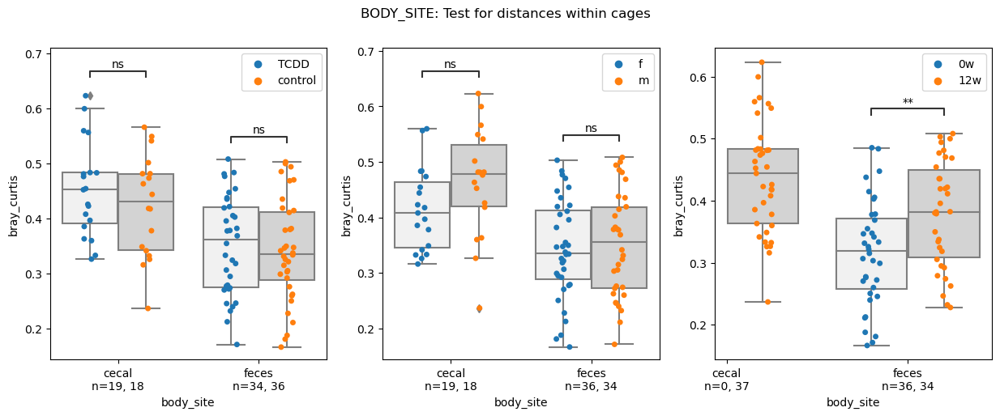

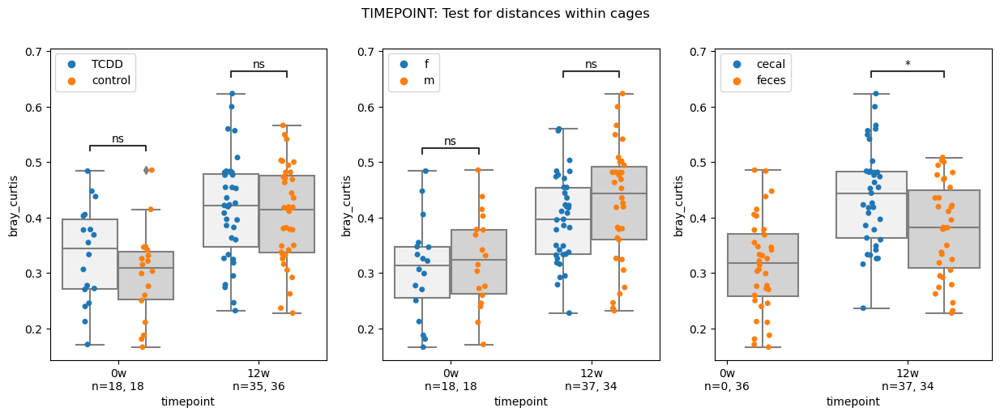

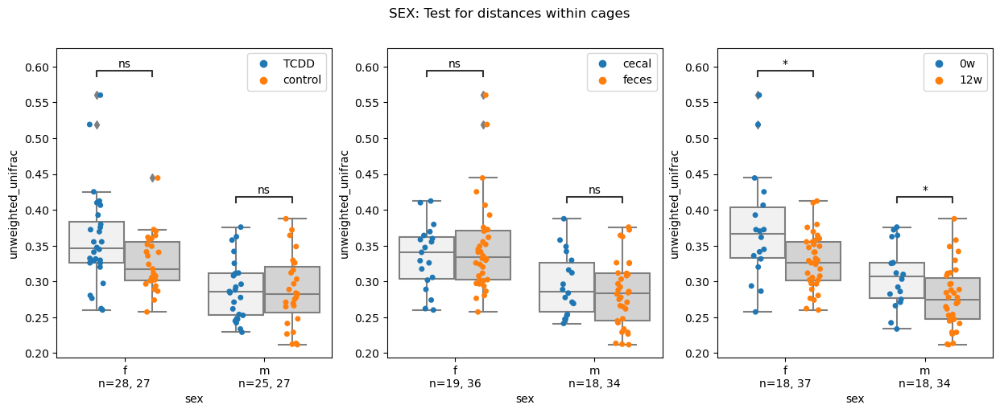

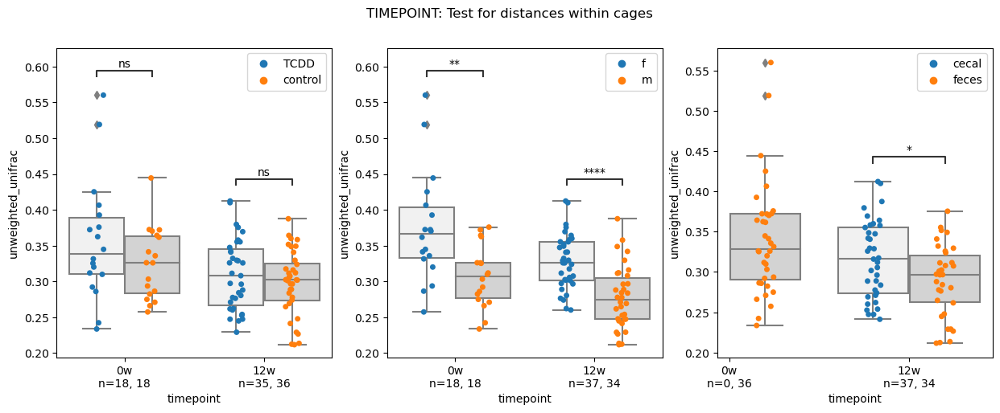

In [346]:
plotdata = data[(data['cmp'] == 'const_bs_tp_sex__intra_cage') & (data['metric'] == 'bray_curtis')]
plot_level2('body_site', ['condition', 'sex', 'body_site', 'timepoint'], plotdata)
plot_level2('timepoint', ['condition', 'sex', 'body_site', 'timepoint'], plotdata)

plotdata = data[(data['cmp'] == 'const_bs_tp_sex__intra_cage') & (data['metric'] == 'unweighted_unifrac')]
plot_level2('sex', ['condition', 'sex', 'body_site', 'timepoint'], plotdata)
plot_level2('timepoint', ['condition', 'sex', 'body_site', 'timepoint'], plotdata)

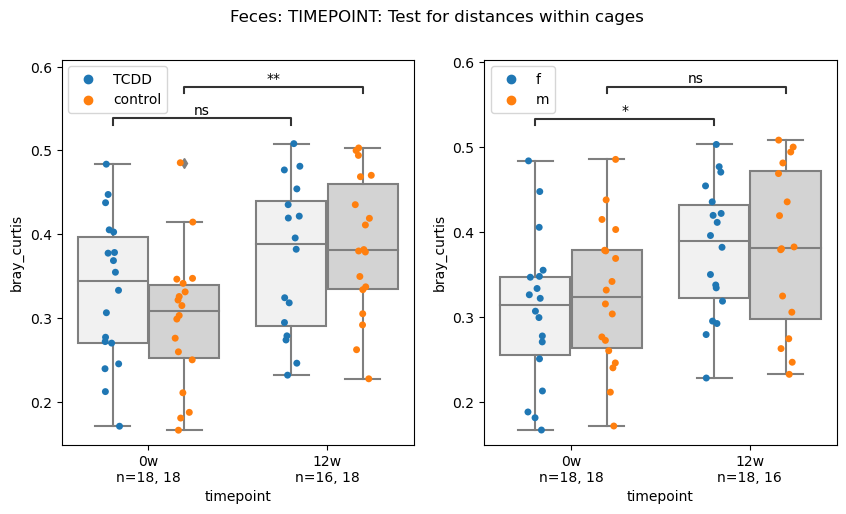

In [278]:
plotdata = data[(data['cmp'] == 'const_bs_tp_sex__intra_cage') & (data['metric'] == 'bray_curtis') & (data['body_site'] == 'feces')]
x = plot_level2('timepoint', ['condition', 'sex'], plotdata, cross_sub='yes', addlabel='Feces: ')

In [511]:
plotdata[(plotdata['timepoint'] == '0w') &  (plotdata['condition'] == 'control') & (plotdata['metric'] == 'bray_curtis') ].sort_values(by='distance')

,body_site,timepoint,cage,cmp,idx_a,idx_b,distance,metric,sex,condition
155,feces,0w,2,const_bs_tp_sex__intra_cage,5_S5_L001_R1_001,4_S4_L001_R1_001,0.211200,bray_curtis,m,control
154,feces,0w,2,const_bs_tp_sex__intra_cage,6_S6_L001_R1_001,4_S4_L001_R1_001,0.260000,bray_curtis,m,control
163,feces,0w,3,const_bs_tp_sex__intra_cage,8_S8_L001_R1_001,9_S9_L001_R1_001,0.276267,bray_curtis,m,control
162,feces,0w,3,const_bs_tp_sex__intra_cage,8_S8_L001_R1_001,7_S7_L001_R1_001,0.303333,bray_curtis,m,control
153,feces,0w,2,const_bs_tp_sex__intra_cage,6_S6_L001_R1_001,5_S5_L001_R1_001,0.315133,bray_curtis,m,control
164,feces,0w,3,const_bs_tp_sex__intra_cage,7_S7_L001_R1_001,9_S9_L001_R1_001,0.331467,bray_curtis,m,control
119,feces,0w,1,const_bs_tp_sex__intra_cage,3_S3_L001_R1_001,2_S2_L001_R1_001,0.341600,bray_curtis,m,control
117,feces,0w,1,const_bs_tp_sex__intra_cage,1_S1_L001_R1_001,3_S3_L001_R1_001,0.414667,bray_curtis,m,control
118,feces,0w,1,const_bs_tp_sex__intra_cage,1_S1_L001_R1_001,2_S2_L001_R1_001,0.485400,bray_curtis,m,control


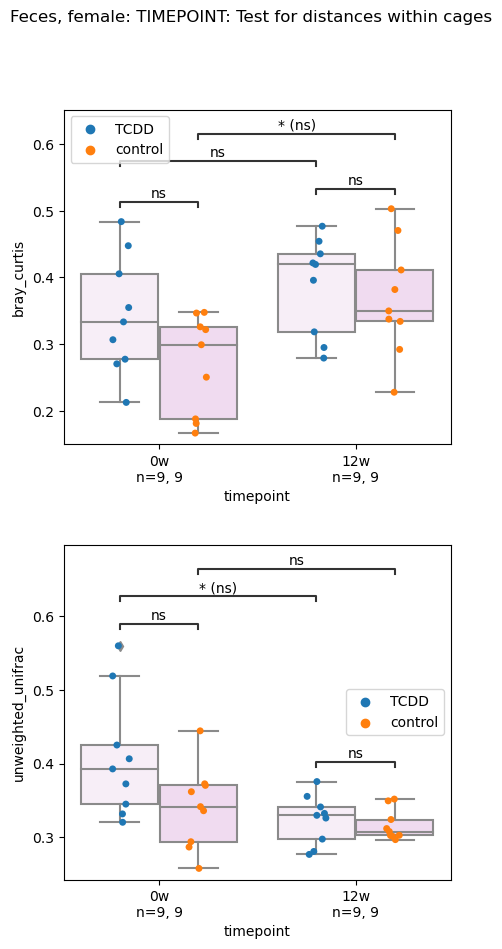

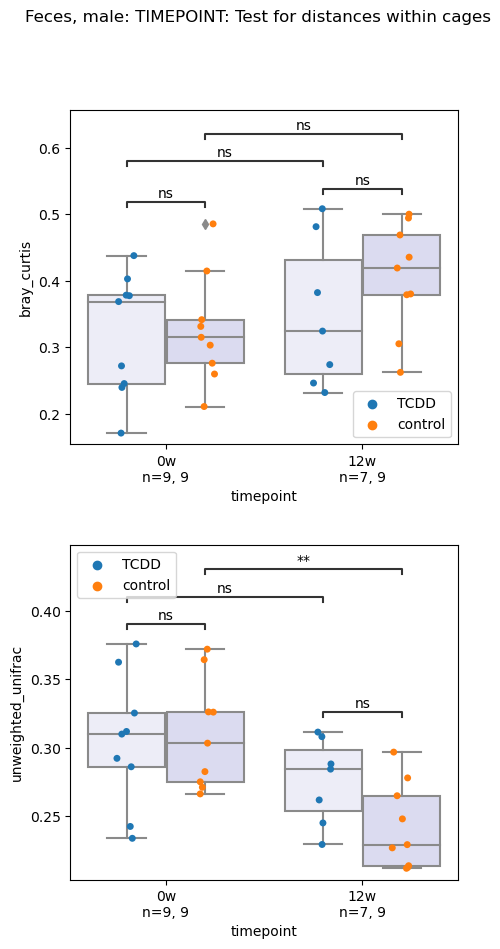

In [515]:
plotdata = data[(data['cmp'] == 'const_bs_tp_sex__intra_cage') & (data['metric'].isin(['bray_curtis', 'unweighted_unifrac'])) & (data['body_site'] == 'feces') & (data['sex'] == 'f')]
x = plot_level2('timepoint', ['condition'], plotdata, cross_sub='both', addlabel='Feces, female: ', return_figure=True)
x.savefig('Generated/control_check_allonecage.svg')

plotdata = data[(data['cmp'] == 'const_bs_tp_sex__intra_cage') & (data['metric'].isin(['bray_curtis', 'unweighted_unifrac'])) & (data['body_site'] == 'feces') & (data['sex'] == 'm')]
x = plot_level2('timepoint', ['condition'], plotdata, cross_sub='both', addlabel='Feces, male: ')


## Beta, across cages within same time, bodysite, condition and sex

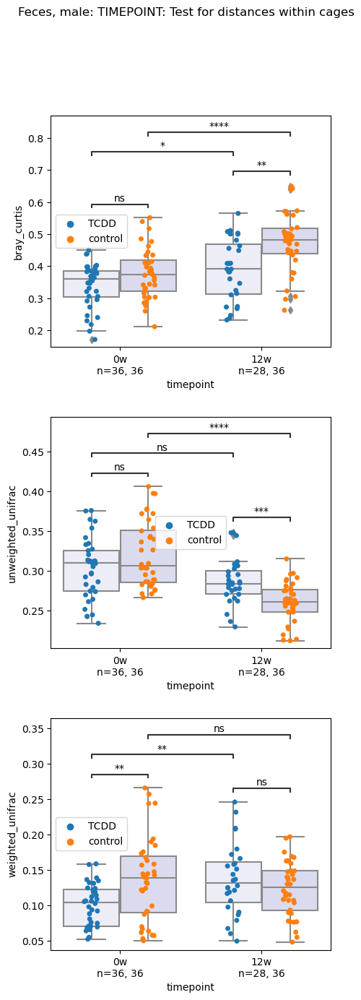

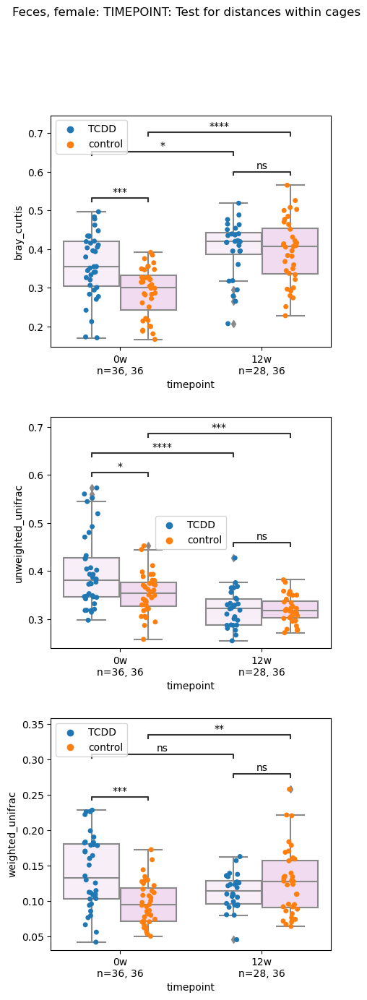

In [499]:
plotdata = data[(data['cmp'] == 'const_bs_tp_sex_cond__acrossCages') & (data['body_site'] == 'feces') & (data['sex'] == 'm')]
x = plot_level2('timepoint', ['condition'], plotdata, cross_sub='both', addlabel='Feces, male: ')

plotdata = data[(data['cmp'] == 'const_bs_tp_sex_cond__acrossCages') & (data['body_site'] == 'feces') & (data['sex'] == 'f')]
x = plot_level2('timepoint', ['condition'], plotdata, cross_sub='both', addlabel='Feces, female: ')


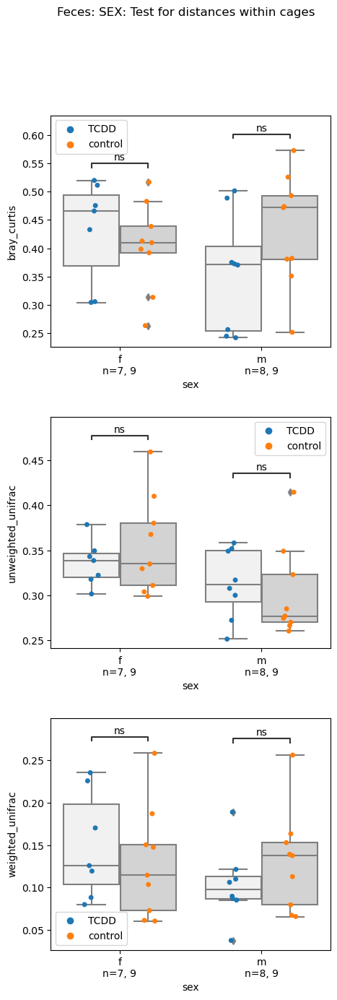

In [280]:
plotdata = data[(data['cmp'] == 'deriv_animalID_time') & (data['body_site'] == 'feces')]
x = plot_level2('sex', ['condition'], plotdata, cross_sub=False, addlabel='Feces: ')


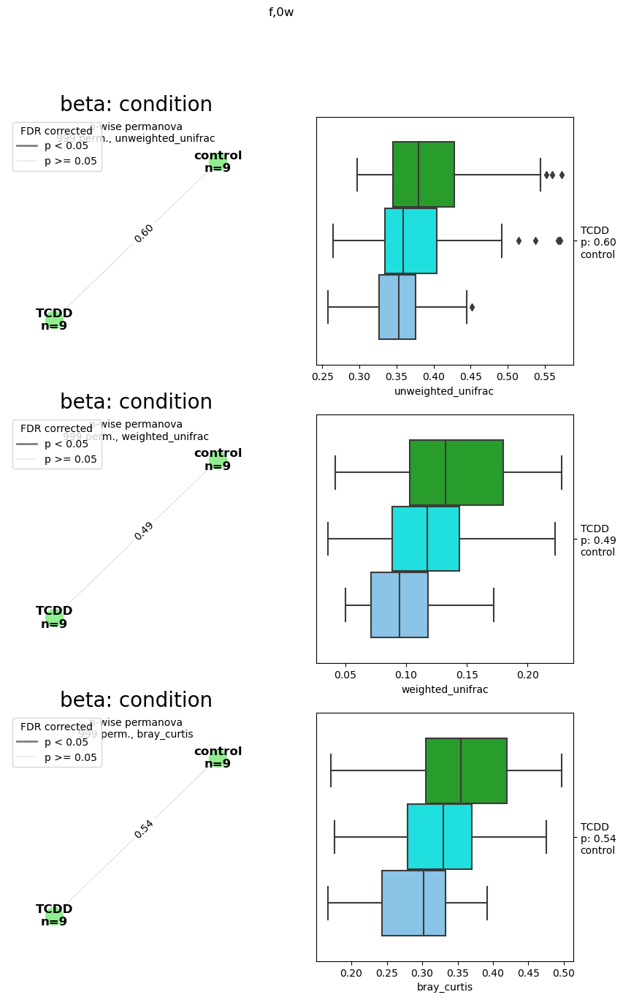

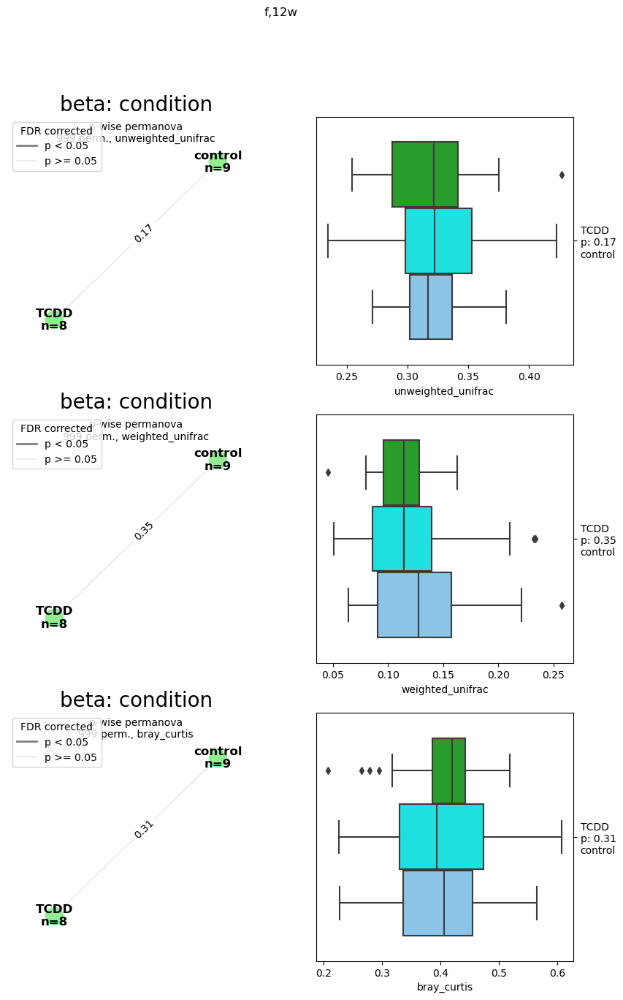

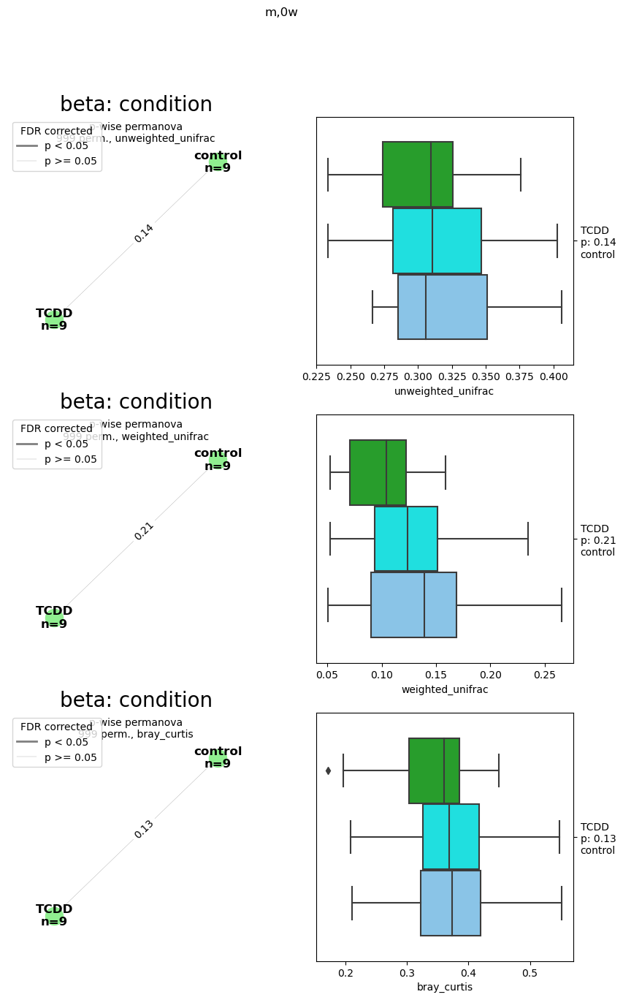

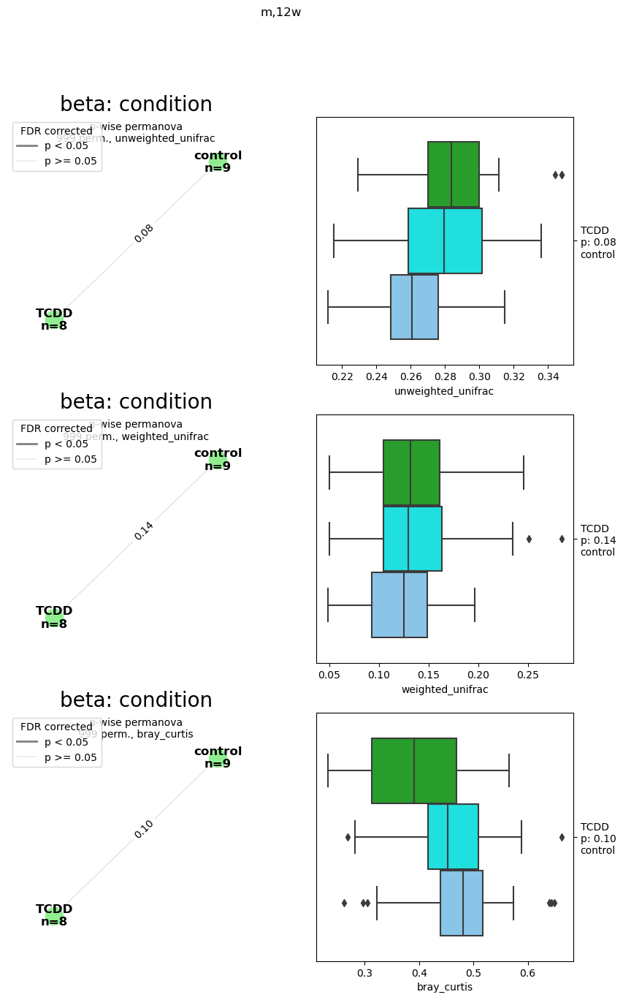

In [419]:
for (sex, tp), g in prj_data['metadata'][prj_data['metadata']['body_site'] == 'feces'].groupby(['sex', 'timepoint']):
    _ = plotNetworks('condition', g, alpha=None, beta=res_feces['beta_diversity']['results'], name=','.join([sex, tp]))

## Alpha Diversity

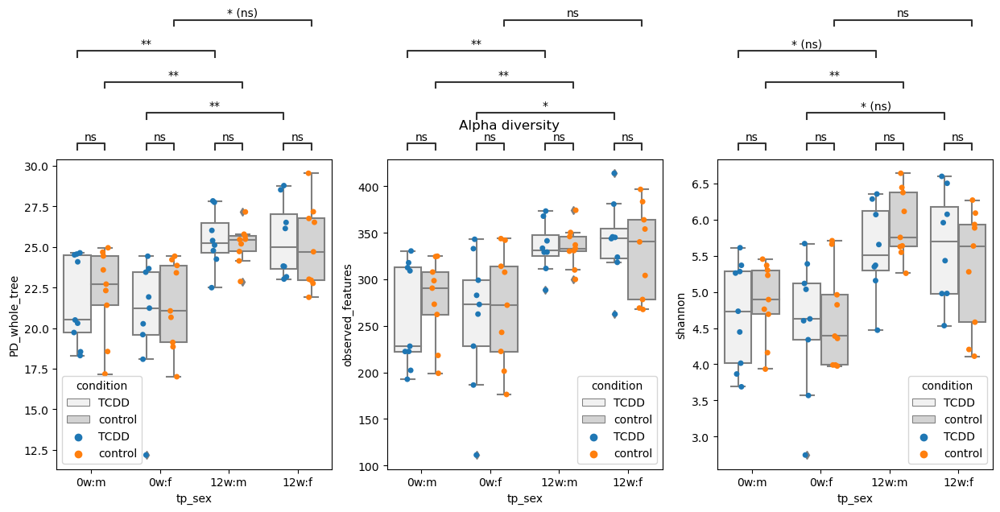

In [506]:
fig, axes = plt.subplots(1,3, figsize=(3*5, 5))

alpha_data = res_feces['alpha_diversity']['results'].stack().reset_index().rename(columns={'level_1': 'metric', 0: 'distance', 'iter10_depth15000': 'sample_name'}).merge(prj_data['metadata'], left_on='sample_name', right_index=True)
alpha_data['tp_sex'] = alpha_data['timepoint'] + ":" + alpha_data['sex']

for ax, (metric, plot_data) in zip(axes, alpha_data[alpha_data['body_site'] == 'feces'].groupby('metric')):
    sns.boxplot(data=plot_data, y='distance', x='tp_sex', hue='condition', color='lightgray', ax=ax)
    sns.stripplot(data=plot_data, y='distance', x='tp_sex', hue='condition', dodge=True, ax=ax)
    
    annotator = Annotator(ax, [
        (('0w:%s' % sex, cond), ('12w:%s' % sex, cond)) for sex in ['m', 'f'] for cond in ['control', 'TCDD']
        ] + [
        (('%s:%s' % (tp, sex), 'control'), ('%s:%s' % (tp, sex), 'TCDD')) for sex in ['m', 'f'] for tp in ['0w', '12w']
        ], data=plot_data, y='distance', x='tp_sex', hue='condition')
    annotator.configure(test='Mann-Whitney', text_format='star', loc='outside', comparisons_correction="fdr_bh", correction_format="default", verbose=False)
    annotator.apply_and_annotate()
    
    ax.set_ylabel(metric)
fig.suptitle('Alpha diversity')
fig.savefig('Generated/fig_alpha.svg', bbox_inches="tight")

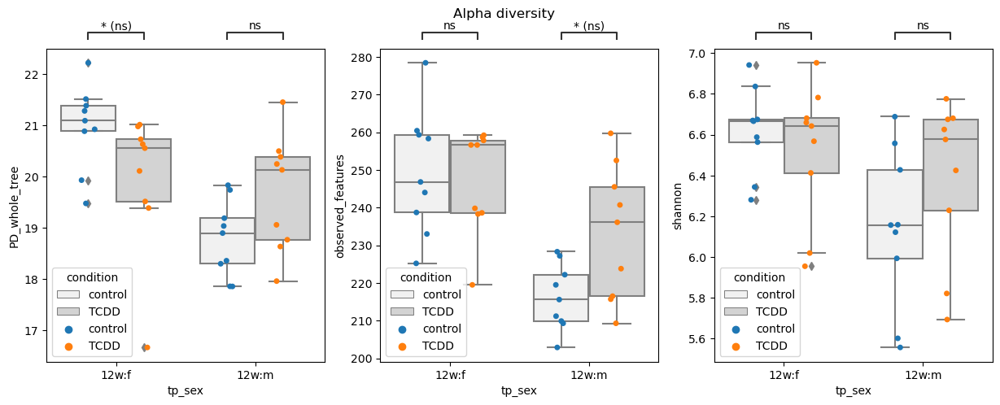

In [520]:
fig, axes = plt.subplots(1,3, figsize=(3*5, 5))

alpha_data = res_cecal['alpha_diversity']['results'].stack().reset_index().rename(columns={'level_1': 'metric', 0: 'distance', 'iter10_depth2500': 'sample_name'}).merge(prj_data['metadata'], left_on='sample_name', right_index=True)
alpha_data['tp_sex'] = alpha_data['timepoint'] + ":" + alpha_data['sex']

for ax, (metric, plot_data) in zip(axes, alpha_data[alpha_data['body_site'] == 'cecal'].groupby('metric')):
    sns.boxplot(data=plot_data, y='distance', x='tp_sex', hue='condition', color='lightgray', ax=ax)
    sns.stripplot(data=plot_data, y='distance', x='tp_sex', hue='condition', dodge=True, ax=ax)
    
    annotator = Annotator(ax, [
        #(('0w:%s' % sex, cond), ('12w:%s' % sex, cond)) for sex in ['m', 'f'] for cond in ['control', 'TCDD']
        #] + [
        (('%s:%s' % (tp, sex), 'control'), ('%s:%s' % (tp, sex), 'TCDD')) for sex in ['m', 'f'] for tp in ['12w']
        ], data=plot_data, y='distance', x='tp_sex', hue='condition')
    annotator.configure(test='Mann-Whitney', text_format='star', loc='outside', comparisons_correction="fdr_bh", correction_format="default", verbose=False)
    annotator.apply_and_annotate()
    
    ax.set_ylabel(metric)
fig.suptitle('Alpha diversity')
fig.savefig('Generated/fig_alpha_ceaecum.svg', bbox_inches="tight")

## Study Design

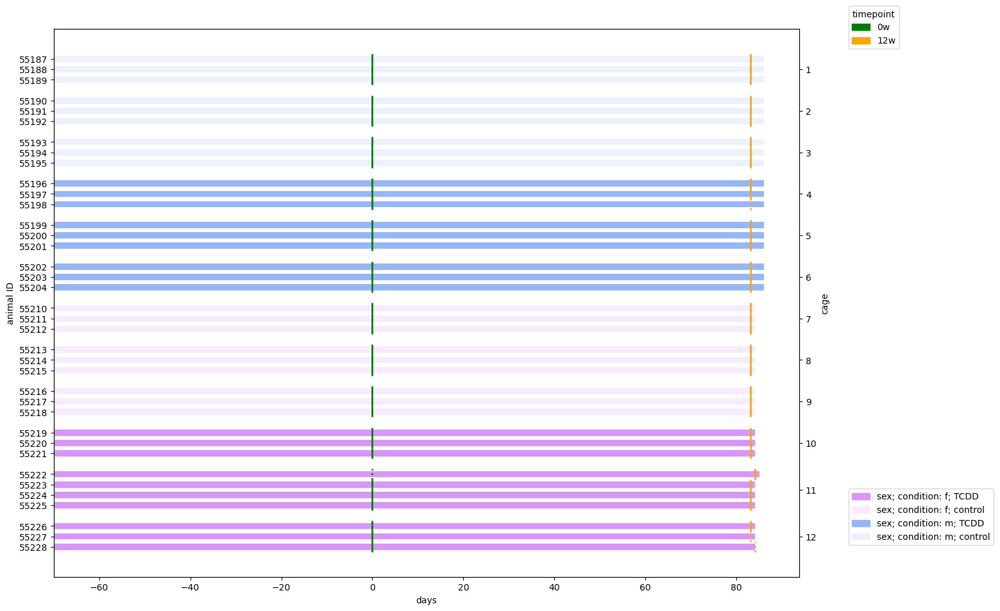

In [411]:
meta = prj_data['metadata'][prj_data['metadata']['sample type'] == 'fecal DNA'].copy()
meta['sex; condition'] = meta.apply(lambda row: '; '.join([row['sex'], row['condition']]), axis=1)
for f in ['animal ID', 'cage']:
    meta[f] = meta[f].astype(int)

chart, col, info = ganttChart(
    meta.sort_values(by=['sex', 'condition', 'cage', 'animal ID'], ascending=[True, True, False, False]),
    col_birth='birth_date',  # metadata column that flags the start of the timeline, must be some parsable dates like 2022-10-09
    col_entities='animal ID',  # metadata column that contains name of the person/animal which has been sampled over time, i.e. to know which samples belong to the same line
    col_events='collection_date', # metadata column that indicate the exact date when samples have been collected
    col_events_title='timepoint', # you might want to provide a metadata column to give sampling events more speaking names
    col_entity_groups='cage',
    col_entity_colors='sex; condition',
    align_to_event_title='0w', # by default, lines are drawn by actual date. However, often it makes sense to align them to the first timepoint of an intervention
    counts=res_feces['rarefaction']['results'],
    event_line_width=2,
    colors_events={'0w': 'green', '12w': 'orange'},
    colors_entities={'m; control': lighten_color(COLORS['m'], 0.4),
                     'f; control': lighten_color(COLORS['f'], 0.4),
                     'm; TCDD': lighten_color(COLORS['m'], 2.1),
                     'f; TCDD': lighten_color(COLORS['f'], 2.1)}
    )

11 taxa left after collapsing to Phylum.
70 samples left with metadata and counts.
10 taxa left after filtering low abundant.
raw counts: 70
raw meta: 74
meta with counts: 70 samples x 23 fields
counts with meta: 70


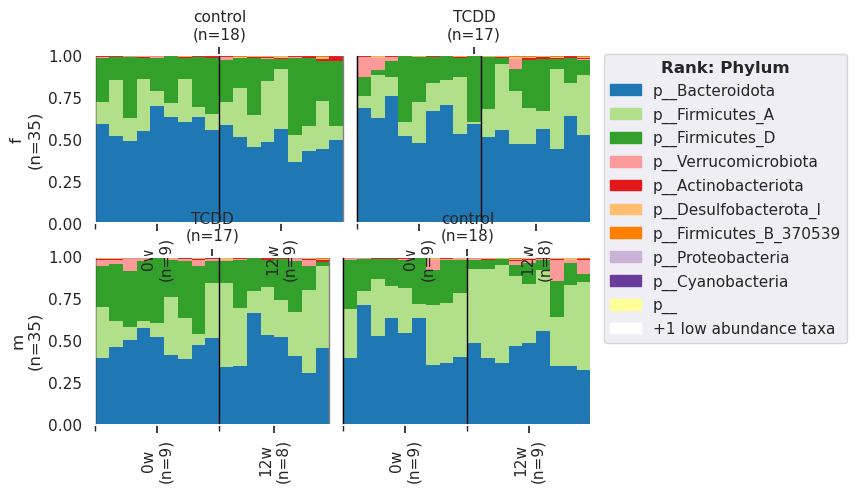

In [423]:
p = plotTaxonomy(res_feces['rarefaction']['results'], prj_data['metadata'][prj_data['metadata']['body_site'] == 'feces'], 
                 rank='Phylum', file_taxonomy=res_feces['taxonomy']['RDP']['results']['Taxon'], 
                 group_l0='sex', group_l1='condition', group_l2='timepoint')

/homes/sjanssen/Git/sjanssen2/ggmap/ggmap/snippets.py:480: FutureWarning: Passing a set as an indexer is deprecated and will raise in a future version. Use a list instead.
  counts_taxonomy = counts_taxonomy.loc[:, sample_cols]


70 samples left with metadata and counts.
461 taxa left after filtering low abundant.
raw counts: 70
raw meta: 74
meta with counts: 70 samples x 23 fields
counts with meta: 70


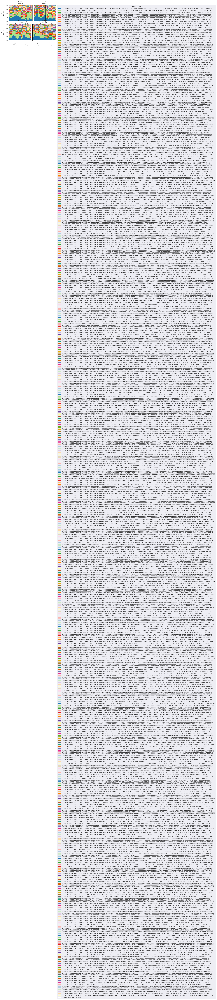

In [425]:
p = plotTaxonomy(res_feces['rarefaction']['results'], prj_data['metadata'][prj_data['metadata']['body_site'] == 'feces'], 
                 rank='raw', file_taxonomy=res_feces['taxonomy']['RDP']['results']['Taxon'], 
                 group_l0='sex', group_l1='condition', group_l2='timepoint')

## Differential Abundance
One typical line of investigation is the question for differentially abundant taxa between two groups of microbial samples. I suggest two alternative computational approaches for the very same question. 
  1. Ancom is the more conservative method (=if it reports taxa, they are probably really diff. abundant), 
  2. dsFDR is more liberal regarding correction for multiple hypothesis testing and less well accepted in the field, but reports more

In [439]:
res_ancom = ancom(
    res_feces['rarefaction']['results'],  # you can in principle also start from a feature table NOT being rarefied, i.e. res_all['counts_plantsremoved']
    rank='Genus',  # feature table is collapsed at this taxonomic rank, as ANCOM struggles from too many features like individual ASVs. But try rank="raw" as well!
    taxonomy=res_all['taxonomy']['RDP']['results']['Taxon'],
    grouping=prj_data['metadata'][(prj_data['metadata']['body_site'] == 'feces') & (prj_data['metadata']['condition'] == 'control')]['timepoint'],  # the metadata column that groups all samples into two conditions
    dry=False, wait=False,
    # following are plotting parameters only, i.e. won't change/trigger a re-run
    min_mean_abundance_per_feature=0.007,
    post_cache_arguments={#'palette': {'B6J': 'blue', 'C': 'green'}, 
                          #'feature_order': list(name_map.keys()), 
                          #'hue_order': ['B6J', 'C']
    })

Reduced to 36 samples (feature-table had 70, metadata had 36 samples)
Working directory is '/homes/sjanssen/TMP/ana_ancom_41udopzn', cachefile is '.anacache/6a9cac0c81c64c64d9f7ddf6674de283.ancom'. 

124 taxa left after collapsing to Genus.


Now wait until 25674416 job finishes.


### dsFDR
You need to additionally import (and probably install first) the "calor" package: https://github.com/biocore/calour
My code regarding this type of analysis is a bit ugly, since you need to "export" metadata as well as feature counts to actual files before importing them into the calor module :-/

In [428]:
import calour as ca
ca.set_log_level(40)

'timepoint'  (n=36)
    38 (of  753) taxa different between '12w' (n=18) vs. '0w' (n=18)



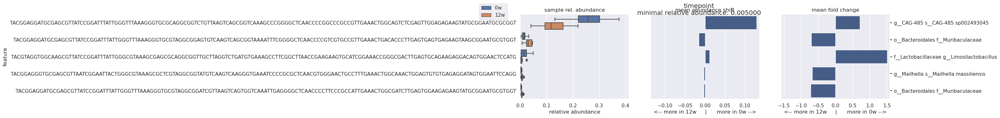

In [436]:
pandas2biom('tmp_dsfrd.biom', res_all['counts_plantsremoved'])
meta = prj_data['metadata'][(prj_data['metadata']['body_site'] == 'feces') & (prj_data['metadata']['condition'] == 'control')].copy()
meta.to_csv('tmp_dsfdr.tsv', sep="\t", index=True)

dsFDR_experiment = ca.read_amplicon('tmp_dsfrd.biom', 
                                    'tmp_dsfdr.tsv', min_reads=0, normalize=10000)

field = 'timepoint'  # the metadata column that groups all samples into two conditions
res_dsFDR_genotype = find_diff_taxa(dsFDR_experiment, meta, [field],
                                    # random_seed=43  # hard code a random seed for reproducible results
                                   )

if len(res_dsFDR_genotype) > 0:
    p = plot_diff_taxa(res_all['counts_plantsremoved'],
                       meta[field], res_dsFDR_genotype,
                       min_mean_abundance=0.005,
                       #colors_boxplot={'B6J': 'blue', 'C': 'green'}, 
                       #color_barplot='gray'
                       taxonomy=res_all['taxonomy']['RDP']['results']['Taxon']
                      )

In [443]:
p[1]

,0w,12w
feature,,
TACGTAGGTGGCAAGCGTTATCCGGATTTATTGGGCGTAAAGGGAACGCAGGCGGTCTTTTAAGTCTGATGTGAAAGCCTTCGGCTTAACCGGAGTAGTGCATTGGAAACTGGGAGACTTGAGTGCAGAAGAGGAGAGTGGAACTCCATG,0.002616,0.005691
TACGTATGGAGCAAGCGTTATCCGGATTTACTGGGTGTAAAGGGAGCGCAGGCGGCCAGGCAAGTCTGATGTGAAATACCGGGGCTCAACCCCGGAACTGCATTGGAAACTGTCAGGCTGGAGTGTCGGAGAGGCAGGCGGAATTCCTGG,0.001470,0.006035
TACGGAGGATGCGAGCGTTATCCGGATTTATTGGGTTTAAAGGGTGCGCAGGCGGTCTGTTAAGTCAGCGGTCAAAGCCCGGGGCTCAACCCCGGCCCGCCGTTGAAACTGGCAGTCTCGAGTTGGAGAGAAGTATGCGGAATGCGCGGT,0.249795,0.162415
TACGTAGGTGGCAAGCGTTGTCCGGATTTATTGGGCGTAAAGCGAGTGCAGGCGGTTCAATAAGTCTGATGTGAAAGCCTTCGGCTCAACCGGAGAATTGCATCAGAAACTGTTGAACTTGAGTGCAGAAGAGGAGAGTGGAACTCCATG,0.028057,0.005424
TACGTAGGTGGCAAGCGTTATCCGGATTTATTGGGCGTAAAGCGAGCGCAGGCGGTTGCTTAGGTCTGATGTGAAAGCCTTCGGCTTAACCGAAGAAGTGCATCGGAAACCGGGCGACTTGAGTGCAGAAGAGGACAGTGGAACTCCATG,0.017346,0.003228


In [458]:
list(set(prj_data['metadata'][(prj_data['metadata']['body_site'] == 'feces') & 
                                 (prj_data['metadata']['condition'] == 'control')].index) & \
        set(res_feces['rarefaction']['results'].columns))

['45_S45_L001_R1_001',
 '21_S21_L001_R1_001',
 '59_S59_L001_R1_001',
 '40_S40_L001_R1_001',
 '23_S23_L001_R1_001',
 '1_S1_L001_R1_001',
 '22_S22_L001_R1_001',
 '4_S4_L001_R1_001',
 '44_S44_L001_R1_001',
 '38_S38_L001_R1_001',
 '5_S5_L001_R1_001',
 '61_S61_L001_R1_001',
 '37_S37_L001_R1_001',
 '43_S43_L001_R1_001',
 '9_S9_L001_R1_001',
 '42_S42_L001_R1_001',
 '8_S8_L001_R1_001',
 '6_S6_L001_R1_001',
 '26_S26_L001_R1_001',
 '56_S56_L001_R1_001',
 '24_S24_L001_R1_001',
 '19_S19_L001_R1_001',
 '57_S57_L001_R1_001',
 '27_S27_L001_R1_001',
 '25_S25_L001_R1_001',
 '2_S2_L001_R1_001',
 '62_S62_L001_R1_001',
 '20_S20_L001_R1_001',
 '58_S58_L001_R1_001',
 '60_S60_L001_R1_001',
 '39_S39_L001_R1_001',
 '41_S41_L001_R1_001',
 '3_S3_L001_R1_001',
 '55_S55_L001_R1_001',
 '7_S7_L001_R1_001',
 '63_S63_L001_R1_001']

In [472]:
x = res_feces['rarefaction']['results'].loc[:, list(
        set(prj_data['metadata'][(prj_data['metadata']['body_site'] == 'feces') & 
                                 (prj_data['metadata']['condition'] == 'control')].index) & \
        set(res_feces['rarefaction']['results'].columns))]
x = x[x.sum(axis=1) > 0]
x.to_csv('help_otu.tsv', sep="\t", index_label='sample_name')


'timepoint'  (n=34)
   101 (of  753) taxa different between '0w' (n=18) vs. '12w' (n=16)



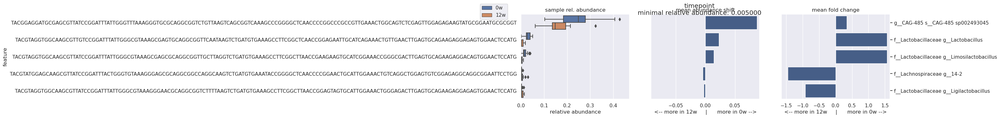

In [437]:
pandas2biom('tmp_dsfrd.biom', res_all['counts_plantsremoved'])
meta = prj_data['metadata'][(prj_data['metadata']['body_site'] == 'feces') & (prj_data['metadata']['condition'] == 'TCDD')].copy()
meta.to_csv('tmp_dsfdr.tsv', sep="\t", index=True)

dsFDR_experiment = ca.read_amplicon('tmp_dsfrd.biom', 
                                    'tmp_dsfdr.tsv', min_reads=0, normalize=10000)

field = 'timepoint'  # the metadata column that groups all samples into two conditions
res_dsFDR_genotype = find_diff_taxa(dsFDR_experiment, meta, [field],
                                    # random_seed=43  # hard code a random seed for reproducible results
                                   )

if len(res_dsFDR_genotype) > 0:
    p = plot_diff_taxa(res_all['counts_plantsremoved'],
                       meta[field], res_dsFDR_genotype,
                       min_mean_abundance=0.005,
                       #colors_boxplot={'B6J': 'blue', 'C': 'green'}, 
                       #color_barplot='gray'
                       taxonomy=res_all['taxonomy']['RDP']['results']['Taxon']
                      )

'timepoint'  (n=17)
    14 (of  753) taxa different between '0w' (n=9) vs. '12w' (n=8)

'timepoint'  (n=18)
    18 (of  753) taxa different between '0w' (n=9) vs. '12w' (n=9)

'timepoint'  (n=17)
    54 (of  753) taxa different between '0w' (n=9) vs. '12w' (n=8)

'timepoint'  (n=18)
    15 (of  753) taxa different between '12w' (n=9) vs. '0w' (n=9)



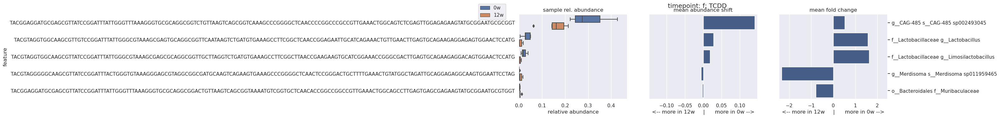

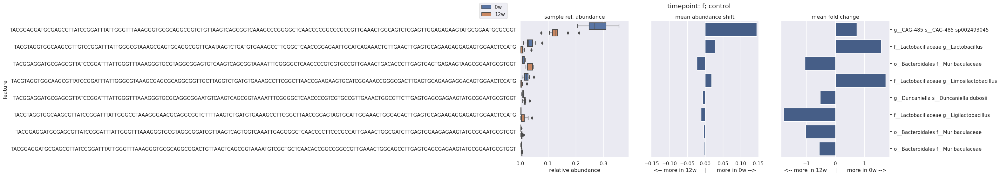

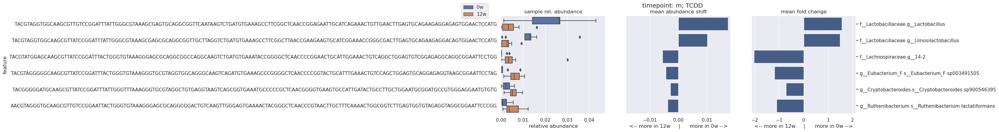

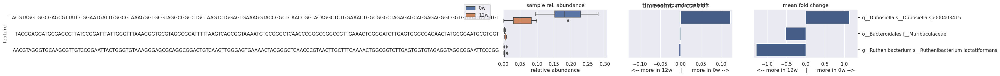

In [481]:
pandas2biom('tmp_dsfrd.biom', res_all['counts_plantsremoved'])
meta = prj_data['metadata'][(prj_data['metadata']['body_site'] == 'feces')].copy()
for (sex, condition), g in meta.groupby(['sex', 'condition']):
    meta.to_csv('tmp_dsfdr_%s_%s.tsv' % (sex, condition), sep="\t", index=True)
    
    dsFDR_experiment = ca.read_amplicon('tmp_dsfrd.biom', 
                                        'tmp_dsfdr_%s_%s.tsv' % (sex, condition), min_reads=0, normalize=10000)
    
    field = 'timepoint'  # the metadata column that groups all samples into two conditions
    res_dsFDR_genotype = find_diff_taxa(dsFDR_experiment, g, [field],
                                        # random_seed=43  # hard code a random seed for reproducible results
                                       )
    
    if len(res_dsFDR_genotype) > 0:
        p = plot_diff_taxa(res_all['counts_plantsremoved'],
                           g[field], res_dsFDR_genotype,
                           min_mean_abundance=0.005,
                           #colors_boxplot={'B6J': 'blue', 'C': 'green'}, 
                           #color_barplot='gray'
                           taxonomy=res_all['taxonomy']['RDP']['results']['Taxon']
                          )
        p[0].suptitle('%s: %s; %s' % (field, sex, condition))
    #break

# Figures

In [31]:
mfig = prj_data['metadata'].copy()
mfig['sex'] = mfig['sex'].apply(lambda x: {'f': 'female', 'm': 'male'}.get(x, x))
mfig['condition'] = mfig['condition'].apply(lambda x: {'control': 'ctrl'}.get(x, x))
mfig['timepoint'] = mfig['timepoint'].apply(lambda x: {'0w': 'd0'}.get(x, x))

ORDER_SEX = ['male', 'female']
ORDER_CONDITIONS = ['ctrl', 'TCDD']
ORDER_TIMEPOINTS = ['d0', '12w']

COLORS_CONDITIONS = {'ctrl': sns.color_palette()[1], 
                     'TCDD': sns.color_palette()[0]}
print(COLORS_CONDITIONS)
COLORS_SEX = {'female': '#ef7d72',
              'male': '#79c8ca'}

if 'Generated/Figures' not in prj_data['paths']:
    prj_data['paths']['Generated/Figures'] = os.path.dirname(prj_data['paths']['Figures']) + '/Generated/Figures'
    
def _savefig(fig, name):
    os.makedirs(prj_data['paths']['Generated/Figures']+'/SVG', exist_ok=True)
    os.makedirs(prj_data['paths']['Generated/Figures']+'/PNG', exist_ok=True)

    #print(prj_data['paths']['Generated/Figures']+'/PNG')
    
    fig.savefig(prj_data['paths']['Generated/Figures']+'/SVG/%s.svg' % name, bbox_inches='tight')
    fig.savefig(prj_data['paths']['Generated/Figures']+'/PNG/%s.png' % name, bbox_inches='tight')

{'ctrl': (1.0, 0.4980392156862745, 0.054901960784313725), 'TCDD': (0.12156862745098039, 0.4666666666666667, 0.7058823529411765)}


In [28]:
colors_genera = dict()
colors_phyla = dict()

In [492]:
%matplotlib notebook

In [493]:
%matplotlib inline

In [30]:
COLORS_CONDITIONS

{'ctrl': (1.0, 0.4980392156862745, 0.054901960784313725),
 'TCDD': (0.12156862745098039, 0.4666666666666667, 0.7058823529411765)}

## Figure 4

### Panel A

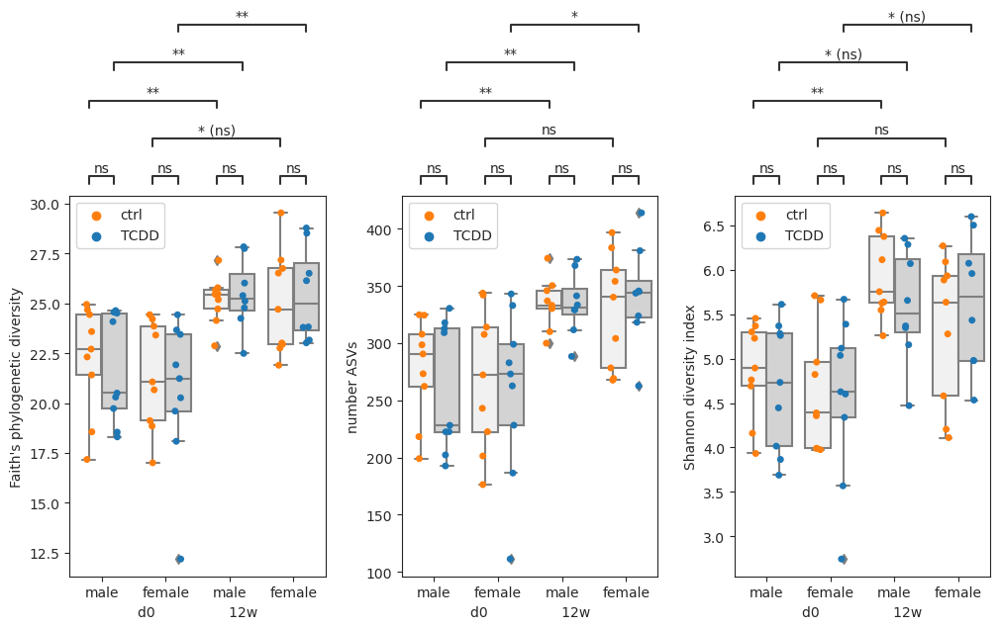

In [29]:
def plot_alpha(res, meta, bodysite):
    sns.set_style('ticks')
    fig, axes = plt.subplots(1,3, figsize=(3*4, 5))
    plt.subplots_adjust(wspace=0.3)

    alpha_data = res['alpha_diversity']['results'].stack().reset_index()
    alpha_data.columns = ['sample_name', 'metric', 'distance']
    alpha_data = alpha_data.merge(meta, left_on='sample_name', right_index=True)
    alpha_data['tp_sex'] = alpha_data['timepoint'] + ":" + alpha_data['sex']
    
    for ax, (metric, plot_data) in zip(axes, alpha_data[alpha_data['body_site'] == bodysite].sort_values(by=['sex', 'metric'], ascending=[False, True]).groupby('metric', sort=False)):
        order_x = ['%s:%s' % (timepoint, sex) for timepoint in ORDER_TIMEPOINTS for sex in ORDER_SEX]
        cmps = [
            (('d0:%s' % sex, cond), ('12w:%s' % sex, cond)) for sex in ['male', 'female'] for cond in ORDER_CONDITIONS
            ] + [
            (('%s:%s' % (tp, sex), 'ctrl'), ('%s:%s' % (tp, sex), 'TCDD')) for sex in ['male', 'female'] for tp in ORDER_TIMEPOINTS
            ]
        if bodysite != 'feces':
            cmps = [(('12w:%s' % sex, 'ctrl'), ('12w:%s' % sex, 'TCDD')) for sex in ORDER_SEX]
            order_x = [x for x in order_x if 'd0' not in x]
        
        sns.boxplot(data=plot_data, y='distance', x='tp_sex', hue='condition', color='lightgray', ax=ax, hue_order=ORDER_CONDITIONS, order=order_x)
        sns.stripplot(data=plot_data, y='distance', x='tp_sex', hue='condition', dodge=True, ax=ax, hue_order=ORDER_CONDITIONS, order=order_x, palette=COLORS_CONDITIONS)
        
        annotator = Annotator(ax, cmps, data=plot_data, y='distance', x='tp_sex', hue='condition', hue_order=ORDER_CONDITIONS, order=order_x)
        annotator.configure(test='Mann-Whitney', text_format='star', loc='outside', comparisons_correction="fdr_bh", correction_format="default", verbose=False)
        annotator.apply_and_annotate()
        
        ax.set_ylabel({'PD_whole_tree': 'Faith\'s phylogenetic diversity',
                       'observed_features': 'number ASVs',
                       'shannon': 'Shannon diversity index'}.get(metric, metric))

        ax.set_xticklabels([x.get_text().split(':')[-1] for x in ax.get_xticklabels()])
        ax.legend().set_title("")
        if bodysite == 'feces':
            ax.set_xlabel('d0                 12w')
        else:
            ax.set_xlabel("")

        (legend_patches, legend_labels) = ax.get_legend_handles_labels()
        ax.legend(handles=legend_patches[-2:], labels=legend_labels[-2:])
    #fig.suptitle('Alpha diversity')
    
    return fig

fig = plot_alpha(res_feces, mfig, 'feces')
_savefig(fig, 'fig4_panelA')

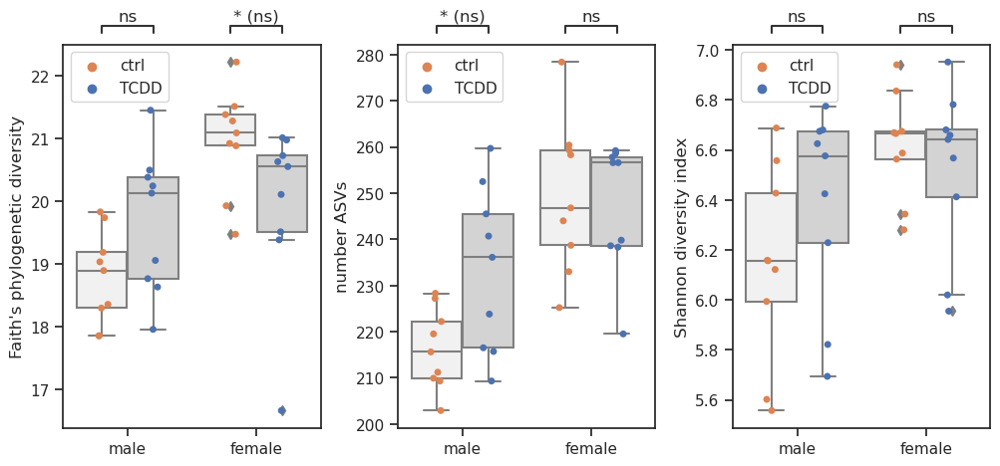

In [588]:
fig = plot_alpha(res_cecal, mfig, 'cecal')
_savefig(fig, 'fig4_panelB')

### Panel C + D

In [41]:
# produce emperor plot without those samples that have been sequenced after cell sorting
_ = emperor(mfig[(mfig['body_site'] == 'cecal') & pd.notnull(mfig['animal ID'])], res_cecal['beta_diversity']['results'], 
            fp_results='Generated/Emperor/', infix='_cecalNoSorted_', dry=False, wait=False)

found matching working dir "/homes/sjanssen/TMP/ana_emperor_os4gl2_h"
 Was removed.


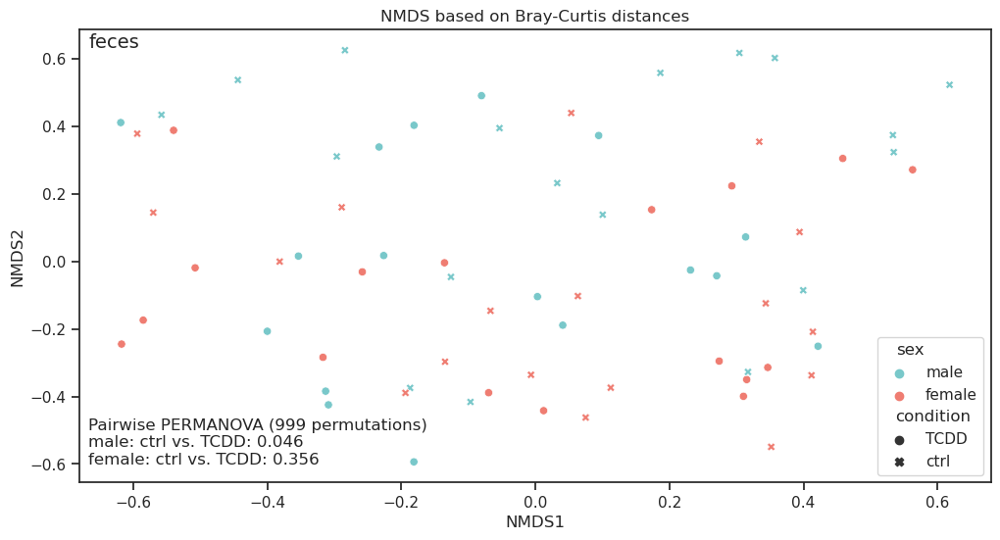

In [578]:
def get_nmds(res, meta, metric='bray_curtis', bodysite='feces'):
    embedding = MDS(n_components=2, metric=False, normalized_stress='auto', dissimilarity='precomputed')
    
    nmds = pd.DataFrame(embedding.fit_transform(res['beta_diversity']['results'][metric].to_data_frame()), 
                        index=res['beta_diversity']['results'][metric].ids)

    perma = dict()
    for sex, g in meta.groupby('sex'):
        perma[sex] = plotNetworks('condition', g, None, res_feces['beta_diversity']['results'], summarize=True)[0].set_index('metric').loc[metric, 'p-value']

    fig, axes = plt.subplots(1,1, figsize=(12, 6))
    ax = axes
    sns.scatterplot(data=nmds.merge(meta, left_index=True, right_index=True),
                    x=0, y=1, hue='sex', palette=COLORS_SEX, style='condition', ax=ax)
    ax.set_title('NMDS based on %s distances' % {'bray_curtis': 'Bray-Curtis'}.get(metric, metric))
    ax.set_ylabel('NMDS2')
    ax.set_xlabel('NMDS1')
    ax.text(0.01, 0.96, bodysite, fontsize=14, transform=ax.transAxes)
    
    ax.text(0.01, 0.04, "Pairwise PERMANOVA (999 permutations)\nmale: ctrl vs. TCDD: %.3f\nfemale: ctrl vs. TCDD: %.3f" % (perma['male'], perma['female']) , fontsize=12, transform=ax.transAxes)

    return fig

fig = get_nmds(res_feces, mfig)
#_savefig(fig, 'fig4_panelC')

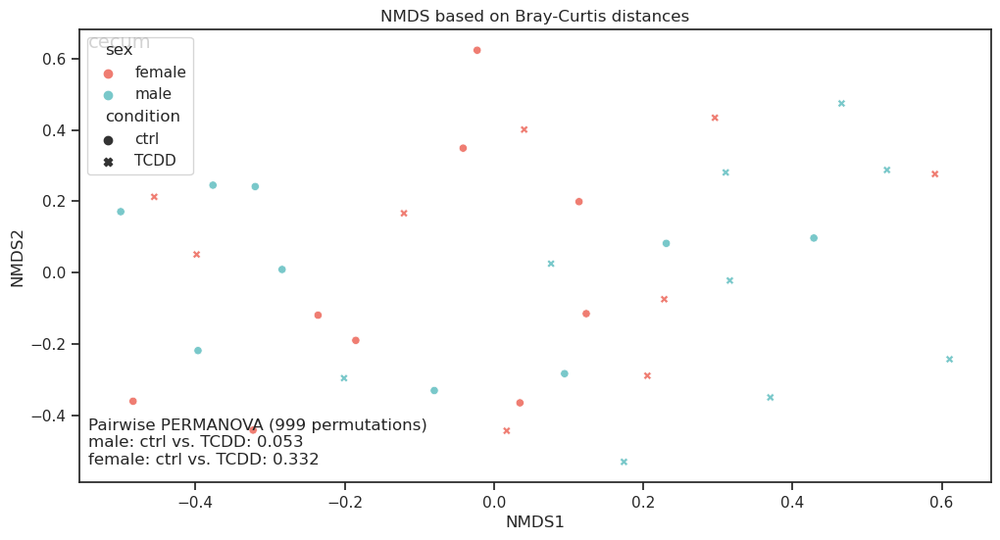

In [589]:
fig = get_nmds(res_cecal, mfig, bodysite='cecum')
#_savefig(fig, 'fig4_panelD')

### Panels E+F

124 taxa left after collapsing to Genus.
70 samples left with metadata and counts.
103 taxa left after filtering low abundant.
raw counts: 70
raw meta: 124
meta with counts: 8 samples x 5 fields
counts with meta: 8


/tmp/ipykernel_611318/3711583369.py:22: UserWarning: FixedFormatter should only be used together with FixedLocator
  p[0].get_axes()[0].set_yticklabels(map(lambda x: '%01.f' % (x*100), p[0].get_axes()[0].get_yticks()))


108 taxa left after collapsing to Genus.
40 samples left with metadata and counts.
82 taxa left after filtering low abundant.
raw counts: 40
raw meta: 124
meta with counts: 4 samples x 4 fields
counts with meta: 4


/tmp/ipykernel_611318/3711583369.py:22: UserWarning: FixedFormatter should only be used together with FixedLocator
  p[0].get_axes()[0].set_yticklabels(map(lambda x: '%01.f' % (x*100), p[0].get_axes()[0].get_yticks()))


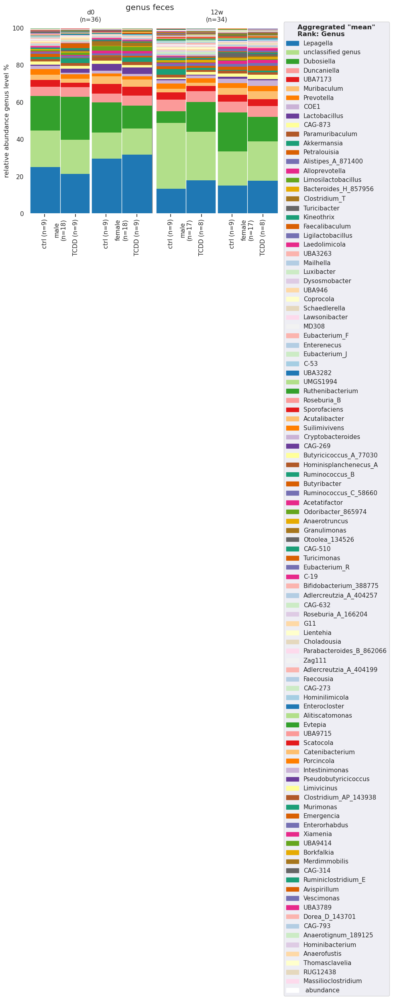

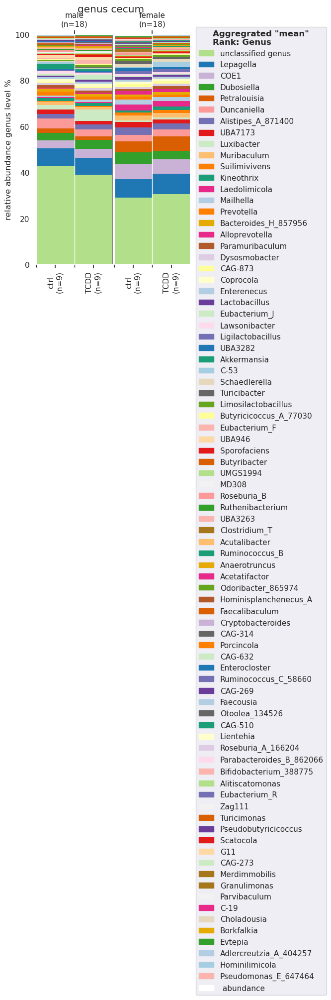

In [57]:
for bodysite, res, panel in [('feces', res_feces, 'E'), ('cecum', res_cecal, 'F')]:
    g0, g1, g2 = 'timepoint', 'sex', 'condition'
    spacer = [0.1, 0.04, 0.01]
    num_bars = 4*2
    if bodysite == 'cecum':
        g0, g1, g2 = g1, g2, None
        spacer = [0.04, 0.01, None]
        num_bars = 4*1
    p = plotTaxonomy(res['rarefaction']['results'],
                     mfig.sort_values(by=['sex', 'condition'], ascending=[False, False]), 
                     rank='Genus', file_taxonomy=res['taxonomy']['RDP']['results']['Taxon'],
                     group_l0=g0, group_l1=g1, group_l2=g2,
                     fct_aggregate=np.mean, 
                     horizontal_spacer=spacer,
                     legend_remove_rank_prefix=True,
                     #reorder_samples=False
                     colors=colors_genera,
                     print_sample_labels=True if bodysite == 'feces' else None,
                    )
    colors_genera = p[4]
    p[0].get_axes()[0].set_ylabel('relative abundance genus level %')
    p[0].get_axes()[0].set_yticklabels(map(lambda x: '%01.f' % (x*100), p[0].get_axes()[0].get_yticks()))
    p[0].suptitle('genus %s' % bodysite)
    p[0].set_size_inches((num_bars, 6))
    #break
    _savefig(p[0], 'fig4_panel%s' % panel)

## Figure S6
### Panel A

11 taxa left after collapsing to Phylum.
70 samples left with metadata and counts.
10 taxa left after filtering low abundant.
raw counts: 70
raw meta: 124
meta with counts: 8 samples x 5 fields
counts with meta: 8


/tmp/ipykernel_4056333/802138957.py:14: UserWarning: FixedFormatter should only be used together with FixedLocator
  p[0].get_axes()[0].set_yticklabels(map(lambda x: '%01.f' % (x*100), p[0].get_axes()[0].get_yticks()))


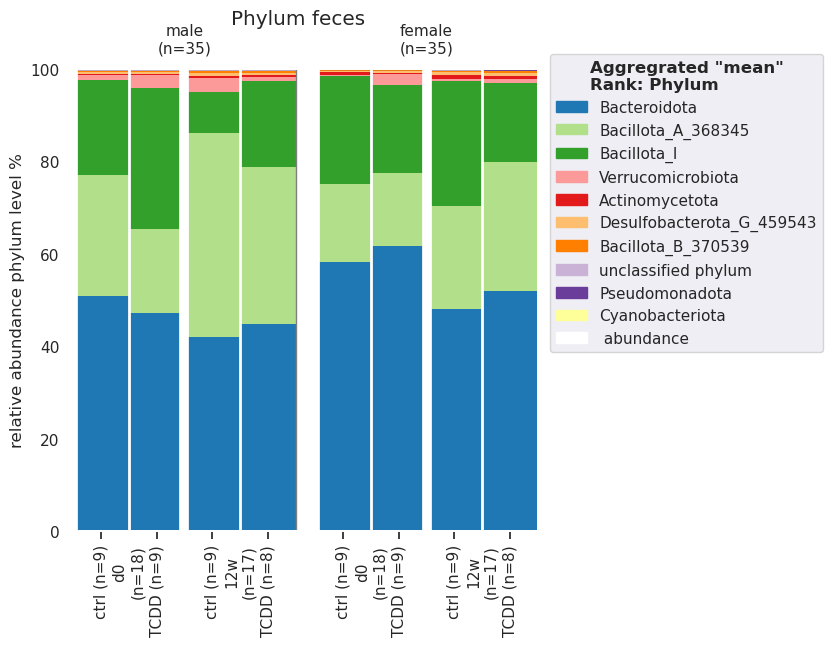

In [583]:
p = plotTaxonomy(res_feces['rarefaction']['results'],
                 mfig.sort_values(by=['sex', 'condition'], ascending=[False, False]), 
                 rank='Phylum', file_taxonomy=res_feces['taxonomy']['RDP']['results']['Taxon'],
                 group_l0='sex', group_l1='timepoint', group_l2='condition',
                 fct_aggregate=np.mean, 
                 horizontal_spacer=[0.35, 0.07, 0.02],
                 legend_remove_rank_prefix=True,
                 #reorder_samples=False
                 colors=colors_phyla,
                 print_sample_labels=True,
                )
colors_phyla = p[4]
p[0].get_axes()[0].set_ylabel('relative abundance phylum level %')
p[0].get_axes()[0].set_yticklabels(map(lambda x: '%01.f' % (x*100), p[0].get_axes()[0].get_yticks()))
p[0].suptitle('Phylum feces')
p[0].set_size_inches((6, 6))
_savefig(p[0], 'figS6_panelA')

### Panel B

11 taxa left after collapsing to Phylum.
p-value annotation legend:
      ns: p <= 1.00e+00
       *: 1.00e-02 < p <= 5.00e-02
      **: 1.00e-03 < p <= 1.00e-02
     ***: 1.00e-04 < p <= 1.00e-03
    ****: p <= 1.00e-04

12w_ctrl vs. 12w_TCDD: Mann-Whitney-Wilcoxon test two-sided with Benjamini-Hochberg correction, P_val:9.626e-01 U_stat=3.500e+01
d0_ctrl vs. d0_TCDD: Mann-Whitney-Wilcoxon test two-sided with Benjamini-Hochberg correction, P_val:7.911e-01 U_stat=3.700e+01
d0_TCDD vs. 12w_ctrl: Mann-Whitney-Wilcoxon test two-sided with Benjamini-Hochberg correction, P_val:1.120e-01 U_stat=2.200e+01
d0_ctrl vs. 12w_ctrl: Mann-Whitney-Wilcoxon test two-sided with Benjamini-Hochberg correction, P_val:1.333e-01 U_stat=2.300e+01
d0_TCDD vs. 12w_TCDD: Mann-Whitney-Wilcoxon test two-sided with Benjamini-Hochberg correction, P_val:4.807e-01 U_stat=2.800e+01
d0_ctrl vs. 12w_TCDD: Mann-Whitney-Wilcoxon test two-sided with Benjamini-Hochberg correction, P_val:3.213e-01 U_stat=2.500e+01
p-value an

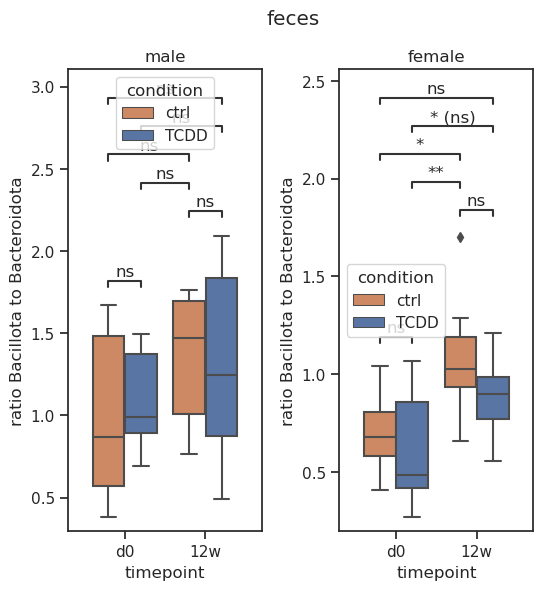

In [593]:
rank_counts = collapseCounts_objects(res_feces['rarefaction']['results'], 'Phylum', res_feces['taxonomy']['RDP']['results']['Taxon'])[0]
ratio_Bacillota_Bacteroidota = (rank_counts.loc[[p for p in rank_counts.index if p.startswith('p__Bacillota')], :].sum(axis=0) / rank_counts.loc[['p__Bacteroidota'], :].sum(axis=0))
ratio_Bacillota_Bacteroidota.name = 'ratio Bacillota to Bacteroidota'

fig, axes = plt.subplots(1,2, figsize=(6, 6))
sns.set_style('ticks')
plt.subplots_adjust(wspace=0.4)
hue_order = ['ctrl', 'TCDD']
for ax, (sex, g) in zip(axes, mfig.merge(ratio_Bacillota_Bacteroidota, left_index=True, right_index=True).sort_values(by=['sex'], ascending=[False]).groupby('sex', sort=False)):
    sns.boxplot(data=g, ax=ax,
                y=ratio_Bacillota_Bacteroidota.name, x='timepoint', hue='condition', hue_order=ORDER_CONDITIONS, order=ORDER_TIMEPOINTS, palette=COLORS_CONDITIONS)
    ax.set_title(sex)

    annotator = Annotator(ax, [
        (('d0', 'ctrl'), ('d0', 'TCDD')),
        (('12w', 'ctrl'), ('12w', 'TCDD')),

        (('d0', 'ctrl'), ('12w', 'ctrl')),
        (('d0', 'TCDD'), ('12w', 'TCDD')),

        (('d0', 'TCDD'), ('12w', 'ctrl')),
        (('d0', 'ctrl'), ('12w', 'TCDD')),
        
            ], data=g, y=ratio_Bacillota_Bacteroidota.name, hue='condition', x='timepoint', hue_order=ORDER_CONDITIONS, order=ORDER_TIMEPOINTS)
        
    annotator.configure(test='Mann-Whitney', text_format='star', loc='inside', comparisons_correction="fdr_bh", correction_format="default")
    annotator.apply_and_annotate()
fig.suptitle('feces')
_savefig(fig, 'figS6_panelB')

### Panel C

10 taxa left after collapsing to Phylum.
40 samples left with metadata and counts.
raw counts: 40
raw meta: 124
meta with counts: 4 samples x 4 fields
counts with meta: 4


/tmp/ipykernel_611318/3044478178.py:14: UserWarning: FixedFormatter should only be used together with FixedLocator
  p[0].get_axes()[0].set_yticklabels(map(lambda x: '%01.f' % (x*100), p[0].get_axes()[0].get_yticks()))


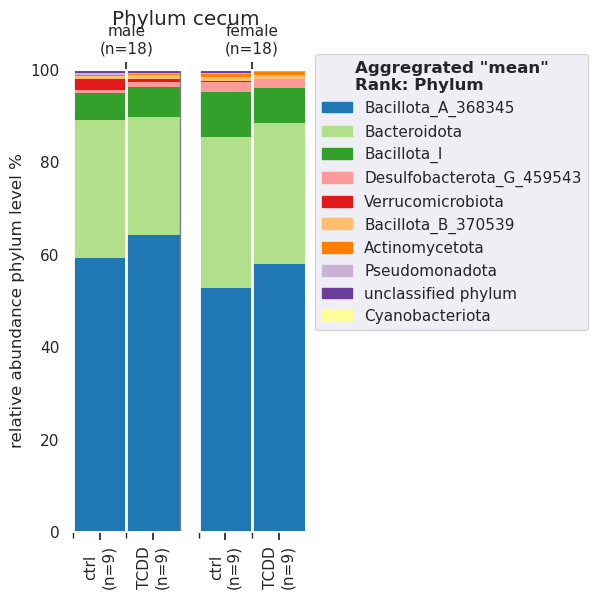

In [58]:
p = plotTaxonomy(res_cecal['rarefaction']['results'],
                 mfig.sort_values(by=['sex', 'condition'], ascending=[False, False]), 
                 rank='Phylum', file_taxonomy=res_cecal['taxonomy']['RDP']['results']['Taxon'],
                 group_l0='sex', group_l1='condition', #group_l2='condition',
                 fct_aggregate=np.mean, 
                 horizontal_spacer=[0.35, 0.02, None],
                 legend_remove_rank_prefix=True,
                 #reorder_samples=False
                 colors=colors_phyla,
                 #print_sample_labels=True,
                )
colors_phyla = p[4]
p[0].get_axes()[0].set_ylabel('relative abundance phylum level %')
p[0].get_axes()[0].set_yticklabels(map(lambda x: '%01.f' % (x*100), p[0].get_axes()[0].get_yticks()))
p[0].suptitle('Phylum cecum')
p[0].set_size_inches((3, 6))
_savefig(p[0], 'figS6_panelC')

### Panel D

In [62]:
%matplotlib inline

10 taxa left after collapsing to Phylum.
p-value annotation legend:
      ns: p <= 1.00e+00
       *: 1.00e-02 < p <= 5.00e-02
      **: 1.00e-03 < p <= 1.00e-02
     ***: 1.00e-04 < p <= 1.00e-03
    ****: p <= 1.00e-04

female_ctrl vs. female_TCDD: Mann-Whitney-Wilcoxon test two-sided with Benjamini-Hochberg correction, P_val:2.164e-01 U_stat=2.600e+01
male_ctrl vs. male_TCDD: Mann-Whitney-Wilcoxon test two-sided with Benjamini-Hochberg correction, P_val:1.577e-01 U_stat=2.400e+01
male_TCDD vs. female_ctrl: Mann-Whitney-Wilcoxon test two-sided with Benjamini-Hochberg correction, P_val:2.680e-03 U_stat=7.500e+01
male_ctrl vs. female_ctrl: Mann-Whitney-Wilcoxon test two-sided with Benjamini-Hochberg correction, P_val:4.799e-01 U_stat=4.900e+01
male_TCDD vs. female_TCDD: Mann-Whitney-Wilcoxon test two-sided with Benjamini-Hochberg correction, P_val:3.407e-02 (ns) U_stat=6.500e+01
male_ctrl vs. female_TCDD: Mann-Whitney-Wilcoxon test two-sided with Benjamini-Hochberg correction, P_val:1.

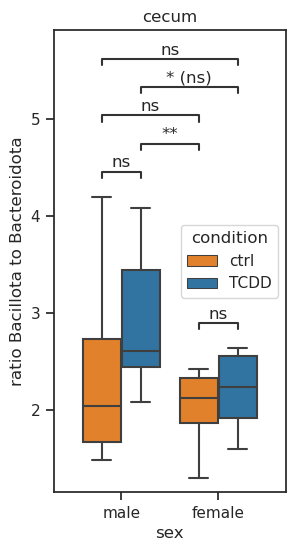

In [63]:
rank_counts = collapseCounts_objects(res_cecal['rarefaction']['results'], 'Phylum', res_cecal['taxonomy']['RDP']['results']['Taxon'])[0]
ratio_Bacillota_Bacteroidota = (rank_counts.loc[[p for p in rank_counts.index if p.startswith('p__Bacillota')], :].sum(axis=0) / rank_counts.loc[['p__Bacteroidota'], :].sum(axis=0))
ratio_Bacillota_Bacteroidota.name = 'ratio Bacillota to Bacteroidota'

fig, axes = plt.subplots(1,1, figsize=(3, 6))
sns.set_style('ticks')
plt.subplots_adjust(wspace=0.4)
hue_order = ['ctrl', 'TCDD']
for ax, (sex, g) in zip([axes], mfig.merge(ratio_Bacillota_Bacteroidota, left_index=True, right_index=True).sort_values(by=['sex'], ascending=[False]).groupby('timepoint', sort=False)):
    sns.boxplot(data=g, ax=ax,
                y=ratio_Bacillota_Bacteroidota.name, x='sex', hue='condition', hue_order=ORDER_CONDITIONS, palette=COLORS_CONDITIONS), #order=ORDER_TIMEPOINTS)
    ax.set_title('cecum')

    annotator = Annotator(ax, [
        (('male', 'ctrl'), ('male', 'TCDD')),
        (('female', 'ctrl'), ('female', 'TCDD')),

        (('male', 'ctrl'), ('female', 'ctrl')),
        (('male', 'TCDD'), ('female', 'TCDD')),

        (('male', 'TCDD'), ('female', 'ctrl')),
        (('male', 'ctrl'), ('female', 'TCDD')),
        
            ], data=g, y=ratio_Bacillota_Bacteroidota.name, hue='condition', x='sex', hue_order=ORDER_CONDITIONS) #order=ORDER_TIMEPOINTS)
        
    annotator.configure(test='Mann-Whitney', text_format='star', loc='inside', comparisons_correction="fdr_bh", correction_format="default")
    annotator.apply_and_annotate()
#fig.suptitle('cecum')
_savefig(fig, 'figS6_panelD')

# ASV Data reconstruction

In [5]:
import skbio
repseqs = dict()
for seq in skbio.io.read('Incoming/rep-seq.fasta', format='fasta'):
    hashv = seq.metadata['id']
    assert hashv not in repseqs.keys()
    repseqs[hashv] = str(seq)
repseqs = pd.Series(repseqs, name='ASV')

counts = pd.read_csv('Incoming/ASV_table.tsv', sep="\t")
counts = counts.merge(repseqs, left_on='ASV_ID', right_index=True).set_index('ASV')
if 'ASV_ID' in counts.columns:
    del counts['ASV_ID']

#prj_data['paths']['deblur_table'] = os.path.join(prj_data['paths']['tmp_workdir'], 'esser.biom')
#pandas2biom(prj_data['paths']['deblur_table'], counts)
#biom2pandas(
#prj_data['counts'] = counts
counts

,sample,sample_10,sample_11,sample_12,sample_13,sample_14,sample_15,sample_16,sample_17,sample_18,...,sample_66,sample_67,sample_68,sample_69,sample_7,sample_70,sample_71,sample_72,sample_8,sample_9
ASV,,,,,,,,,,,,,,,,,,,,,
GTGTCAGCAGCCGCGGTAATACGTAGGTGGCGAGCGTTATCCGGAATGATTGGGCGTAAAGGGTGCGTAGGCGGCCTGCTAAGTCTGGAGTGAAAGGTACCGGCTCAACCGGTACAGGCTCTGGAAACTGGCGGGCTAGAGAGCAGGAGAGGGCGGTGGAACTCCATGTGTAGCGGTAAAATGCGTAGATATATGGAAGAACACCAGTGGCGAAGGCGGCCGCCTGGCCTGTTAACTGACGCTGAGGCACGAAAGCGTGGGGAGCAAATAGGATTAGAAACCCC,846,255,397,813,824,1315,698,647,872,413,...,335,1094,735,492,460,363,209,41,634,636
GTGTCAGCCGCCGCGGTAATACGTAGGTGGCGAGCGTTATCCGGAATGATTGGGCGTAAAGGGTGCGTAGGCGGCCTGCTAAGTCTGGAGTGAAAGGTACCGGCTCAACCGGTACAGGCTCTGGAAACTGGCGGGCTAGAGAGCAGGAGAGGGCGGTGGAACTCCATGTGTAGCGGTAAAATGCGTAGATATATGGAAGAACACCAGTGGCGAAGGCGGCCGCCTGGCCTGTTAACTGACGCTGAGGCACGAAAGCGTGGGGAGCAAATAGGATTAGAAACCCC,596,387,538,621,636,1021,473,534,689,510,...,400,736,463,0,443,362,316,0,483,400
GTGTCAGCAGCCGCGGTAATACGTAGGTGGCGAGCGTTATCCGGAATGATTGGGCGTAAAGGGTGCGTAGGCGGCCTGCTAAGTCTGGAGTGAAAGGTACCGGCTCAACCGGTACAGGCTCTGGAAACTGGCGGGCTAGAGAGCAGGAGAGGGCGGTGGAACTCCATGTGTAGCGGTAAAATGCGTAGATATATGGAAGAACACCAGTGGCGAAGGCGGCCGCCTGGCCTGTTAACTGACGCTGAGGCACGAAAGCGTGGGGAGCAAATAGGATTAGATACCCC,655,394,464,575,674,845,526,492,685,413,...,272,853,469,0,394,305,188,0,450,401
GTGCCAGCAGCCGCGGTAATACGTAGGTGGCGAGCGTTATCCGGAATGATTGGGCGTAAAGGGTGCGTAGGCGGCCTGCTAAGTCTGGAGTGAAAGGTACCGGCTCAACCGGTACAGGCTCTGGAAACTGGCGGGCTAGAGAGCAGGAGAGGGCGGTGGAACTCCATGTGTAGCGGTAAAATGCGTAGATATATGGAAGAACACCAGTGGCGAAGGCGGCCGCCTGGCCTGTTAACTGACGCTGAGGCACGAAAGCGTGGGGAGCAAATAGGATTAGAAACCCC,544,329,493,593,620,891,506,527,625,438,...,219,755,458,0,333,248,208,0,403,381
GTGTCAGCAGCCGCGGTAATACGGAGGATGCGAGCGTTATCCGGATTTATTGGGTTTAAAGGGTGCGTAGGCGGCCTGCCAAGTCAGCGGTAAAATTGCGGGGCTCAACCCCGTACAGCCGTTGAAACTGCCGGGCTCGAGTGGGCGAGAAGTATGCGGAATGCGTGGTGTAGCGGTGAAATGCATAGATATCACGCAGAACCCCGATTGCGAAGGCAGCATACCGGCGCCCTACTGACGCTGAGGCACGAAAGTGCGGGGATCAAACAGGATTAGAAACCCCC,0,0,435,720,0,1051,422,0,0,0,...,0,1109,279,749,459,0,452,0,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
GTGTCAGCCGCCGCGGTAATACGTAGGGGGCAAGCGTTGTCCGGAATGATTGGGCGTAAAGGGCGCGTAGGCGGCCTGGTAAGTCTGGAGTGAAAGTCCTTCTTTTAAGGAGGGAATTGCTTTGGATACTGCTGGGCTTGAGTGCAGGAGAGGTAAGTGGAATTCCCAGTGTAGCGGTGAAATGCGTAGAGATTGGGAGGAACACCAGTGGCGAAGGCGACTTACTGGACTGTAACTGACGCTGAGGCGCGAAAGTGTGGGGAGCAAACAGGATTAGAAACCCC,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
GTGCCAGCCGCCGCGGTAATACGTAGGTGGCGAGCGTTGTCCGGAATGACTGGGCGTAAAGGGAGCGTAGGTTGCGATTTAAGTTAGATGTGAAAGCCCAAGGCTCAACCTTGGAACTGCAGCTAAAACTATAGATCTTGAGTGCAGGAGAGGTAAGTGGAATTCCTAGTGTAGCGGTGAAATGCGTAGATATTAGGAGGAACACCAGTGGCGAAGGCGACTTACTGGACTGTAACTGACGTTGAGGCACGAAAGTGTGGGGAGCAAACAGGATTAGATACCCC,0,0,0,0,0,0,0,0,0,0,...,0,0,0,2,0,0,0,0,0,0
GTGCCAGCCGCCGCGGTAATACGTAGGGTGCAAGCGTTATCCGGATTTACTGGGTGTAAAGGGCGAGTAGACGGCGTTGCAAGTCAGATGTGAAAGGCTAGGGCTCAACCTTAGGAGAGCATCTGAAACTGTAATGCTAGAGTGCAGGAGAGGGCGGTGGAACTCCATGTGTAGCGGTAAAATGCGTAGATATATGGAAGAACACCAGTGGCGAAGGCGGCCGCCTGGCCTGTTACTGACGCTGAGGCACGAAAGCGTGGGGAGCAAATAGGATTAGATACCCT,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,2,0,0,0,0,0


In [6]:
counts[counts.sum(axis=1) >= 10]

,sample,sample_10,sample_11,sample_12,sample_13,sample_14,sample_15,sample_16,sample_17,sample_18,...,sample_66,sample_67,sample_68,sample_69,sample_7,sample_70,sample_71,sample_72,sample_8,sample_9
ASV,,,,,,,,,,,,,,,,,,,,,
GTGTCAGCAGCCGCGGTAATACGTAGGTGGCGAGCGTTATCCGGAATGATTGGGCGTAAAGGGTGCGTAGGCGGCCTGCTAAGTCTGGAGTGAAAGGTACCGGCTCAACCGGTACAGGCTCTGGAAACTGGCGGGCTAGAGAGCAGGAGAGGGCGGTGGAACTCCATGTGTAGCGGTAAAATGCGTAGATATATGGAAGAACACCAGTGGCGAAGGCGGCCGCCTGGCCTGTTAACTGACGCTGAGGCACGAAAGCGTGGGGAGCAAATAGGATTAGAAACCCC,846,255,397,813,824,1315,698,647,872,413,...,335,1094,735,492,460,363,209,41,634,636
GTGTCAGCCGCCGCGGTAATACGTAGGTGGCGAGCGTTATCCGGAATGATTGGGCGTAAAGGGTGCGTAGGCGGCCTGCTAAGTCTGGAGTGAAAGGTACCGGCTCAACCGGTACAGGCTCTGGAAACTGGCGGGCTAGAGAGCAGGAGAGGGCGGTGGAACTCCATGTGTAGCGGTAAAATGCGTAGATATATGGAAGAACACCAGTGGCGAAGGCGGCCGCCTGGCCTGTTAACTGACGCTGAGGCACGAAAGCGTGGGGAGCAAATAGGATTAGAAACCCC,596,387,538,621,636,1021,473,534,689,510,...,400,736,463,0,443,362,316,0,483,400
GTGTCAGCAGCCGCGGTAATACGTAGGTGGCGAGCGTTATCCGGAATGATTGGGCGTAAAGGGTGCGTAGGCGGCCTGCTAAGTCTGGAGTGAAAGGTACCGGCTCAACCGGTACAGGCTCTGGAAACTGGCGGGCTAGAGAGCAGGAGAGGGCGGTGGAACTCCATGTGTAGCGGTAAAATGCGTAGATATATGGAAGAACACCAGTGGCGAAGGCGGCCGCCTGGCCTGTTAACTGACGCTGAGGCACGAAAGCGTGGGGAGCAAATAGGATTAGATACCCC,655,394,464,575,674,845,526,492,685,413,...,272,853,469,0,394,305,188,0,450,401
GTGCCAGCAGCCGCGGTAATACGTAGGTGGCGAGCGTTATCCGGAATGATTGGGCGTAAAGGGTGCGTAGGCGGCCTGCTAAGTCTGGAGTGAAAGGTACCGGCTCAACCGGTACAGGCTCTGGAAACTGGCGGGCTAGAGAGCAGGAGAGGGCGGTGGAACTCCATGTGTAGCGGTAAAATGCGTAGATATATGGAAGAACACCAGTGGCGAAGGCGGCCGCCTGGCCTGTTAACTGACGCTGAGGCACGAAAGCGTGGGGAGCAAATAGGATTAGAAACCCC,544,329,493,593,620,891,506,527,625,438,...,219,755,458,0,333,248,208,0,403,381
GTGTCAGCAGCCGCGGTAATACGGAGGATGCGAGCGTTATCCGGATTTATTGGGTTTAAAGGGTGCGTAGGCGGCCTGCCAAGTCAGCGGTAAAATTGCGGGGCTCAACCCCGTACAGCCGTTGAAACTGCCGGGCTCGAGTGGGCGAGAAGTATGCGGAATGCGTGGTGTAGCGGTGAAATGCATAGATATCACGCAGAACCCCGATTGCGAAGGCAGCATACCGGCGCCCTACTGACGCTGAGGCACGAAAGTGCGGGGATCAAACAGGATTAGAAACCCCC,0,0,435,720,0,1051,422,0,0,0,...,0,1109,279,749,459,0,452,0,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
GTGTCAGCAGCCGCGGTAATACGTGGGGAGCAAGCGTTATCCGGATTTACTGGGTGTAAAGGGCGCGTAGGCGGGATGGCAAGTCAGATGTGAAATCCAGGGGCTCAACCCCTGAACTGCATTTGAAACTGTCGTTCTTGAGTACTGGAGAGGTTGACGGAATTCCTAGTGTAGCGGTGAAATGCGTAGATATTAGGAGGAACACCAGTGGCGAAGGCGGTCAACTGGACAGCAACTGACGCTGAGGCGCGAAAGCGTGGGGAGCAAACAGGATTAGAAACCCT,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
GTGTCAGCCGCCGCGGTAATACGTAGGGGGCAAGCGTTATCCGGAATTATTGGGCGTAAAGAGTACGTAGGCGGTTCTTTAAGCGCAGGGTTTAAGGCGATAGCTTAACTATCGTTCGCCCTGTGAACTGGGGGACTTGAGTATCGGAGAGGAAAGCGGAATTCCTAGTGTAGCGGTGAAATGCGTAGATATTAGGAGGAACACCAGTGGCGAAGGCGGCTTTCTGGACGAAAACTGACGCTGAGGTACGAAAGCGTGGGGAGCAAACAGGATTAGAAACCCCC,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
GTGTCAGCAGCCGCGGTAATACGTAGGGAGCAAGCGTTATCCGGATTTACTGGGTGTAAAGGGCGAGTAGGCGGGCTGGCAAGTTGGGAGTGAAATCCCGGGGCTTAACCCCGGAACTGCTTTCAAAACTGCTGGTCTTGAGTGATGGAGAGGCAGGCGGAATTCCGTGTGTAGCGGTGAAATGCGTAGATATACGGAGGAACACCAGTGGCGAAGGCGGCCTGCTGGACATTAACTGACGCTGAGGAGCGAAAGCGTGGGGAGCAAACAGGATTAGATACCCG,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0


In [7]:
dbbact_wordcloud(counts)

use 75 of 3736 ASVs


ValueError: could not obtain F-scores from dbBact: BAD REQUEST
b'None of the 75 sequences were found in dbBact. Are these >100bp long 16S sequences?\nNote dbBact is populated mostly by EMP V4 (515F) amplicon sequences.'

In [216]:
counts_genus = pd.read_csv('/vol/jlab/MicrobiomeAnalyses/Projects/Esser_TCDD_2/tmp_workdir/no_backup/Aggregate_Summary-ds.23b8754159864171bf65b70f491e18b0/Genus_Level_Aggregate_Counts.csv', index_col=0)
counts_phylum = pd.read_csv('/vol/jlab/MicrobiomeAnalyses/Projects/Esser_TCDD_2/tmp_workdir/no_backup/Aggregate_Summary-ds.23b8754159864171bf65b70f491e18b0/Phylum_Level_Aggregate_Counts.csv', index_col=0)
counts_phylum.head()

,1,2,3,4,5,6,7,8,9,10,...,63,64,65,66,67,68,69,70,71,72
Phylum,,,,,,,,,,,,,,,,,,,,,
Bacteroidetes,17164,33938,22883,29205,23283,35469,12786,14628,13841,15198,...,27923,32090,19557,26854,25066,23309,17141,30868,22751,299
Firmicutes,25829,16453,22728,16456,19730,17085,21458,25174,19866,23006,...,24490,28017,15970,27646,27612,19176,23582,18121,21257,270
Verrucomicrobia,478,218,91,68,239,30,1668,370,111,1173,...,11,9,14,2855,37,31,12,38,203,4
Proteobacteria,203,221,195,285,337,161,380,249,262,422,...,420,537,467,1135,1081,729,546,429,689,4
Actinobacteria,207,342,279,198,243,240,131,215,189,253,...,1619,270,300,411,747,706,363,373,342,4


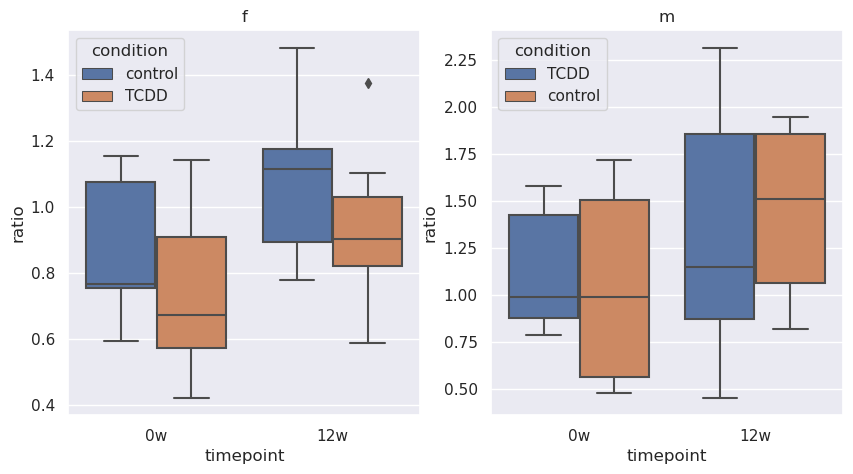

In [229]:
m_for = prj_data['metadata'].reset_index().set_index('sample_id')
ratio = counts_phylum.loc['Firmicutes', :] / counts_phylum.loc['Bacteroidetes', :]
ratio.name = 'ratio'
fig, axes = plt.subplots(1,2, figsize=(10,5))
for ax, (sex, g) in zip(axes, m_for.merge(ratio, left_index=True, right_index=True).groupby('sex')):
    sns.boxplot(data=g,
                y='ratio', x='timepoint', hue='condition', ax=ax)
    ax.set_title(sex)

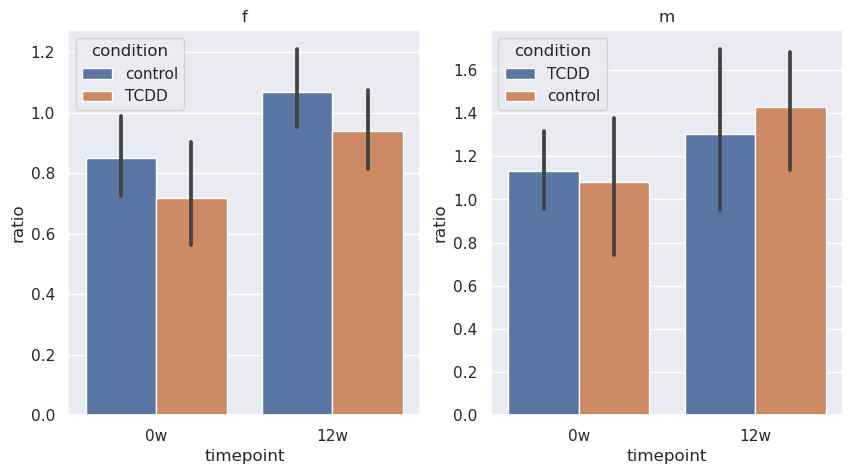

In [347]:
m_for = prj_data['metadata'].reset_index().set_index('sample_id')
ratio = counts_phylum.loc['Firmicutes', :] / counts_phylum.loc['Bacteroidetes', :]
ratio.name = 'ratio'
fig, axes = plt.subplots(1,2, figsize=(10,5))
for ax, (sex, g) in zip(axes, m_for.merge(ratio, left_index=True, right_index=True).groupby('sex')):
    sns.barplot(data=g,
                y='ratio', x='timepoint', hue='condition', ax=ax)
    ax.set_title(sex)

In [346]:
m_for.merge(ratio, left_index=True, right_index=True).groupby(['sex', 'timepoint', 'condition'])['ratio'].describe()

count      mean       std       min       25%  \
sex timepoint condition                                                  
f   0w        TCDD         9.0  0.719023  0.260322  0.422998  0.572757   
              control      9.0  0.850953  0.212004  0.595356  0.755622   
    12w       TCDD         9.0  0.938175  0.218925  0.587048  0.822687   
              control      9.0  1.069364  0.213058  0.779459  0.893652   
m   0w        TCDD         9.0  1.132069  0.306768  0.787656  0.879151   
              control      9.0  1.078878  0.514308  0.481688  0.563465   
    12w       TCDD         9.0  1.305286  0.605315  0.455588  0.871852   
              control      9.0  1.426980  0.430977  0.818571  1.064019   

                              50%       75%       max  
sex timepoint condition                                
f   0w        TCDD       0.671836  0.908267  1.142802  
              control    0.766425  1.074792  1.154324  
    12w       TCDD       0.903010  1.029493  1.375766  
              control    1.115779  1.176217  1.480879  
m   0w        TCDD       0.991951  1.428347  1.583059  
              control    0.993226  1.504836  1.720946  
    12w       TCDD       1.149897  1.856101  2.315028  
              control    1.511437  1.855314  1.945460

In [10]:
res_beta = beta_diversity(counts, metrics=['bray_curtis'], dry=False, wait=False)

Found 1 temporary working directories, but non of them have finished (missing "finished.info" file). If no job is currently running, you might want to delete these directories and restart:
  /homes/sjanssen/TMP/ana_bdiv_rzdvsb9v


/tmp/ipykernel_3872339/1205888416.py:1: FutureWarning: The default dtype for empty Series will be 'object' instead of 'float64' in a future version. Specify a dtype explicitly to silence this warning.
  p = plotTaxonomy(counts, prj_data['metadata'], rank='raw', file_taxonomy=pd.Series(index=counts.index), group_l0='sex', group_l1='timepoint', group_l2='condition', fct_aggregate=np.mean)
/homes/sjanssen/Git/sjanssen2/ggmap/ggmap/snippets.py:480: FutureWarning: Passing a set as an indexer is deprecated and will raise in a future version. Use a list instead.
  counts_taxonomy = counts_taxonomy.loc[:, sample_cols]


72 samples left with metadata and counts.
280 taxa left after filtering low abundant.
raw counts: 72
raw meta: 72
meta with counts: 8 samples x 5 fields
counts with meta: 8


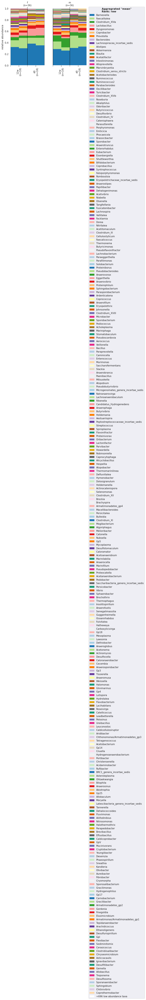

In [48]:
p = plotTaxonomy(counts, prj_data['metadata'], rank='raw', file_taxonomy=pd.Series(index=counts.index), group_l0='sex', group_l1='timepoint', group_l2='condition', fct_aggregate=np.mean)

In [51]:
for (sex, timepoint), g in prj_data['metadata'].groupby(['sex', 'timepoint']):
    print(sex, timepoint, g.shape[0])
    plotNetworks('condition', g, None, res_beta['results'], name=','.join([sex, timepoint]), 

f 12w 18
f d0 18
m 12w 18
m d0 18


## Initiate new project

In [17]:
prj_data = init_project(pi=PROJECT_PI, name=PROJECT_NAME, prj_data=prj_data, force=True)
# Should you receive file permission errors, it could well be the case that Stefan already 
# executed this function (for you) and directory structure already exists. Try to set
# force=True and re-execute!

  /vol/jlab/MicrobiomeAnalyses/Projects/Esser_TCDD_2/tmp_workdir_sjanssen/no_backup


## Load metadata

In [18]:
prj_data['metadata'] = pd.read_csv('Incoming/metadata.csv', sep=";", dtype=str, na_values=['not applicable']).set_index('sample')
#prj_data['paths'] = {'tmp_workdir': 'tmp_workdir/no_backup'}

prj_data['metadata']

,animal ID,sex,condition,timepoint
sample,,,,
1,55187,m,control,d0
2,55188,m,control,d0
3,55189,m,control,d0
4,55190,m,control,d0
5,55191,m,control,d0
...,...,...,...,...
68,55223,f,TCDD,12w
69,55224,f,TCDD,12w
70,55225,f,TCDD,12w


## Deposit raw data
After calling the `init_project()` function above, you should start moving raw data into newly created directory structure, i.e.
  - raw Illumina data
  - Illumina demultiplexing sheet

## BaseCalling + Demulitplex

In [19]:
if False:
    prj_data = project_demux(
        'PATH TO YOUR ILLUMINA RAW DATA', 
        'PATH TO YOUR DEMUX-SHEET IN CSV FORMAT', 
        prj_data)
else:
    prj_data['paths']['demux'] = '/vol/jlab/MicrobiomeAnalyses/Projects/Esser_TCDD_2/tmp_workdir/no_backup/Fecal/Fastq_16s_fecal_dna/'

## Trim primers

In [20]:
# Jeremy used the ASV biom table to guess V regions via VXdetector
# result was V4-V5, but I am totally guessing here for the primer sequences :-/
prj_data = project_trimprimers(
    "GTGYCAGCMGCCGCGGTAA", 
    "CCGYCAATTYMTTTRAGTTT", prj_data, no_rev_seqs=True)
# we expect per sample fastq files to follow the default naming schema: _R1_001.fastq.gz
# should this not apply to your data, supply the optional parameters: pattern_fwdfiles and/or r1r2_replace

Working directory is '/homes/sjanssen/TMP/ana_trim_dzmgnfwo', cachefile is '.anacache/82a9263b00a765bcb3cef0b32d56e662.trim'. 
collect trimming stats: 100%|██████████| 384/384 [16:31<00:00,  2.58s/it]
moving trimmed file '100_S100_L001_R1_001.fastq.gz' into 'tmp_workdir_sjanssen/no_backup/trimmed'
moving trimmed file '101_S101_L001_R1_001.fastq.gz' into 'tmp_workdir_sjanssen/no_backup/trimmed'
moving trimmed file '102_S102_L001_R1_001.fastq.gz' into 'tmp_workdir_sjanssen/no_backup/trimmed'
moving trimmed file '103_S103_L001_R1_001.fastq.gz' into 'tmp_workdir_sjanssen/no_backup/trimmed'
moving trimmed file '104_S104_L001_R1_001.fastq.gz' into 'tmp_workdir_sjanssen/no_backup/trimmed'
moving trimmed file '105_S105_L001_R1_001.fastq.gz' into 'tmp_workdir_sjanssen/no_backup/trimmed'
moving trimmed file '106_S106_L001_R1_001.fastq.gz' into 'tmp_workdir_sjanssen/no_backup/trimmed'
moving trimmed file '107_S107_L001_R1_001.fastq.gz' into 'tmp_workdir_sjanssen/no_backup/trimmed'
moving trimmed 

cutadapt                  4.2             py310h1425a21_0    bioconda


 Was removed.


,read,written,ratio
forward,2.396428e+06,2.237128e+06,0.963725


## Deblur

In [22]:
prj_data = project_deblur(prj_data)
# we expect per sample fastq files to follow the default naming schema: _R1_001.fastq.gz
# should this not apply to your data, supply the optional parameters: pattern_fwdfiles (we never use reverse reads for Deblur, thus r1r2_replace is not available)

using version: deblur, version 1.1.1


deblur already computed


## SEPP

In [23]:
x = pd.DataFrame(data=biom2pandas(prj_data['paths']['deblur_table']).columns, columns=['sample_name'])
x['meta_sample_name'] = x['sample_name'].apply(lambda x: x.split('_')[0])

prj_data['metadata'] = prj_data['metadata'].merge(x, left_index=True, right_on='meta_sample_name').set_index('sample_name')

use 370 of 719 ASVs


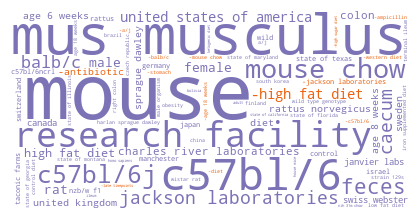

In [24]:
dbbact_wordcloud(biom2pandas(prj_data['paths']['deblur_table']))['figure']

In [25]:
prj_data = project_sepp(prj_data, use_grid=True)

Working directory is '/homes/sjanssen/TMP/ana_sepp_a_ort6n8', cachefile is '.anacache/d15bfc95e6180f0d09f3c2f6b1c8abdf.sepp'. 
Waiting for slurm-cluster job 25620888 to complete: ...............................................................................................................................................
KeyboardInterrupt



before starting big compute, double check sources of metadata and feature table. It is not unlikely that you partially use data from Qiita and mix with local metadata that lack qiita-study-id prefix like `14078.`

In [14]:
#qiita_metadata = any(map(lambda x: 'qiita' in x.lower(), prj_data['metadata'].columns)) and all(map(lambda x: re.match('^\d+\.', x) is not None, prj_data['metadata'].index))
#qiita_counts = all(map(lambda x: re.match('^\d+\.', x) is not None, biom2pandas(prj_data['paths']['deblur_table']).columns))
#if (qiita_metadata != qiita_counts) and (len(set(qiita_metadata.index) & set(biom2pandas(prj_data['paths']['deblur_table']).columns))) <= 0:
#    raise ValueError("Please double check that both, metadata and feature table stem from Qiita or other sources. It looks like sample indices do not match!")

## Rarefaction + Diversity + Emperor

You have to run the below function at least twice: 
 - First, to get rarefaction curves, which you will use to determine a rarefaction depth for samples to compute diversity values
 - Second, alpha- beta- and emperor computation need ONE specific `rarefaction_depth` value, which you have determined in step 1

Information: no features had less than 10 reads.
Using existing results from '.anacache/84f57d20bcafc2ad09561775c214b0e3.taxRDP'. 
Using existing results from '.anacache/90879f8a2a240f9f72481e5419c619d6.taxRDP'. 
In total, 0 reads (0.000000%) have been filtered for chloroplast/mitochondia removal.
Using existing results from '.anacache/55be8e3e6cfda83fed84d670dfdf049b.rare'. 
Using existing results from '.anacache/c9ef01bc7750a1824ccffcf57d696d5c.rarefy'. 
found matching working dir "/homes/sjanssen/TMP/ana_adiv_wh6mfej_"
 Was removed.
Using existing results from '.anacache/879c76fc25b485fe68117aaea26ba153.bdiv'. 
Using existing results from '.anacache/0d3514b642ff8fbadc51bcd4661cc6c1.emperor'. 
Your final feature table is composed of 70 samples and 719 features.


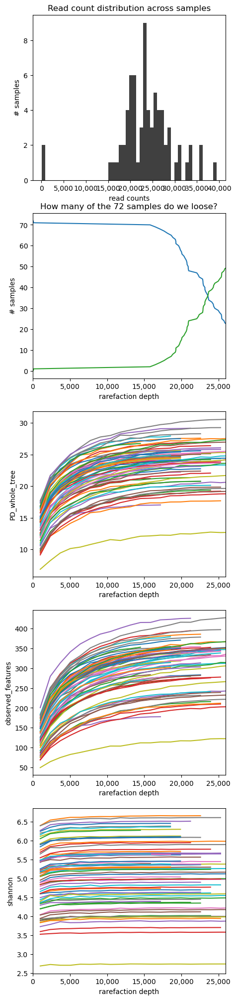

In [69]:
idx_control_samples = set([]) # set(prj_data['metadata'][prj_data['metadata']['sample_type'] == 'control'].index)
res_all = process_study(
    metadata=prj_data['metadata'],
    control_samples=idx_control_samples,
    fp_deblur_biom=prj_data['paths']['deblur_table'],
    fp_insertiontree=prj_data['paths']['insertion_tree'],
    rarefaction_depth=15000,
    fp_taxonomy_trained_classifier_gg138_chloroMitoRemoval='/vol/jlab/MicrobiomeAnalyses/References/Q2-Naive_Bayes_classifiers/gg-13-8-99-nb-classifier_2022.11.qza',
    fp_taxonomy_trained_classifier='/homes/sjanssen/MicrobiomeAnalyses/References/Q2-Naive_Bayes_classifiers/2022.10.backbone.full-length.nb.sklearn-1.4.2.qza',
    tree_insert=prj_data['insertion_tree'],
    is_v4_region=False,
    emperor_fp=prj_data['paths']['Generated/Emperor'],
    emperor_infix='_deblur_',
    dry=False,
    use_grid=True,
    fix_zero_len_branches=False, # since this has already been corrected via the project_sepp call
    ignore_noplantmito=True
)

### stratify rarefaction curves by metadata

Using existing results from '.anacache/55be8e3e6cfda83fed84d670dfdf049b.rare'. 


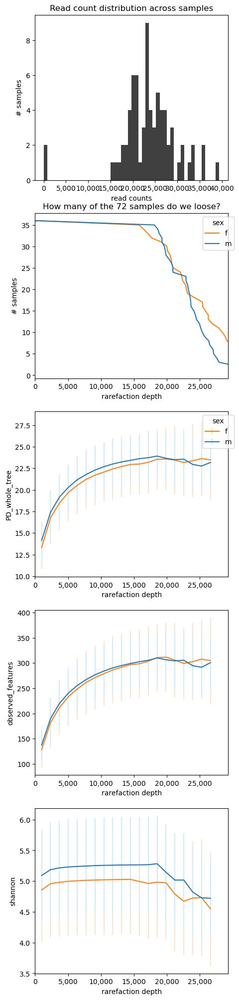

In [70]:
_ = rarefaction_curves(
    res_all['counts_plantsremoved'], 
    reference_tree=prj_data['paths']['insertion_tree'], 
    control_sample_names=idx_control_samples, 
    fix_zero_len_branches=False, # since this has already been corrected via the project_sepp call
    sample_grouping=prj_data['metadata']["sex"], 
    dry=False)

# Explore Data

## Taxonomy Barplot

43 taxa left after collapsing to Family.
70 samples left with metadata and counts.
37 taxa left after filtering low abundant.
raw counts: 70
raw meta: 72
meta with counts: 70 samples x 6 fields
counts with meta: 70


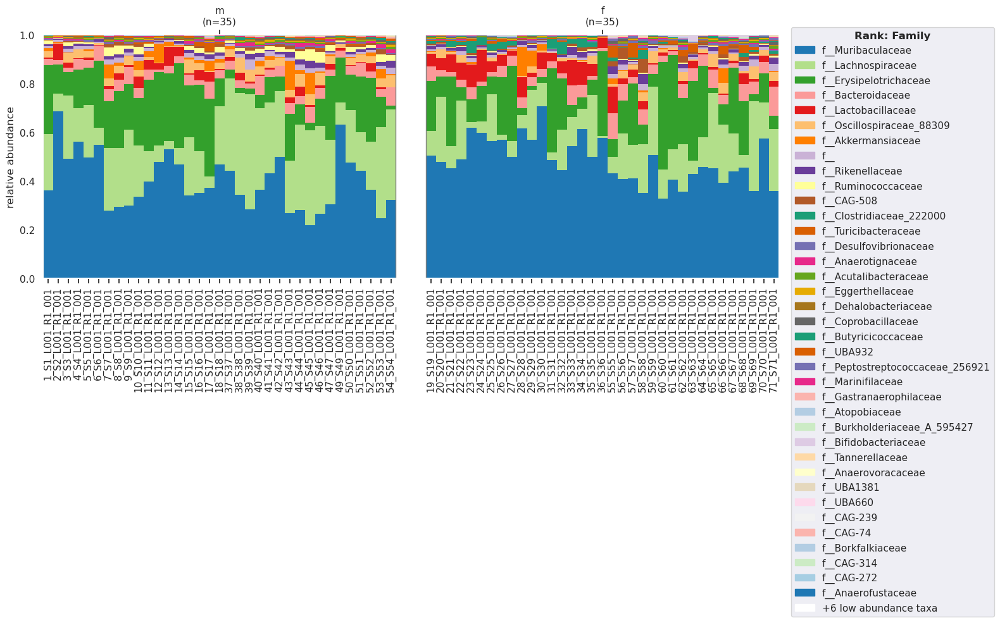

In [147]:
p = plotTaxonomy(res_all['rarefaction']['results'], prj_data['metadata'], file_taxonomy=res_all['taxonomy']['RDP']['results']['Taxon'],
                 group_l1='sex', rank='Family',
                 print_sample_labels=True)
p[0].set_size_inches((15, 5))

## Correlation: within metadata
Without knowing too much about the metadata, let is check if the different columns correlate with each other. If so, we have redundant information and it might be worth ignoring one of the columns in downstream analysis.

We need to classify metadata columns into four categories to optimally harvest statistical power:
  - dates, e.g. `collection_timestamp`: `2021-12-06 00:00:00`
  - interval data, e.g. `host_height` in cm: `186`
  - ordinal data, e.g. `shower_frequency`: `once per week` < `every day` < `multiple times per day`
  - categorial data, e.g. `genotype`: `balb`, `black6`

In [71]:
cols_ignore = set()
for c in prj_data['metadata'].columns:
    if prj_data['metadata'][c].dropna().unique().shape[0] == 1:
        # ignore column, since it contains only ONE value for all samples
        cols_ignore.add(c)
    if prj_data['metadata'][c].dropna().unique().shape[0] == prj_data['metadata'][c].dropna().shape[0]:
        # ignore column, since every sample comes with another value
        cols_ignore.add(c)

cols_date = { # a dictionary where key = column name and value = format string to correctly parse date information
    # 'collection_timestamp': '%Y-%m-%d %h:%m:%s'
}
cols_interval = set([
    # host_height,
])
cols_ordinal = { # note this is a dictionary with keys = column names and values = lists of potential strings in the metadata ORDERED in the list
    # 'shower_frequency': ['once per week', 'every day', 'multiple times per day'],
}
cols_categorial = set([
    'animal ID', 'sex', 'condition', 'timepoint'
    #'diseased', 'sample_type'
])

In [72]:
# use this output to decide how to classify remaining metadata columns
# when done, this function should not output anything
for c in prj_data['metadata'].columns:
    if c in cols_ordinal.keys() or c in cols_ignore or c in cols_categorial or c in cols_date.keys() or c in cols_interval:
        continue
    print(c, prj_data['metadata'][c].value_counts(dropna=False))
    print("--------")

,animal ID,condition,sex,timepoint
animal ID,1.000000,0.707107,0.707107,0.0
condition,0.707107,1.000000,0.000000,0.0
sex,0.707107,0.000000,1.000000,0.0
timepoint,0.000000,0.000000,0.000000,1.0


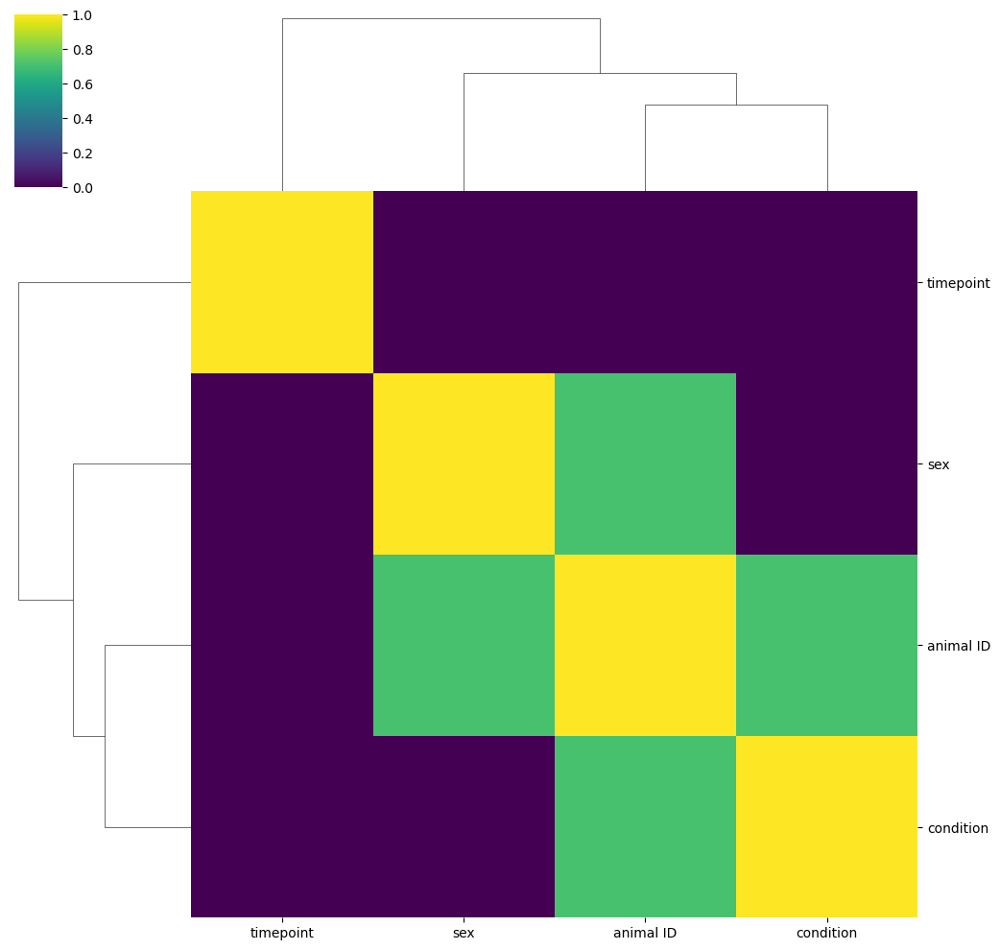

In [73]:
res_corrmeta = correlate_metadata(prj_data['metadata'][list(set(prj_data['metadata'].columns) - set(cols_ignore))], categorials=list(cols_categorial), ordinals=cols_ordinal, dates=cols_date, intervals=list(cols_interval))
display(res_corrmeta[1])

## Correlation: metadata with microbiome
We are throwing a whole arsenal of statistical tests on multiple metrics to the data to find something that looks significant. Go through the resulting table of p-values and look for significant ones that you can further investigate

In [75]:
corr_diversity = correlation_diversity_metacolumns(
    prj_data['metadata'][sorted(list(set(cols_categorial) | set(cols_date.keys()) | set(cols_ordinal.keys()) | set(cols_interval)))].fillna('NaN'),
    list(sorted(set(cols_categorial) | set(cols_ordinal.keys()))),
    res_all['alpha_diversity']['results'], 
    res_all['beta_diversity']['results'],
    dry=False, wait=False, use_grid=True, dirty=True)

Reducing analysis to 70 samples.
found matching working dir "/homes/sjanssen/TMP/ana_corr-divmeta_0lhjjgtk"


In [76]:
pd.pivot_table(data=corr_diversity['results'], columns='column', index=['div','type','metric','test'], values='p-value').fillna("")

column                                                                  __fake_qiime2_numcol  \
div   type               metric             test                                               
alpha correlation        PD_whole_tree      pearson                                   0.0001   
                         observed_features  pearson                                   0.0002   
                         shannon            pearson                                   0.0016   
      group-significance PD_whole_tree      Kruskal-Wallis (all groups)                        
                         observed_features  Kruskal-Wallis (all groups)                        
                         shannon            Kruskal-Wallis (all groups)                        
beta  group-significance bray_curtis        anosim                                             
                                            permanova                                          
                         unweighted_unifrac anosim                                             
                                            permanova                                          
                         weighted_unifrac   anosim                                             
                                            permanova                                          

column                                                                  animal%20ID  \
div   type               metric             test                                      
alpha correlation        PD_whole_tree      pearson                                   
                         observed_features  pearson                                   
                         shannon            pearson                                   
      group-significance PD_whole_tree      Kruskal-Wallis (all groups)    0.830895   
                         observed_features  Kruskal-Wallis (all groups)     0.75497   
                         shannon            Kruskal-Wallis (all groups)    0.496997   
beta  group-significance bray_curtis        anosim                                    
                                            permanova                                 
                         unweighted_unifrac anosim                                    
                                            permanova                                 
                         weighted_unifrac   anosim                                    
                                            permanova                                 

column                                                                  condition  \
div   type               metric             test                                    
alpha correlation        PD_whole_tree      pearson                                 
                         observed_features  pearson                                 
                         shannon            pearson                                 
      group-significance PD_whole_tree      Kruskal-Wallis (all groups)  0.841664   
                         observed_features  Kruskal-Wallis (all groups)  0.883221   
                         shannon            Kruskal-Wallis (all groups)  0.672272   
beta  group-significance bray_curtis        anosim                          0.901   
                                            permanova                         0.9   
                         unweighted_unifrac anosim                          0.819   
                                            permanova                       0.806   
                         weighted_unifrac   anosim                           0.87   
                                            permanova                       0.799   

column                                                                        sex  \
div   type               metric             test                                    
alpha correlation        PD_whole_tree      pearson                        

collapse above table to smallest p-value per column.

In [77]:
sig_cols = {k for k,v in corr_diversity['results'].groupby('column')['p-value'].min().iteritems() 
            if v < 0.05 
            if k != '__fake_qiime2_numcol'}
display(corr_diversity['results'][corr_diversity['results']['column'].isin(sig_cols)].groupby('column')['p-value'].min())

/tmp/ipykernel_3711885/2665748023.py:1: FutureWarning: iteritems is deprecated and will be removed in a future version. Use .items instead.
  sig_cols = {k for k,v in corr_diversity['results'].groupby('column')['p-value'].min().iteritems()


column
sex          1.000000e-03
timepoint    1.597982e-07
Name: p-value, dtype: float64

In [95]:
# subset columns to those that significantly correlate with microbiome data
# you should manually reduce the number of columns you want to investigate, 
# since every addition of a column costs a lot of statistical power and a too complex model might find nothing at all!
model_cols_date = {k: v for k,v in cols_date.items() if k in sig_cols}
model_cols_interval = {c for c in cols_interval if c in sig_cols}
model_cols_ordinal = {k: v for k,v in cols_ordinal.items() if k in sig_cols}
model_cols_categorial = set(['sex', 'timepoint'])# {c for c in cols_categorial if c in sig_cols}

found matching working dir "/homes/sjanssen/TMP/ana_fRDAalpha_pb7xu4oy"
 Was removed.
No significant findings.
found matching working dir "/homes/sjanssen/TMP/ana_fRDAalpha_yr6f_8l5"
 Was removed.
Using existing results from '.anacache/8ece54c42705bb3369cb2b6a3a2f0663.fRDAalpha'. 
No significant findings.
Using existing results from '.anacache/1f50e5454d0fa5a46515fbb0f16e5b50.fRDAbeta'. 
Using existing results from '.anacache/054c14ade85d3ae50a104f150709522e.fRDAbeta'. 
Using existing results from '.anacache/2bd60d64dd8ae47670375ea3376ff614.fRDAbeta'. 


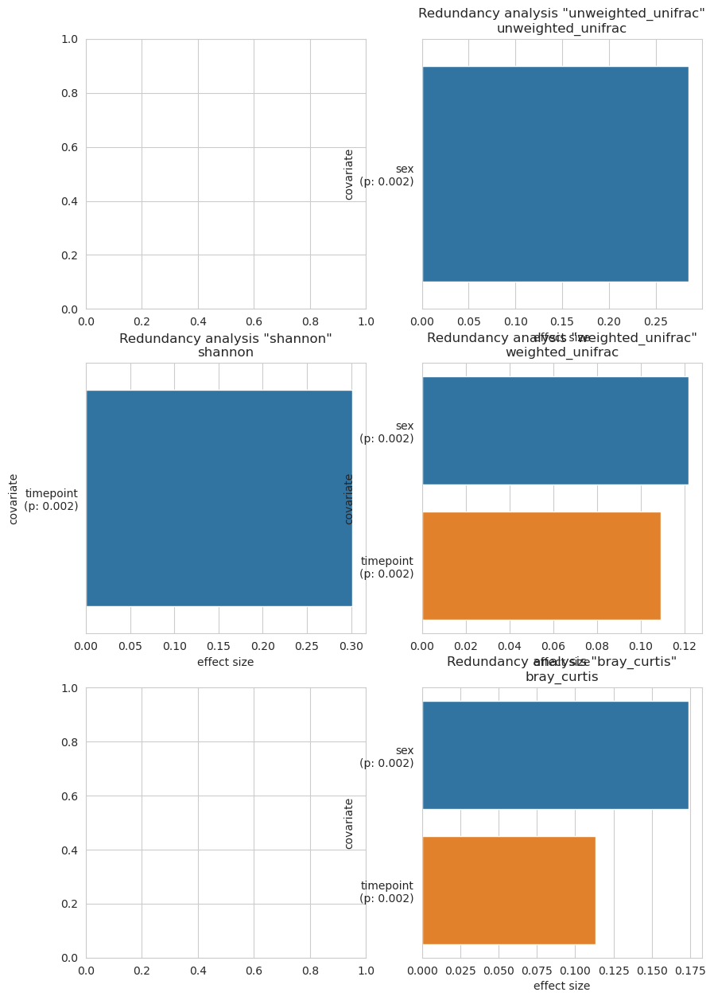

In [96]:
sns.set_style("whitegrid")
usegrid = True

max_rows = max(len(res_all['alpha_diversity']['results'].keys()), len(res_all['beta_diversity']['results'].keys()))
fig, axes = plt.subplots(max_rows, 2, figsize=(5*2, 5*max_rows))
for i, metric in enumerate(res_all['alpha_diversity']['results'].keys()):
    redundancy_analysis_alpha(prj_data['metadata'][sorted(list(set(model_cols_categorial) | set(model_cols_date.keys()) | set(model_cols_ordinal.keys()) | set(model_cols_interval)))],
                              res_all['alpha_diversity']['results'][metric],
                              categorials=list(model_cols_categorial), intervals=list(model_cols_interval), dates=model_cols_date, ordinals=model_cols_ordinal,
                              ax=axes[i][0], title='%s' % metric,
                              dry=False, wait=False, use_grid=usegrid)
for i, metric in enumerate(res_all['beta_diversity']['results'].keys()):
    redundancy_analysis_beta(prj_data['metadata'][sorted(list(set(model_cols_categorial) | set(model_cols_date.keys()) | set(model_cols_ordinal.keys()) | set(model_cols_interval)))],
                             res_all['beta_diversity']['results'][metric], metric,
                             categorials=list(model_cols_categorial), intervals=list(model_cols_interval), dates=model_cols_date, ordinals=model_cols_ordinal,
                             ax=axes[i][1], title='%s' % metric,
                             dry=False, wait=False, use_grid=usegrid)

f 12w (18, 5)
f d0 (18, 5)
m 12w (18, 5)
m d0 (18, 5)


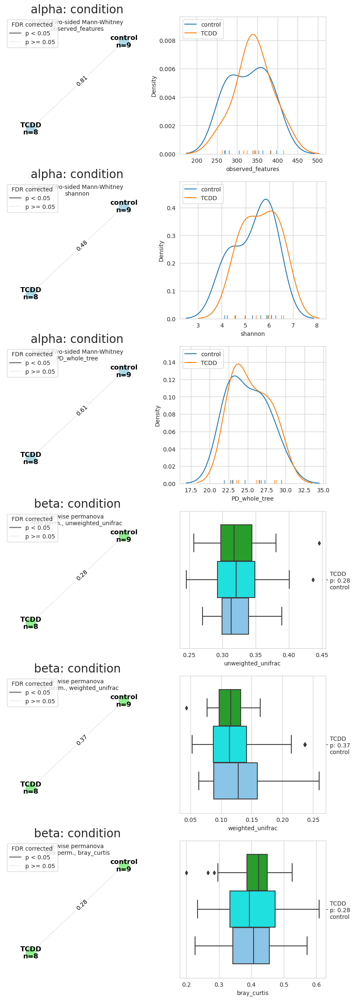

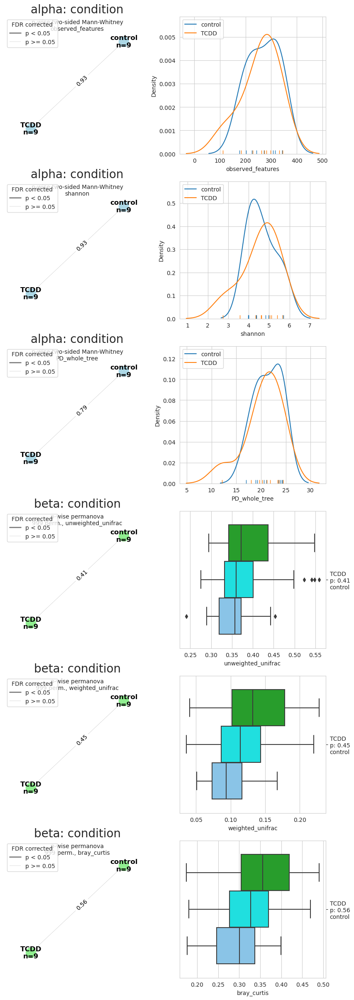

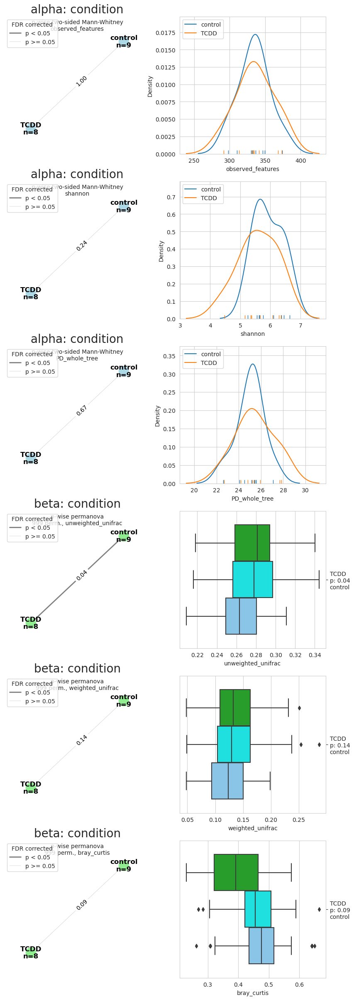

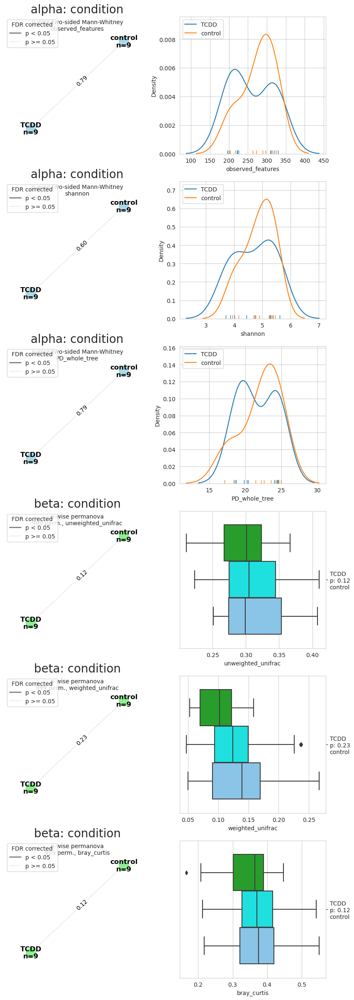

In [97]:
for (s,t), n in prj_data['metadata'].groupby(['sex', 'timepoint']):
    print(s, t, n.shape)
    plotNetworks('condition', n, res_all['alpha_diversity']['results'], res_all['beta_diversity']['results'], minnumalpha=1)

In [120]:
dists = []
for metric in res_all['beta_diversity']['results'].keys():
    dm = res_all['beta_diversity']['results'][metric].to_data_frame()
    for (s,t), n in prj_data['metadata'].loc[list(set(prj_data['metadata'].index) & set(dm.index))].groupby(['sex', 'timepoint']):
        for cond in n['condition'].unique():
            for (a,b) in itertools.combinations(n[n['condition'] == cond].index, 2):
                dists.append((metric, s, t, 'within %s' % cond, dm.loc[a,b]))
            for a in n[n['condition'] == n['condition'].unique()[0]].index:
                for b in n[n['condition'] == n['condition'].unique()[1]].index:
                    dists.append((metric, s, t, 'between', dm.loc[a,b]))
dists = pd.DataFrame(dists, columns=['metric', 'sex', 'timepoint', 'group', 'distance'])
dists.head()

,metric,sex,timepoint,group,distance
0,unweighted_unifrac,f,12w,within control,0.270300
1,unweighted_unifrac,f,12w,within control,0.275085
2,unweighted_unifrac,f,12w,within control,0.309719
3,unweighted_unifrac,f,12w,within control,0.319596
4,unweighted_unifrac,f,12w,within control,0.301274


p-value annotation legend:
      ns: p <= 1.00e+00
       *: 1.00e-02 < p <= 5.00e-02
      **: 1.00e-03 < p <= 1.00e-02
     ***: 1.00e-04 < p <= 1.00e-03
    ****: p <= 1.00e-04

d0_within TCDD vs. 12w_within TCDD: Mann-Whitney-Wilcoxon test two-sided with Benjamini-Hochberg correction, P_val:6.961e-04 U_stat=1.310e+03
d0_within control vs. 12w_within control: Mann-Whitney-Wilcoxon test two-sided with Benjamini-Hochberg correction, P_val:2.471e-09 U_stat=1.099e+03
d0_between vs. 12w_between: Mann-Whitney-Wilcoxon test two-sided with Benjamini-Hochberg correction, P_val:1.482e-29 U_stat=2.201e+04
p-value annotation legend:
      ns: p <= 1.00e+00
       *: 1.00e-02 < p <= 5.00e-02
      **: 1.00e-03 < p <= 1.00e-02
     ***: 1.00e-04 < p <= 1.00e-03
    ****: p <= 1.00e-04

d0_within TCDD vs. 12w_within TCDD: Mann-Whitney-Wilcoxon test two-sided with Benjamini-Hochberg correction, P_val:1.493e-04 U_stat=2.806e+03
d0_within control vs. 12w_within control: Mann-Whitney-Wilcoxon test two

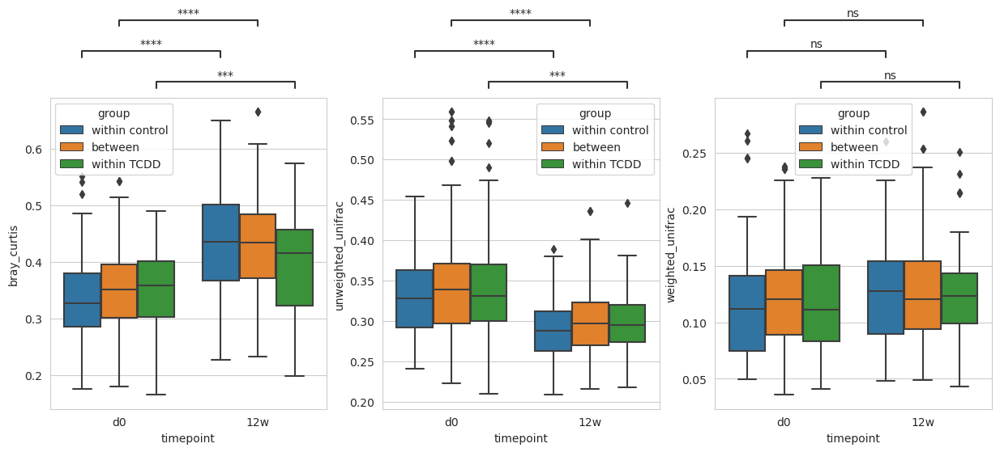

In [140]:
fig, axes = plt.subplots(1,3, figsize=(15,5))
for (ax, (metric, g)) in zip(axes, dists.groupby('metric')):
    order_tp = ['0w', '12w']
    sns.boxplot(data=g, y='distance', hue='group', x='timepoint', ax=ax, order=order_tp)
    ax.set_ylabel(metric)

    if False:
        annotator = Annotator(ax, [
                (('0w','within control'),('0w', 'between')),
                (('0w','within TCDD'),('0w', 'between')),
                (('12w','within control'),('12w', 'between')),
                (('12w','within TCDD'),('12w', 'between'))
            ], data=g, y='distance', hue='group', x='timepoint', order=order_tp)
    if True:
        annotator = Annotator(ax, [
                (('0w','within control'),('12w', 'within control')),
                (('0w','within TCDD'),('12w', 'within TCDD')),
                (('0w','between'),('12w', 'between')),
                #(('0w','within TCDD'),('0w', 'between')),
                #(('12w','within control'),('12w', 'between')),
                #(('12w','within TCDD'),('12w', 'between'))
            ], data=g, y='distance', hue='group', x='timepoint', order=order_tp)
        
    annotator.configure(test='Mann-Whitney', text_format='star', loc='outside', comparisons_correction="fdr_bh", correction_format="default")
    #annotator.configure(test='Mann-Whitney', text_format='star', loc='outside', comparisons_correction=None, correction_format="default")
    annotator.apply_and_annotate()

In [113]:
for (timepoint, condition, metric), g in dists.groupby([2, 3, 0]):
    print(timepoint, condition, metric, g.shape)

12w between bray_curtis (288, 5)
12w between unweighted_unifrac (288, 5)
12w between weighted_unifrac (288, 5)
12w within TCDD bray_curtis (56, 5)
12w within TCDD unweighted_unifrac (56, 5)
12w within TCDD weighted_unifrac (56, 5)
12w within control bray_curtis (72, 5)
12w within control unweighted_unifrac (72, 5)
12w within control weighted_unifrac (72, 5)
d0 between bray_curtis (324, 5)
d0 between unweighted_unifrac (324, 5)
d0 between weighted_unifrac (324, 5)
d0 within TCDD bray_curtis (72, 5)
d0 within TCDD unweighted_unifrac (72, 5)
d0 within TCDD weighted_unifrac (72, 5)
d0 within control bray_curtis (72, 5)
d0 within control unweighted_unifrac (72, 5)
d0 within control weighted_unifrac (72, 5)


# Specific Analysis types
All above analysis can be applied on any kind of dataset. The following assume specific experimental designs and/or hypothesis you want to follow, i.e. it might **not** make sense for you to execute them! Decide yourself.

## Temporal Analysis
You might have time series data, i.e. multiple samples from the same individual across time. To visualize the experimental design, you might want to compute a "Gantt"-chart of the samples timepoints per individual. Here is an example:
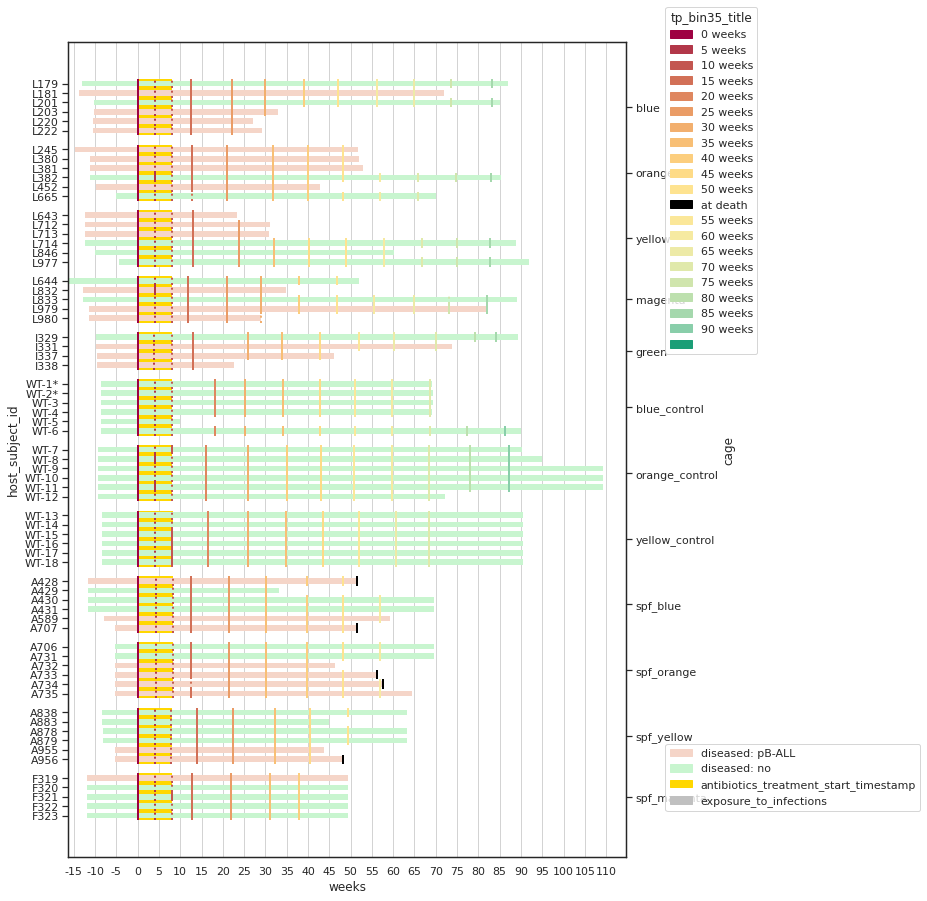
(from https://github.com/jlab/microbiome_pax5/blob/master/4Cohorts/pax5_cohousing_abx_bmt.ipynb)

In [ ]:
chart, col, info = ganttChart(
    prj_data['metadata'],
    col_birth='birth_timestamp',  # metadata column that flags the start of the timeline, must be some parsable dates like 2022-10-09
    col_entities='host_subject_id',  # metadata column that contains name of the person/animal which has been sampled over time, i.e. to know which samples belong to the same line
    col_events='collection_timestamp', # metadata column that indicate the exact date when samples have been collected
    # col_events_title='tp_bin35_title', # you might want to provide a metadata column to give sampling events more speaking names
    # align_to_event_title='0 weeks', # by default, lines are drawn by actual date. However, often it makes sense to align them to the first timepoint of an intervention
    )

## SourceTracking
Assess if a microbial community might be the result of "sourcing" bacteria from different other microbial communities. Imagine you shake hands with four different people. You sample your hand and the four hands of the others and wonder to what degree your microbiome is composed alike the four other hands microbiome.

In [ ]:
sourcetracker2(res_all['counts_plantsremoved'],
               prj_data['metadata'],
               col_envname='st2_env',  # names of the other four people in our example. You might also have samples them multiple times. Thus, multiple samples form the same "source"
               col_type='st2_type',  # define which samples to use as 'Source' and which are the 'Sinks'
               dry=False, wait=False)